In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import chi2_contingency


from sklearn.metrics import confusion_matrix, classification_report, plot_precision_recall_curve,auc
from sklearn.metrics import plot_confusion_matrix,roc_curve, roc_auc_score,precision_recall_curve,accuracy_score,f1_score


from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, train_test_split, KFold



from sklearn.preprocessing import StandardScaler


from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier,StackingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from xgboost import XGBClassifier

from sklearn.feature_selection import RFE,SelectFromModel
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTENC


import warnings
warnings.filterwarnings('ignore')
warnings.warn("this will not show")
pd.options.display.max_columns = None 
pd.options.display.max_rows = None
sns.set(style='darkgrid')
%matplotlib inline

In [2]:
df_visual_diabetic = pd.read_csv('Diabetic_patients.csv',index_col=0)
df_visual_diabetic.head()

,patient_nbr,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,8222157,1,41,0,1,0,0,0,1,Caucasian,Female,[0-10),Other,Other,Referral,Diabetes,NaN,NaN,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,55629189,3,59,0,18,0,0,0,9,Caucasian,Female,[10-20),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,86047875,2,11,5,13,2,0,1,6,AfricanAmerican,Female,[20-30),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,82442376,2,44,1,16,0,0,0,7,Caucasian,Male,[30-40),Emergency,Discharged Home,Emergency Room,other,Diabetes,Circulatory,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,42519267,1,51,0,8,0,0,0,5,Caucasian,Male,[40-50),Emergency,Discharged Home,Emergency Room,Neoplasms,Neoplasms,Diabetes,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [3]:
def categorize_patient_frequency_func(value):
    if value==1:
        return '1-time'
    elif (value > 1) and (value <= 5):
        return '2-5 times'
    elif (value > 5) and (value <= 10):
        return '6-10 times'
    return 'more than 10 times'

In [4]:
patient_freq_tab = df_visual_diabetic['patient_nbr'].value_counts()

In [5]:
df_visual_diabetic['patient_nbr'].nunique()

31164

In [6]:
df_visual_diabetic['patient_frequency'] = df_visual_diabetic['patient_nbr'].map(patient_freq_tab)

In [7]:
df_visual_diabetic.head()

,patient_nbr,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,patient_frequency
0,8222157,1,41,0,1,0,0,0,1,Caucasian,Female,[0-10),Other,Other,Referral,Diabetes,NaN,NaN,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO,1
1,55629189,3,59,0,18,0,0,0,9,Caucasian,Female,[10-20),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30,1
2,86047875,2,11,5,13,2,0,1,6,AfricanAmerican,Female,[20-30),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO,1
3,82442376,2,44,1,16,0,0,0,7,Caucasian,Male,[30-40),Emergency,Discharged Home,Emergency Room,other,Diabetes,Circulatory,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO,1
4,42519267,1,51,0,8,0,0,0,5,Caucasian,Male,[40-50),Emergency,Discharged Home,Emergency Room,Neoplasms,Neoplasms,Diabetes,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,1


In [8]:
list_of_cols = list(df_visual_diabetic.columns)

In [9]:
list_of_cols = [list_of_cols.pop()] + list_of_cols

In [10]:
df_visual_diabetic = df_visual_diabetic[list_of_cols]

In [11]:
# df_visual_diabetic.head()

In [12]:
df_visual_diabetic['patient_frequency_categorized'] = df_visual_diabetic['patient_frequency'].apply(categorize_patient_frequency_func)

In [13]:
df_visual_diabetic.head()

,patient_frequency,patient_nbr,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,patient_frequency_categorized
0,1,8222157,1,41,0,1,0,0,0,1,Caucasian,Female,[0-10),Other,Other,Referral,Diabetes,NaN,NaN,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO,1-time
1,1,55629189,3,59,0,18,0,0,0,9,Caucasian,Female,[10-20),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30,1-time
2,1,86047875,2,11,5,13,2,0,1,6,AfricanAmerican,Female,[20-30),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO,1-time
3,1,82442376,2,44,1,16,0,0,0,7,Caucasian,Male,[30-40),Emergency,Discharged Home,Emergency Room,other,Diabetes,Circulatory,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO,1-time
4,1,42519267,1,51,0,8,0,0,0,5,Caucasian,Male,[40-50),Emergency,Discharged Home,Emergency Room,Neoplasms,Neoplasms,Diabetes,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,1-time


In [14]:
df_visual_diabetic.shape

(37990, 46)

In [15]:
df_visual_diabetic['readmitted'].value_counts()/len(df_visual_diabetic)

NO     0.547197
>30    0.343327
<30    0.109476
Name: readmitted, dtype: float64

In [16]:
df_visual_diabetic['readmitted'].value_counts()

NO     20788
>30    13043
<30     4159
Name: readmitted, dtype: int64

### LIST OF ALL CATEGORICAL VARIABLES IN THE DATASET SEGREGATED AS DIFFERENT ASPECTS...

In [17]:
drugs_list = ['metformin','repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride','acetohexamide', 'glipizide',
              'glyburide', 'tolbutamide','pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
              'tolazamide', 'insulin', 'glyburide-metformin', 'glipizide-metformin','glimepiride-pioglitazone',
              'metformin-rosiglitazone','metformin-pioglitazone']
patient_formalities_list = ['admission_type_id','discharge_disposition_id','admission_source_id','patient_frequency_categorized']
patient_demographics_list = ['gender','age','race']
diagnosis_list = ['diag_1','diag_2','diag_3']
primary_tests_list = ['A1Cresult','max_glu_serum']
medication_changes_list = ['diabetesMed','change']

### LIST OF ALL Numerical VARIABLES IN THE DATASET SEGREGATED AS DIFFERENT ASPECTS...

In [18]:
number_of_visits = ['patient_frequency','number_outpatient','number_emergency','number_inpatient']
number_of_hospital_formalities = ['time_in_hospital','num_lab_procedures','num_procedures','num_medications','number_diagnoses']

# VISUAL ANALYSIS

### DISTRIBUTION OF VARIABLES

### DISTRIBUTION OF NUMERICAL VARIABLES : UNIVARIATE ANALYSIS

In [19]:
def box_labels(ax, df,col1,col2):
    medians = df.groupby([col1])[col2].median()
    vertical_offset = df[col2].median() * 0.05 # offset from median for display

    for xtick in ax.get_xticks():
        ax.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
                horizontalalignment='center',size='x-small',color='w',weight='semibold')

In [20]:
def labels(ax):
    for bar in ax.patches: 
        ax.annotate('%{:.1f}\n{:.0f}'.format(100*bar.get_height()/len(df_visual_diabetic),bar.get_height()), (bar.get_x() + bar.get_width() / 2,  
                        bar.get_height()-400), ha='center', va='center', 
                       size=14, xytext=(0, 8), 
                       textcoords='offset points') 

In [21]:
def labels_catnum(ax, df=df_visual_diabetic):
    for p in ax.patches:
            ax.annotate('%{:.1f}\n{:.0f}'.format(100*p.get_height()/len(df),p.get_height()), 
                        (p.get_x()+0.2, p.get_height()-27),size=16)


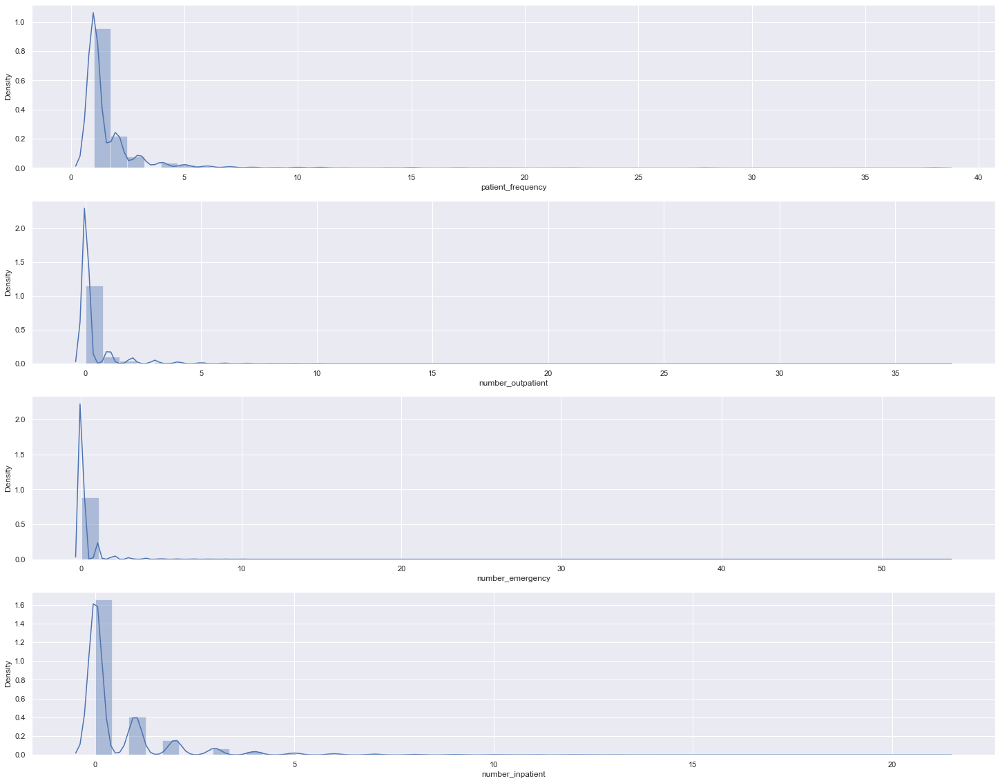

In [22]:
plt.figure(figsize=(25,20))
for i,col in enumerate(number_of_visits):
    plt.subplot(4,1,i+1)
    sns.distplot(df_visual_diabetic[col])

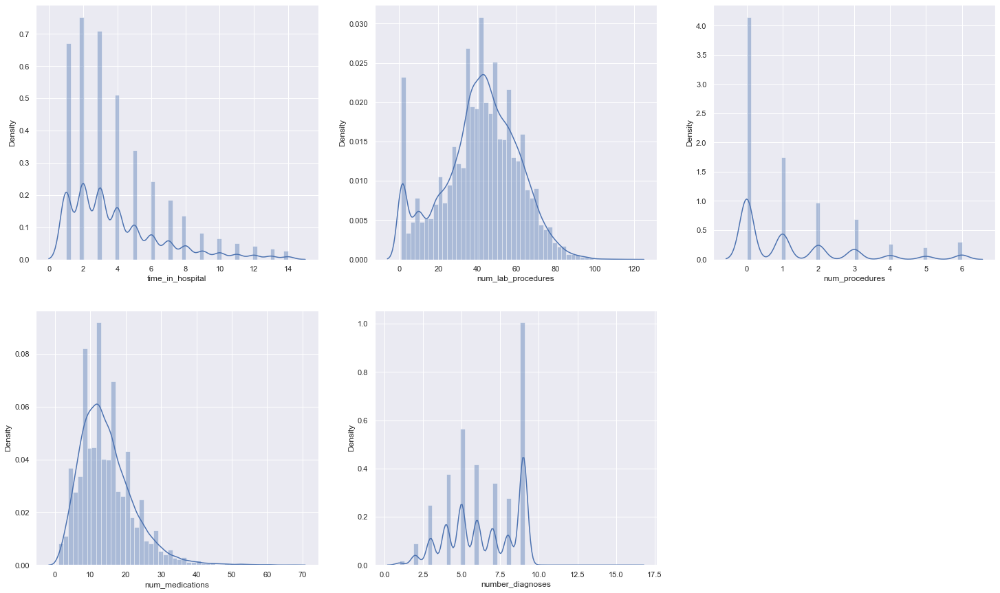

In [23]:
plt.figure(figsize=(25,15))
for i,col in enumerate(number_of_hospital_formalities):
    plt.subplot(2,3,i+1)
    sns.distplot(df_visual_diabetic[col])

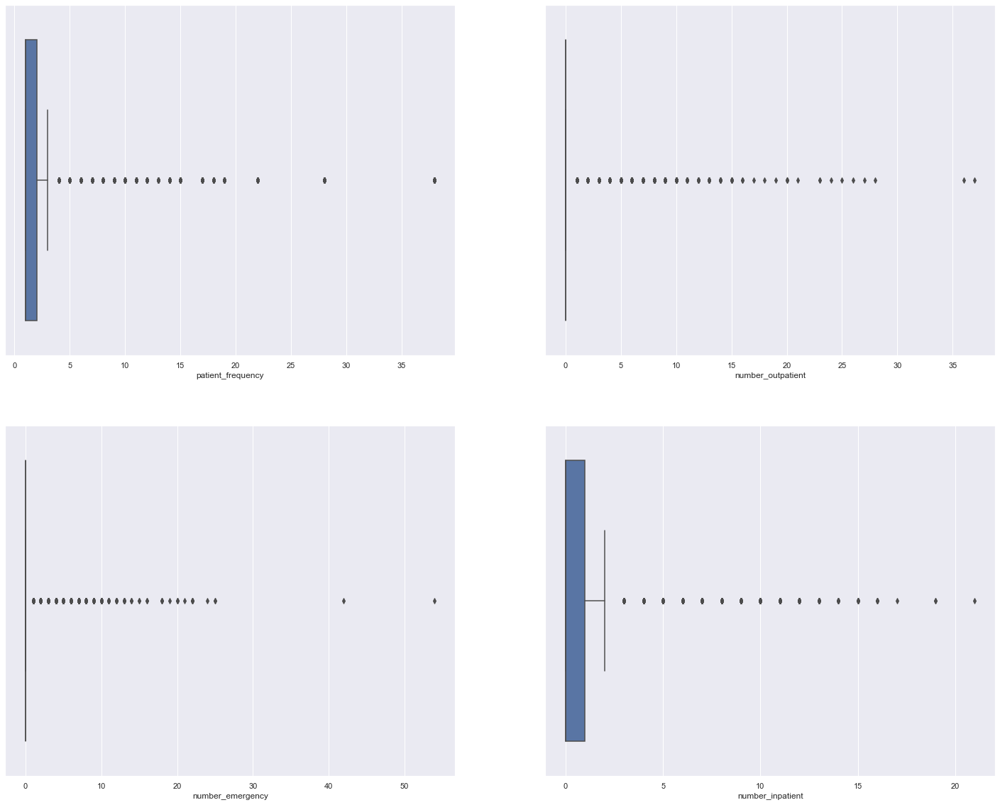

In [24]:
plt.figure(figsize=(25,20))
for i,col in enumerate(number_of_visits):
    plt.subplot(2,2,i+1)
    sns.boxplot(df_visual_diabetic[col])

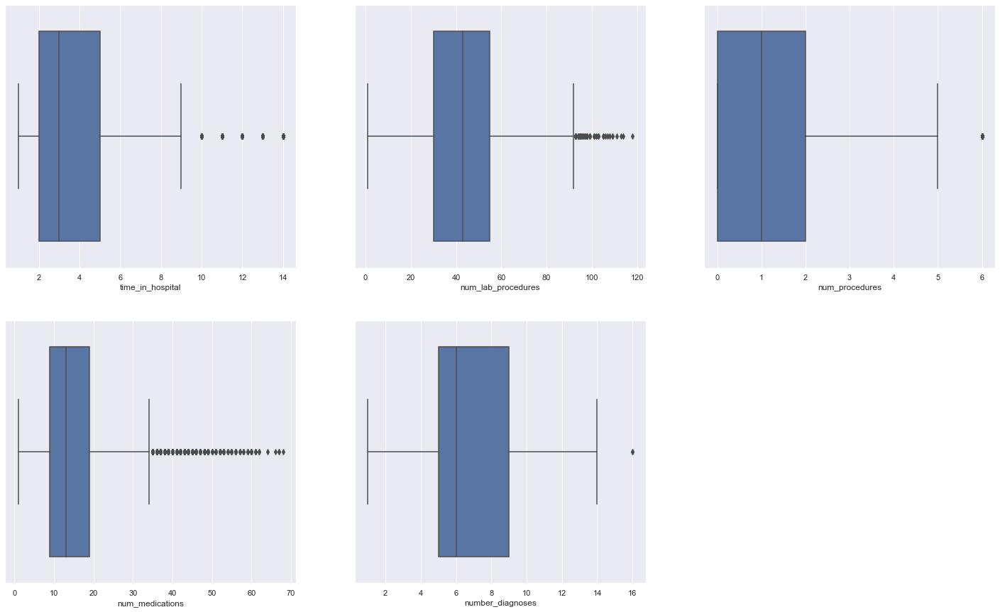

In [25]:
plt.figure(figsize=(25,15))
for i,col in enumerate(number_of_hospital_formalities):
    plt.subplot(2,3,i+1)
    sns.boxplot(df_visual_diabetic[col])

In [26]:
skew_of_features = pd.DataFrame([df_visual_diabetic[col].skew() for col in [df_visual_diabetic.select_dtypes(include=np.number).columns]],index=['SKEW']).T

In [27]:
skew_of_features.sort_values(by='SKEW',ascending=False)

,SKEW
number_emergency,14.306288
number_outpatient,8.568073
patient_frequency,8.440782
number_inpatient,4.175500
num_procedures,1.517870
time_in_hospital,1.338328
num_medications,1.216204
patient_nbr,0.590511
num_lab_procedures,-0.212050
number_diagnoses,-0.250277


In [28]:
# The columns that are highly skewed are number_outpatients and number_emergencys..  
# As we can see from the plots and the skew we can understand the most of the numerical columns are right skewed..

In [29]:
# Instead of transforming the variables to bring them to a normal distribution 
# and winzorizing to eliminate outliers to make the model perform better we keep
# the data as it is and analise how the model performs..
# Since these datapoints may have a significant influence on the target variable which has to be learnt by the model..

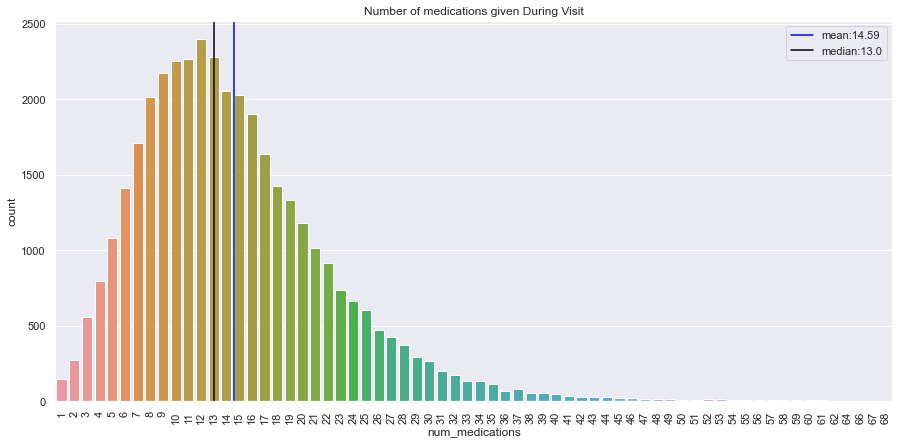

In [30]:
plt.figure(figsize=(15,7))
sns.countplot(x='num_medications', data=df_visual_diabetic)
mean, median = np.mean(df_visual_diabetic.num_medications), np.median(df_visual_diabetic.num_medications)
plt.axvline(mean-df_visual_diabetic.num_medications.min(), color='blue', label=f'mean:{round(mean,2)}')
plt.axvline(median-df_visual_diabetic.num_medications.min(), color='black', label=f'median:{round(median,2)}')
plt.title('Number of medications given During Visit')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [31]:
# an average of 16-17 distinct drugs has been administered per visit for each patient.
# do this wrt readmission in bivariate analysis..

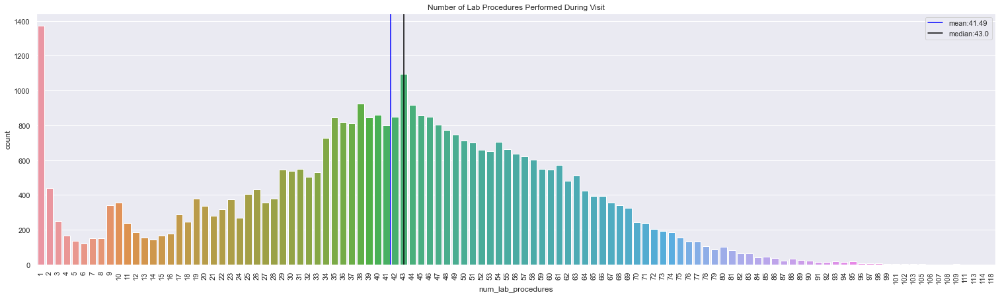

In [32]:
plt.figure(figsize=(26,7))
sns.countplot(x='num_lab_procedures', data=df_visual_diabetic)
mean, median = np.mean(df_visual_diabetic.num_lab_procedures), np.median(df_visual_diabetic.num_lab_procedures)
plt.axvline(mean-df_visual_diabetic.num_lab_procedures.min(), color='blue', label=f'mean:{round(mean,2)}')
plt.axvline(median-df_visual_diabetic.num_lab_procedures.min(), color='black', label=f'median:{round(median,2)}')
plt.title('Number of Lab Procedures Performed During Visit')
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [33]:
# most of the time at an average 44 tests are taken on a patient, with the exception of 1....

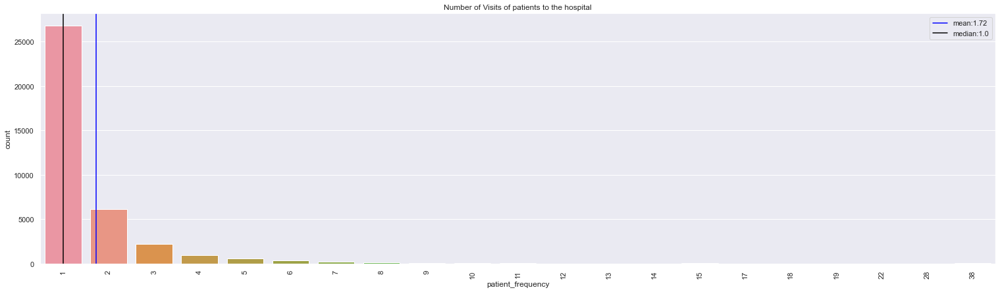

In [34]:
plt.figure(figsize=(26,7))
sns.countplot(x='patient_frequency', data=df_visual_diabetic)
mean, median = np.mean(df_visual_diabetic.patient_frequency), np.median(df_visual_diabetic.patient_frequency)
plt.axvline(mean-df_visual_diabetic.patient_frequency.min(), color='blue', label=f'mean:{round(mean,2)}')
plt.axvline(median-df_visual_diabetic.patient_frequency.min(), color='black', label=f'median:{round(median,2)}')
plt.title('Number of Visits of patients to the hospital')
plt.xticks(rotation=90)
plt.legend()
plt.show()

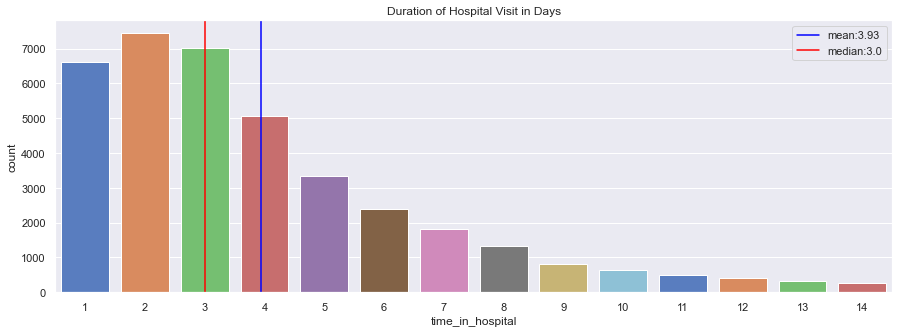

In [35]:
plt.figure(figsize=(15,5))
sns.countplot(x='time_in_hospital', palette='muted', data=df_visual_diabetic)
mean, median = np.mean(df_visual_diabetic['time_in_hospital']), np.median(df_visual_diabetic['time_in_hospital'])
plt.axvline(mean-df_visual_diabetic.time_in_hospital.min(), color='blue', label=f'mean:{round(mean,2)}')
plt.axvline(median-df_visual_diabetic.time_in_hospital.min(), color='red', label=f'median:{round(median,2)}')
plt.title('Duration of Hospital Visit in Days')
plt.legend()
plt.show()

In [36]:
# On an average patients spend 4 and half days in the hospital..

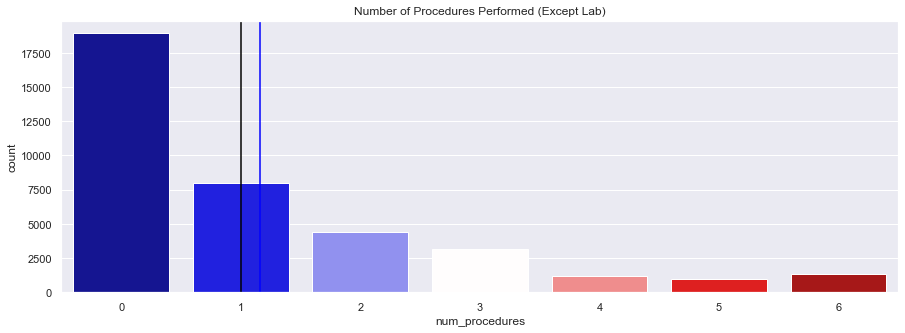

In [37]:
plt.figure(figsize=(15,5))
sns.countplot(x='num_procedures', palette='seismic', data=df_visual_diabetic)
mean, median = np.mean(df_visual_diabetic.num_procedures), np.median(df_visual_diabetic.num_procedures)
plt.axvline(mean, color='blue', label=f'mean:{round(mean,2)}')
plt.axvline(median, color='black', label=f'median:{round(median,2)}')
plt.title('Number of Procedures Performed (Except Lab)');

In [38]:
# For many of the patients there were no procedures performed.
# Number of manual checkups (procedures) performed by the doctor before lab procedures is usually 1 per patient.. 

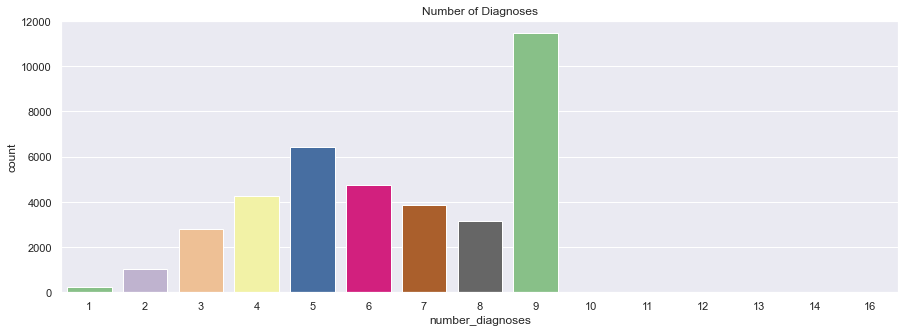

In [39]:
# number of diagnoses and readmit rate
plt.figure(figsize=(15,5))
ax = sns.countplot(x='number_diagnoses', palette='Accent', data=df_visual_diabetic)
plt.title('Number of Diagnoses')
plt.show()

In [40]:
# For many of the patients 9 lab diagnoses are performed...

### DISTRIBUTION OF CATEGORICAL VARIABLES

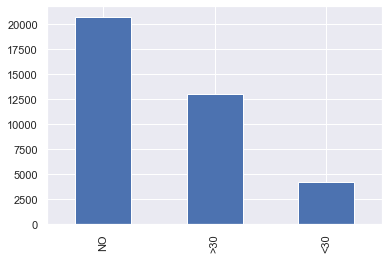

In [41]:
df_visual_diabetic['readmitted'].value_counts().plot(kind='bar');

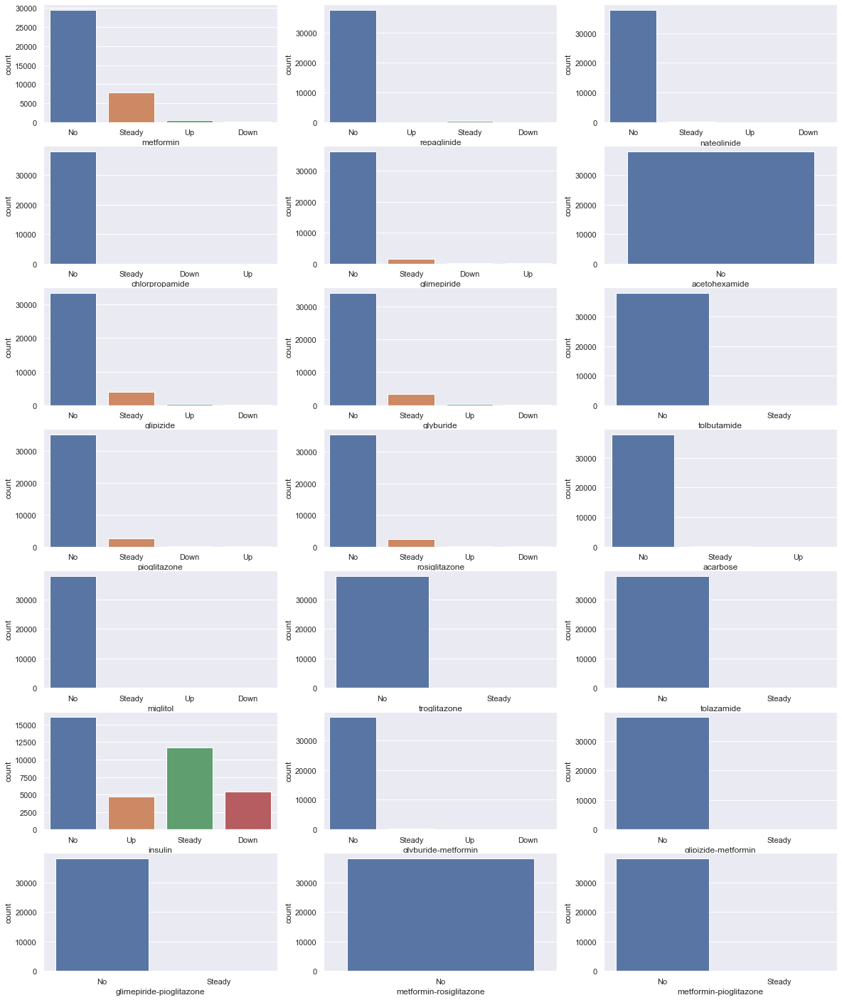

In [42]:
plt.figure(figsize=(20,25))
for i,col in enumerate(drugs_list):
    plt.subplot(7,3,i+1)
    sns.countplot(x=df_visual_diabetic[col])

In [43]:
# Many drugs in the dataset are not administered to patients..Only insulin seems to be administered to majority
# of the patients..
# From the domain understanding many of the drugs administered above are for type 2 diabetic patients..
# We will later perform statistical tests on these features to understand their significance wrt the target column..

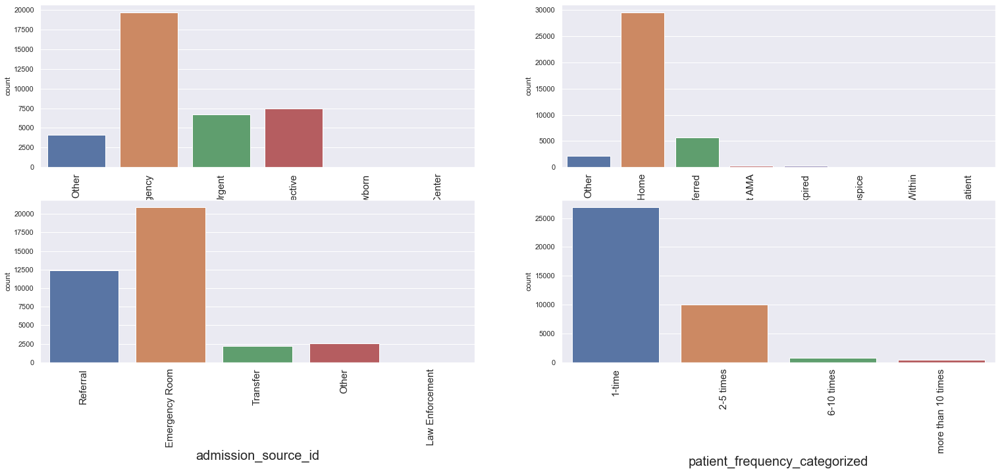

In [44]:
plt.figure(figsize=(26, 10))
for i,col in enumerate(patient_formalities_list):
    plt.subplot(2,2,i+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(col,fontsize=20)
    sns.countplot(x=df_visual_diabetic[col])

In [45]:
# Admission_type_id gives the information about why a patient was admitted..Many of them seem to have got admitted
# in emergency and urgent conditions..around 74000 patients..Around 20000 patients are admitted with prior formalities verified.
# Admission source id talks about how the patient got admitted..It may be because of someone's referral or transfer
# from other hospital.. It is dominated by Emergency room
# Discharge DispositionId gives the detail whether the patient was discharged to home after treatment or was transferred to
# other hospitals for various reasons..A considerably good number of patients were dischrged back home..Around 20000 patients
# were traansferred to other hospitals or care centres..
# left AMA : left against medical advice : Patient refuses to stay for continued care..

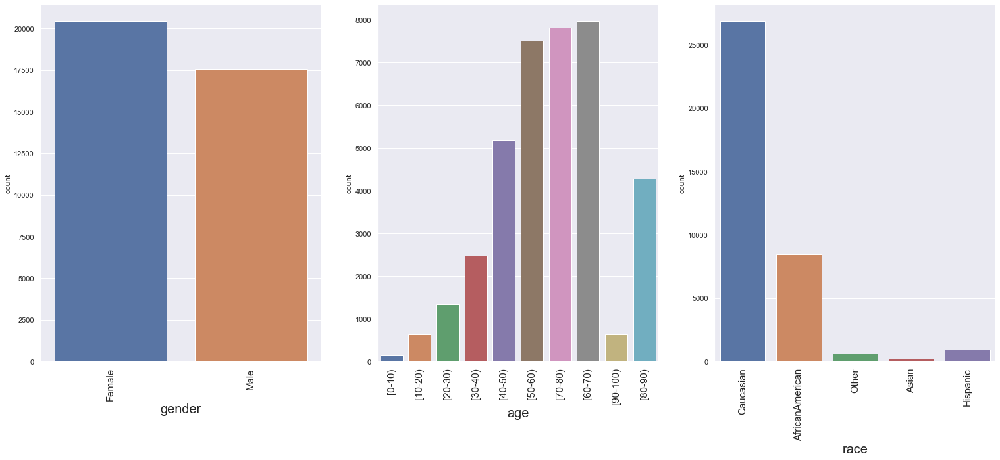

In [46]:
plt.figure(figsize=(26, 10))
for i,col in enumerate(patient_demographics_list):
    plt.subplot(1,3,i+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(col,fontsize=20)
    sns.countplot(x=df_visual_diabetic[col])

In [47]:
# As we can see the gender is balanced, oddly there are more females compared to that of males
# Majority of the patients are senior citizends..
# Caucasians are high..

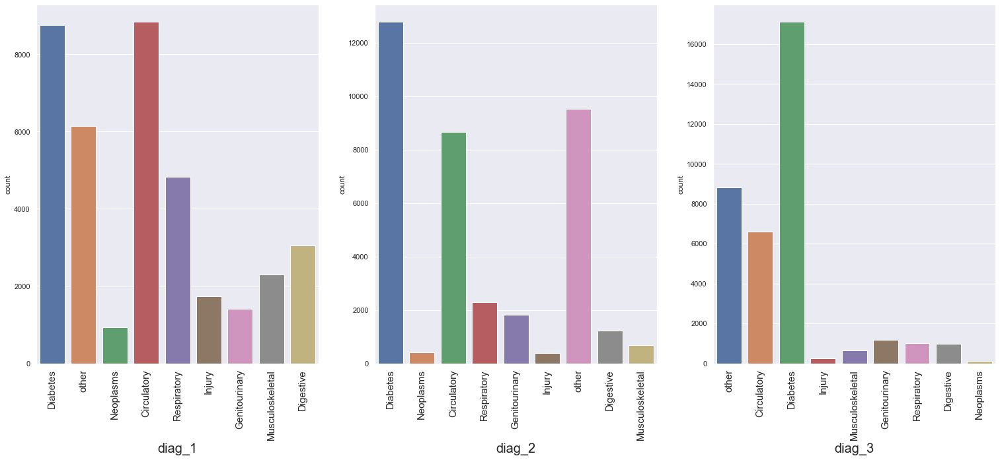

In [48]:
plt.figure(figsize=(26, 10))
for i,col in enumerate(diagnosis_list):
    plt.subplot(1,3,i+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(col,fontsize=20)
    sns.countplot(x=df_visual_diabetic[col])

In [49]:
#-------> Many patients have circulatory disorders...

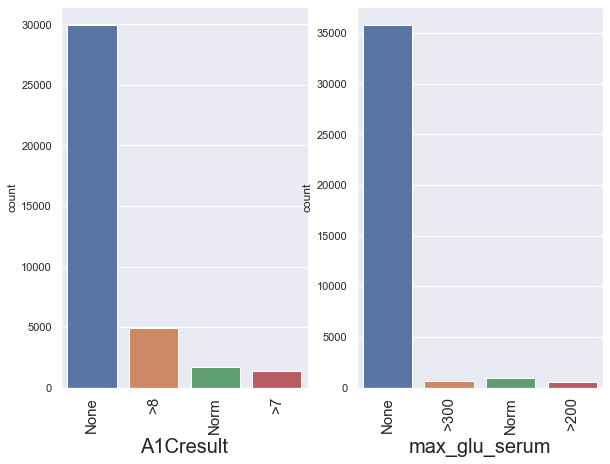

In [50]:
plt.figure(figsize=(15, 7))
for i,col in enumerate(primary_tests_list):
    plt.subplot(1,3,i+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(col,fontsize=20)
    sns.countplot(x=df_visual_diabetic[col])

In [51]:
# The details of the test results of A1C and maximum glucose serum is not specified for Most of the patients... 

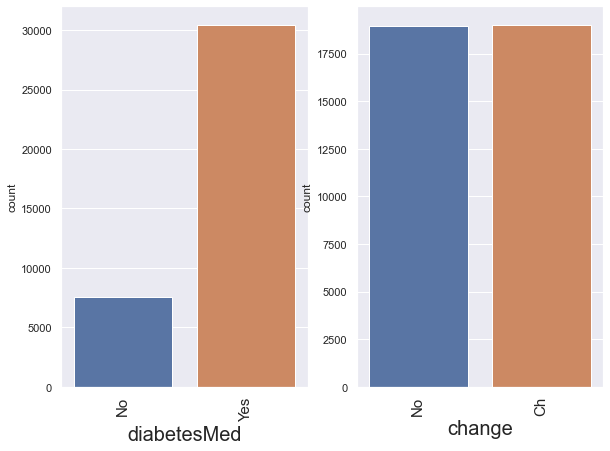

In [52]:
plt.figure(figsize=(15, 7))
for i,col in enumerate(medication_changes_list):
    plt.subplot(1,3,i+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(col,fontsize=20)
    sns.countplot(x=df_visual_diabetic[col])

In [53]:
# For around 23000 patients no diabetes medications were given..
# For around 46000 patients medications was changed..

### BIVARIATE ANALYSIS (NUMERICAL VS NUMERICAL)

### CORRELATION AMONG NUMERICAL VARIABLES

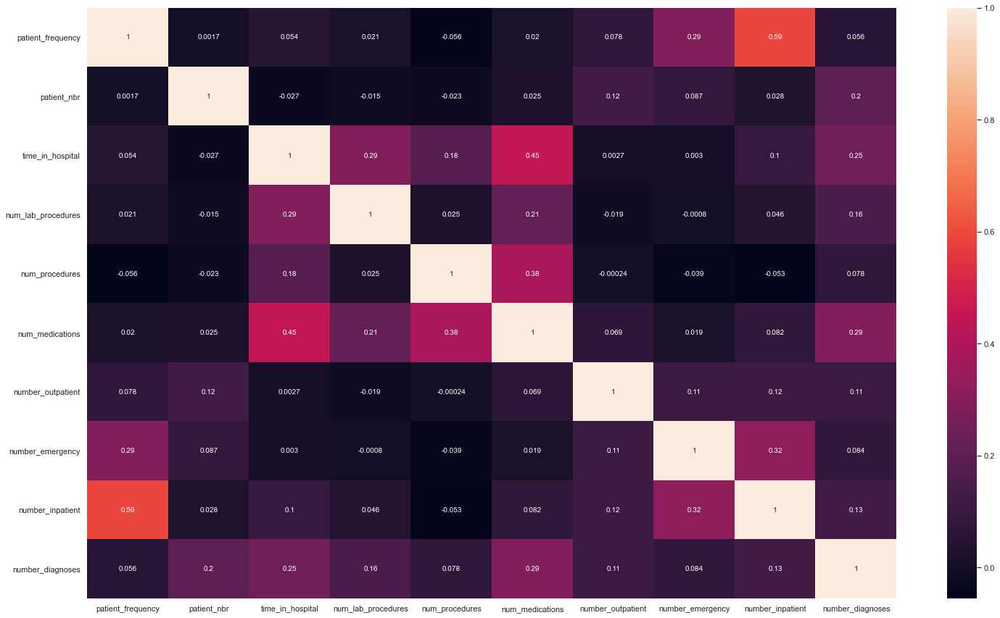

In [54]:
plt.figure(figsize=(25,15))
sns.heatmap(df_visual_diabetic.corr(),annot=True);

In [55]:
# As we can see from the heatmap there is no heavy multicollinearity among the numerical variables in the data..

In [56]:
# We analyse the relation between numerical columns that have high correlation compared to the rest..

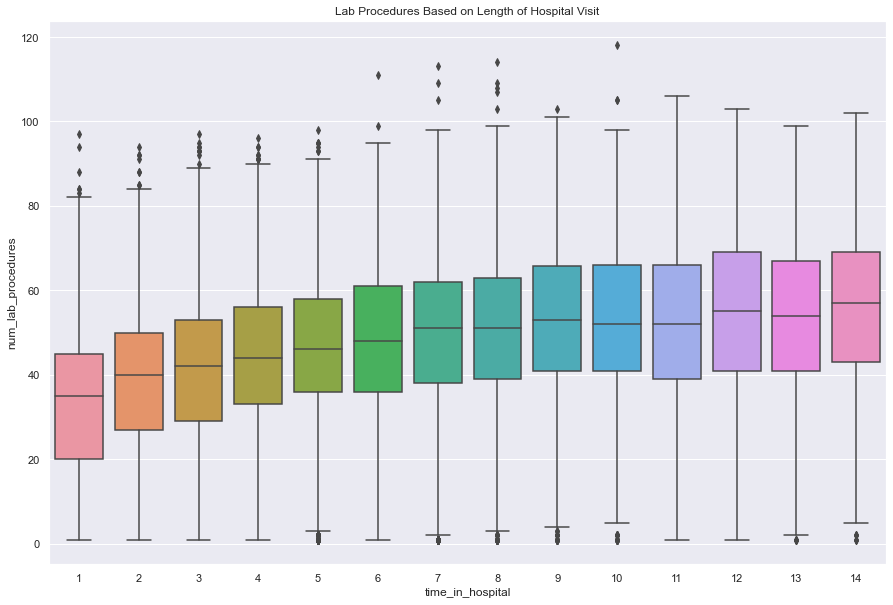

In [57]:
plt.figure(figsize=(15,10))
ax = sns.boxplot(x='time_in_hospital', y='num_lab_procedures', data=df_visual_diabetic.sort_values('time_in_hospital'))
# box_labels(ax, df.sort_values('time_in_hospital'),'time_in_hospital','num_lab_procedures') 
plt.title('Lab Procedures Based on Length of Hospital Visit')
plt.show()

In [58]:
# There is an increasing trend between time spent in the hospital and number of lab tests completed.
# This makes sense since patients with longer stays had more tests completed to properly diagnose their conditions.

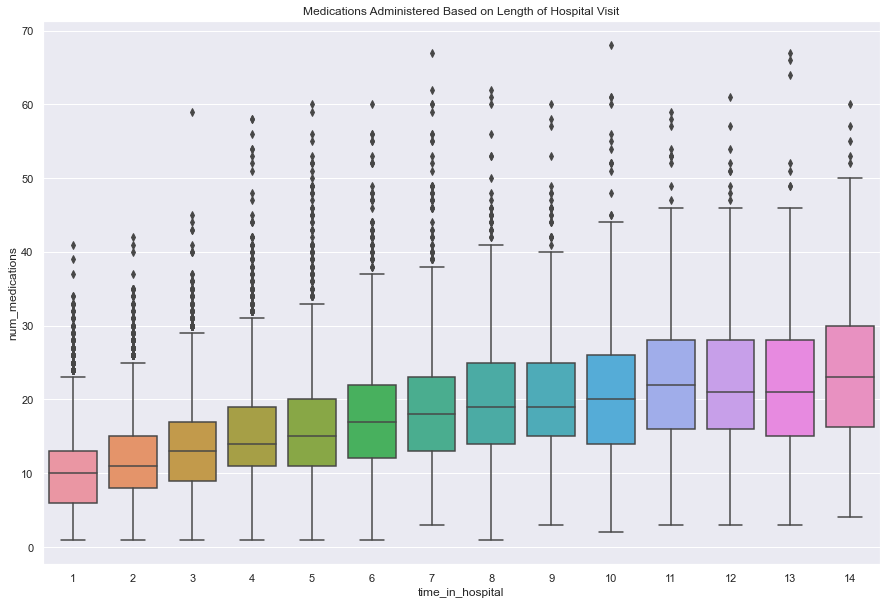

In [59]:
plt.figure(figsize=(15,10))
ax = sns.boxplot(x='time_in_hospital', y='num_medications', data=df_visual_diabetic)
plt.title('Medications Administered Based on Length of Hospital Visit')
plt.show()

In [60]:
# Patients who spend more time in the hospital receive more medications..

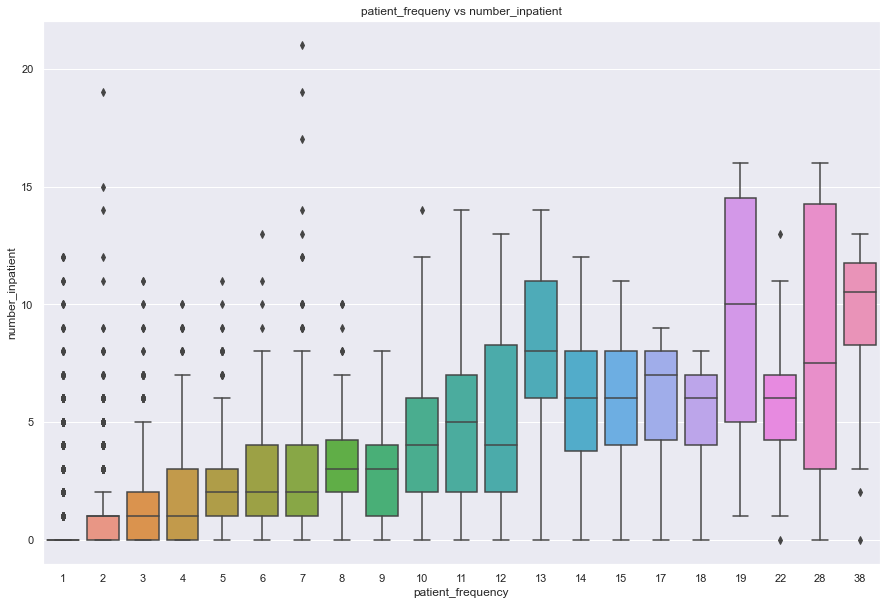

In [61]:
plt.figure(figsize=(15,10))
ax = sns.boxplot(x='patient_frequency', y='number_inpatient', data=df_visual_diabetic)
plt.title('patient_frequeny vs number_inpatient')
plt.show()

### NUMERICAL FEATURES VS TARGET

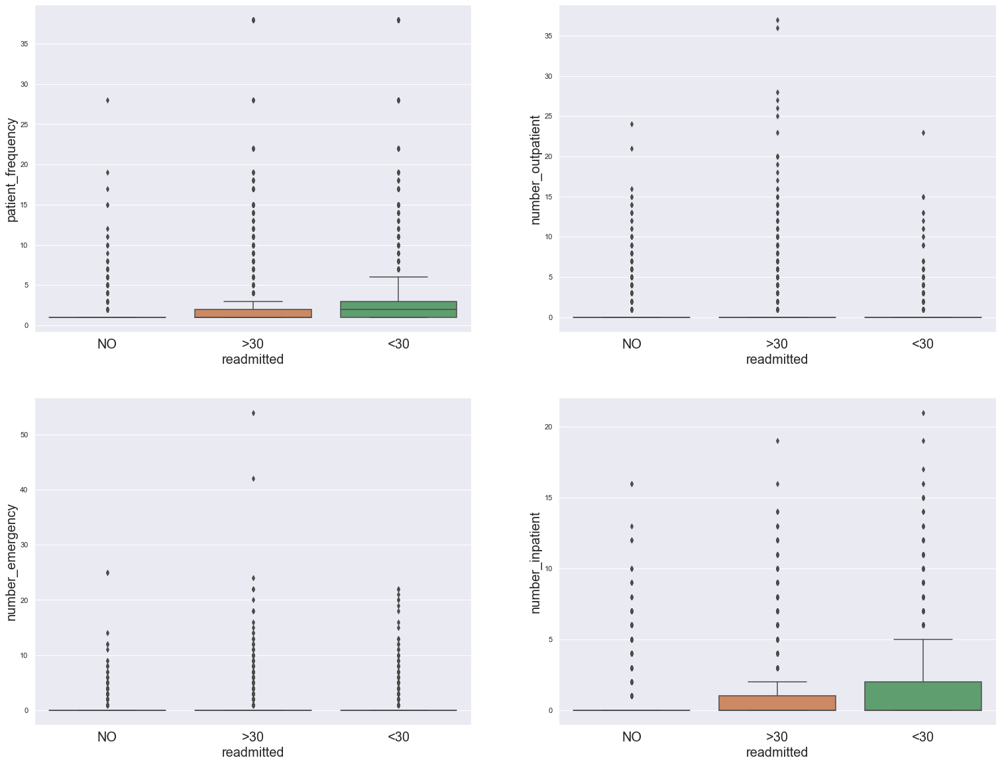

In [62]:
plt.figure(figsize=(26,20))
for i,col in enumerate(number_of_visits):
    plt.subplot(2,2,i+1)
    plt.ylabel(col,fontsize=20)
    plt.xlabel(col,fontsize=20)
    plt.xticks(fontsize=20)
    sns.boxplot(x=df_visual_diabetic['readmitted'],y=df_visual_diabetic[col])

In [63]:
# A good number of people are visiting inpatients who were re admitted within 30 days
# For majority of the inpatients there were no visitors in the previous year..
# A maximum of 21 visitors were there for one particular patient
# usually it is limited to 3 or less than 3 for majority of the patients
#----------> Number_inpatient vs diag..vs number of days

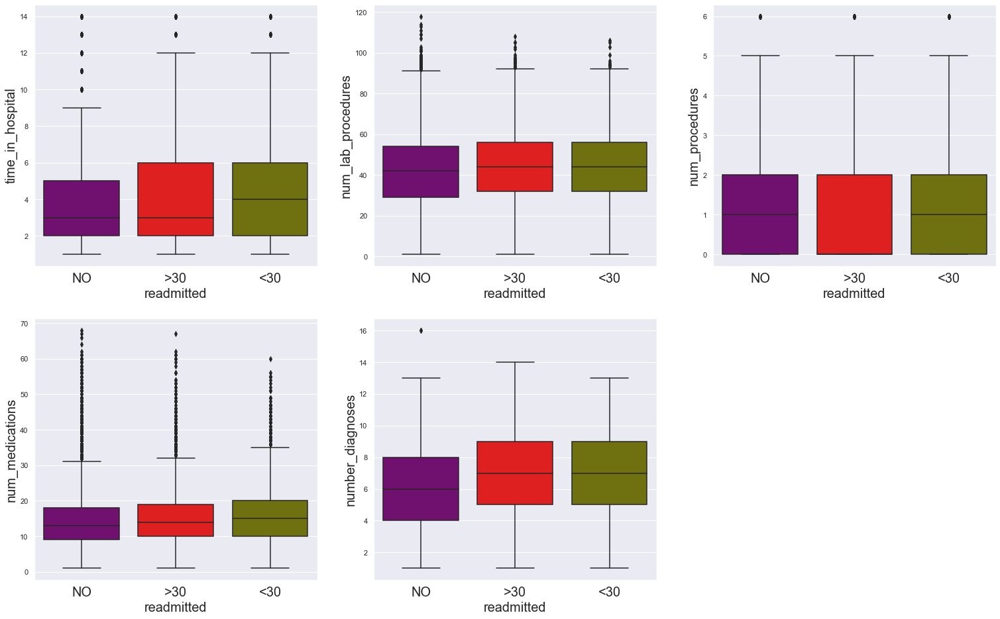

In [64]:
plt.figure(figsize=(26,16))
for i,col in enumerate(number_of_hospital_formalities):
    plt.subplot(2,3,i+1)
    plt.ylabel(col,fontsize=20)
    plt.xlabel(col,fontsize=20)
    plt.xticks(fontsize=20)
    sns.boxplot(x=df_visual_diabetic['readmitted'],y=df_visual_diabetic[col],palette='brg')

In [65]:
# From the above boxplots we get to know that certain numerical features do not have a significant impact on the target
# such as time_in_hospital, number_of_lab_procedures,number_procedures,number_of_medications and number_of_diagnoses

### CATEGORICAL FEATURES VS TARGET

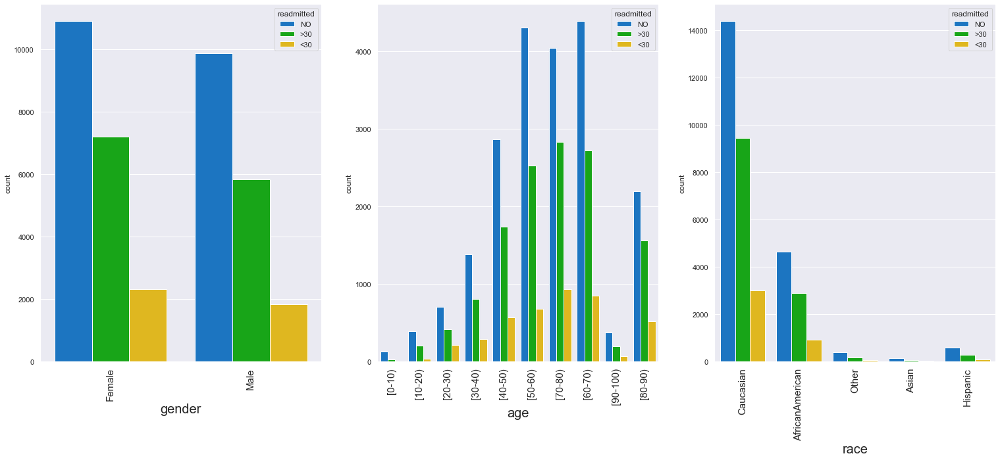

In [66]:
plt.figure(figsize=(26,10))
count =0
for i in patient_demographics_list:
    plt.subplot(1,3,count+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(df_visual_diabetic[i], hue=df_visual_diabetic['readmitted'], palette='nipy_spectral');
    count = count+1

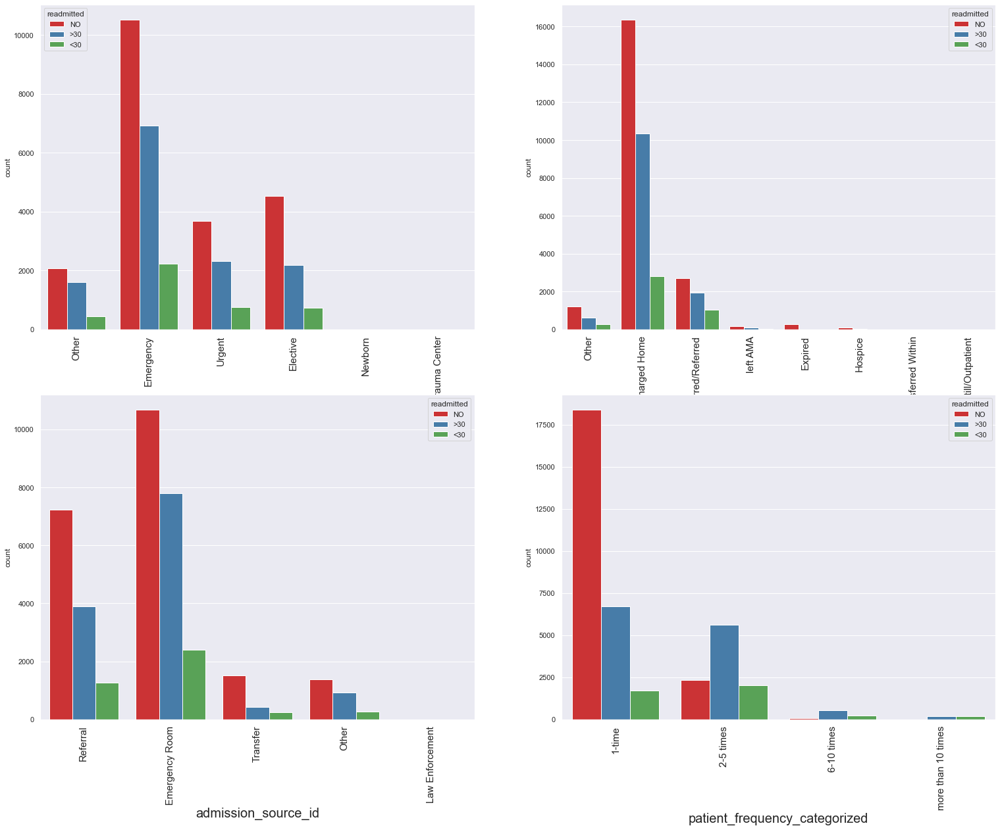

In [67]:
plt.figure(figsize=(26,20))
count =0
for i in patient_formalities_list:
    plt.subplot(2,2,count+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(df_visual_diabetic[i], hue=df_visual_diabetic['readmitted'], palette='Set1');
    count = count+1

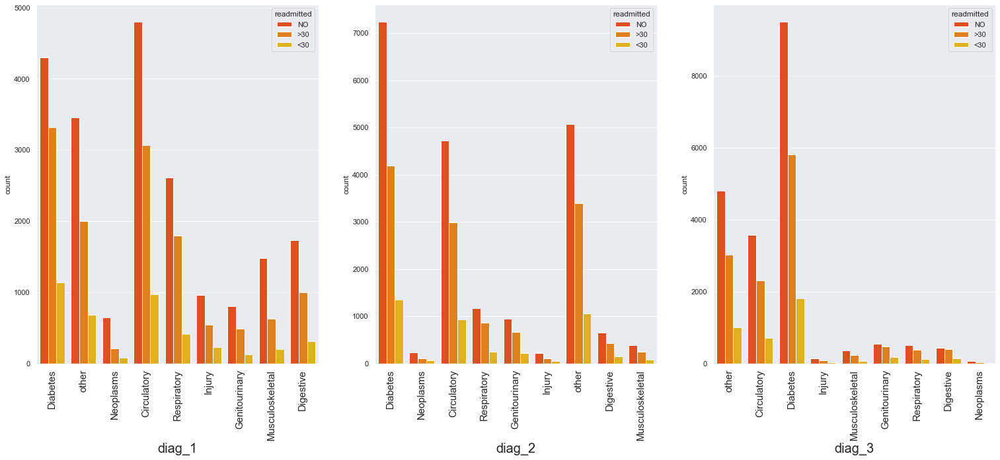

In [68]:
plt.figure(figsize=(26,10))
count =0
for i in diagnosis_list:
    plt.subplot(1,3,count+1)
    plt.xticks(rotation=90,fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(df_visual_diabetic[i], hue=df_visual_diabetic['readmitted'], palette='autumn');
    count = count+1

In [69]:
# Based on drugs

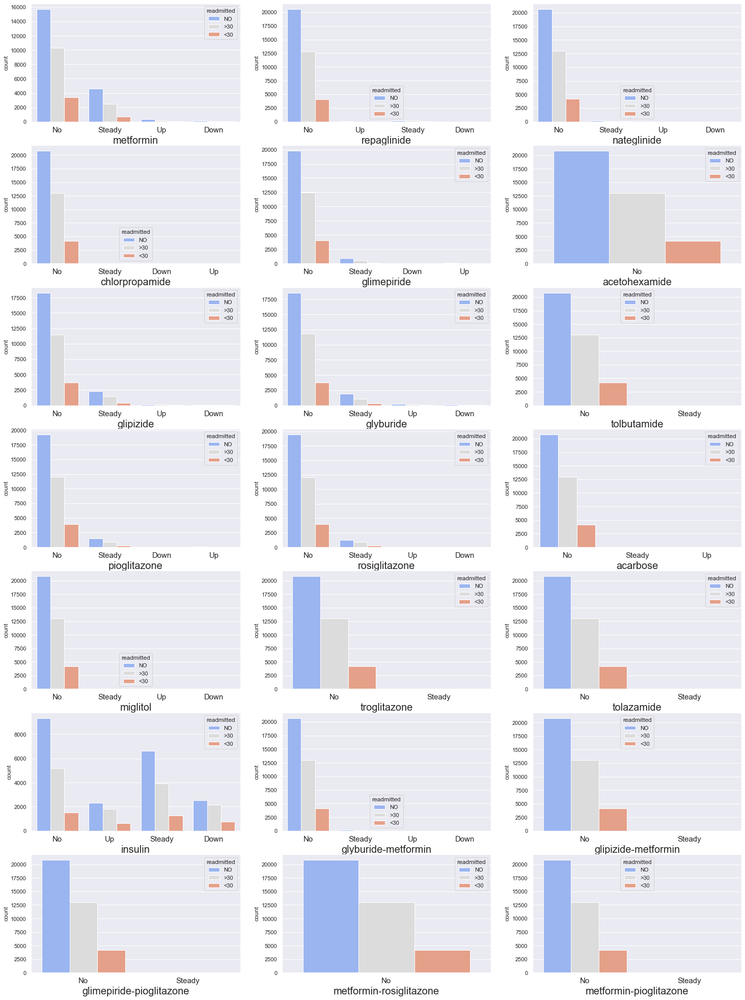

In [70]:
plt.figure(figsize=(25,35))
count =0
for i in drugs_list:
    plt.subplot(7,3,count+1)
    plt.xticks(fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(df_visual_diabetic[i], hue=df_visual_diabetic['readmitted'], palette='coolwarm');
    count = count+1

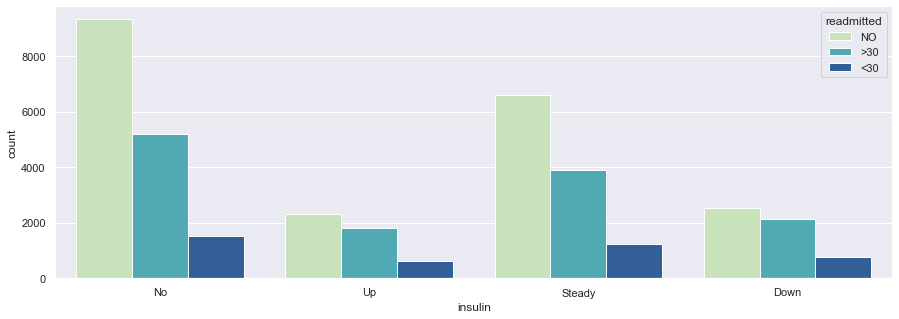

In [71]:
fig, ax =plt.subplots(figsize=(15,5))
sns.countplot(x="insulin", hue="readmitted", data=df_visual_diabetic, palette="YlGnBu")
plt.show()

In [72]:
# Understanding how the major drug 'Insulin' influences patient behaviour
# for majority of the patients Insulin was not administered
# people whose insulin doses were Up or down i.e increased are more likely to get re-admitted..
# Why down increases readmission???

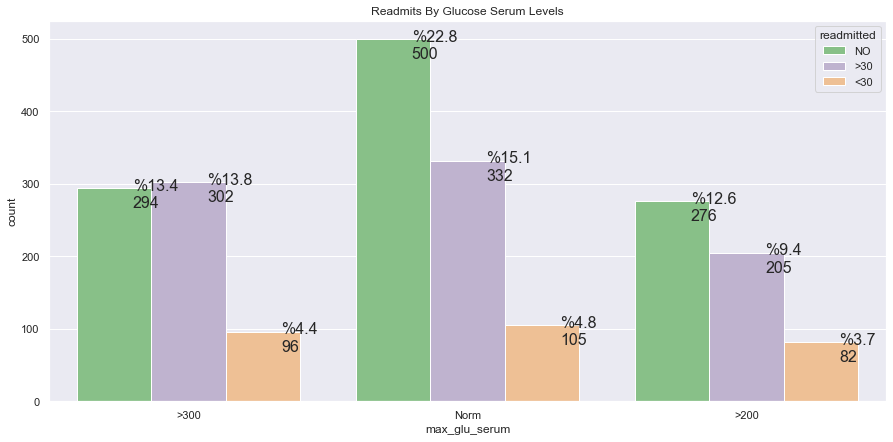

In [73]:
# exclude patients without a glucose reading
plt.figure(figsize=(15, 7))
glucose_none = df_visual_diabetic[df_visual_diabetic.max_glu_serum != 'None']

# glucose serum results and readmit impact
ax = sns.countplot(x='max_glu_serum', hue='readmitted', palette='Accent', data=glucose_none)
labels_catnum(ax,glucose_none)
plt.title('Readmits By Glucose Serum Levels')
plt.show()

In [74]:
# if the glucose serum test value with

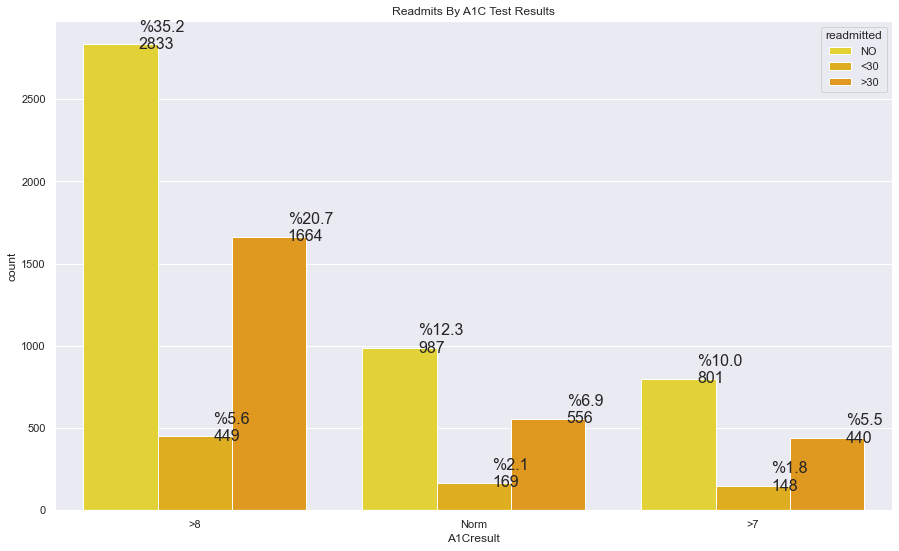

In [75]:
# exclude patients without an A1C reading
alc_none = df_visual_diabetic[df_visual_diabetic.A1Cresult != 'None']
plt.figure(figsize=(15, 9))
# A1C results and readmit impact
ax = sns.countplot(x='A1Cresult', hue='readmitted', palette='Wistia', data=alc_none)
labels_catnum(ax, alc_none)
plt.title('Readmits By A1C Test Results')
plt.show()

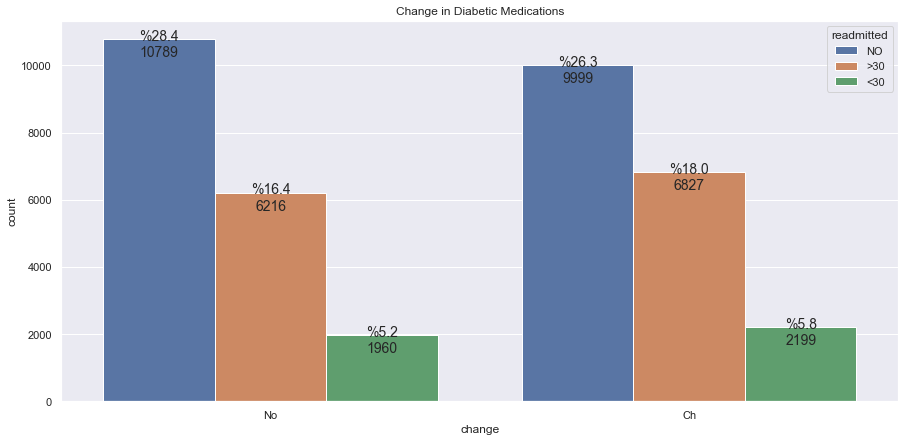

In [76]:
# change in medications
plt.figure(figsize=(15,7))
ax = sns.countplot(x='change', hue='readmitted', data=df_visual_diabetic)
labels(ax)
plt.title('Change in Diabetic Medications')
plt.show()

In [77]:
# if there is no change in medication the readmission rate is less..

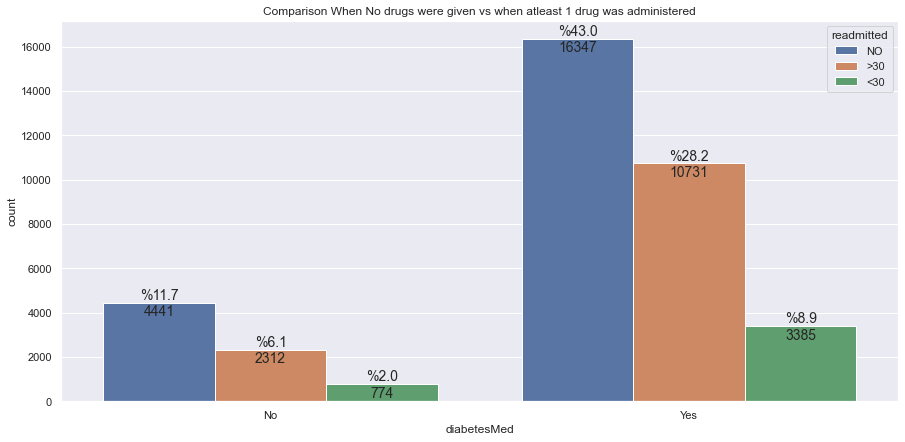

In [78]:
plt.figure(figsize=(15,7))
ax = sns.countplot(x='diabetesMed', hue='readmitted', data=df_visual_diabetic)
labels(ax)
plt.title('Comparison When No drugs were given vs when atleast 1 drug was administered')
plt.show()

In [79]:
#     No significant impact on patient readmission..

### CATEGORICAL VS CATEGORICAL

### PATIENT DEMOGRAPHICS VS REST

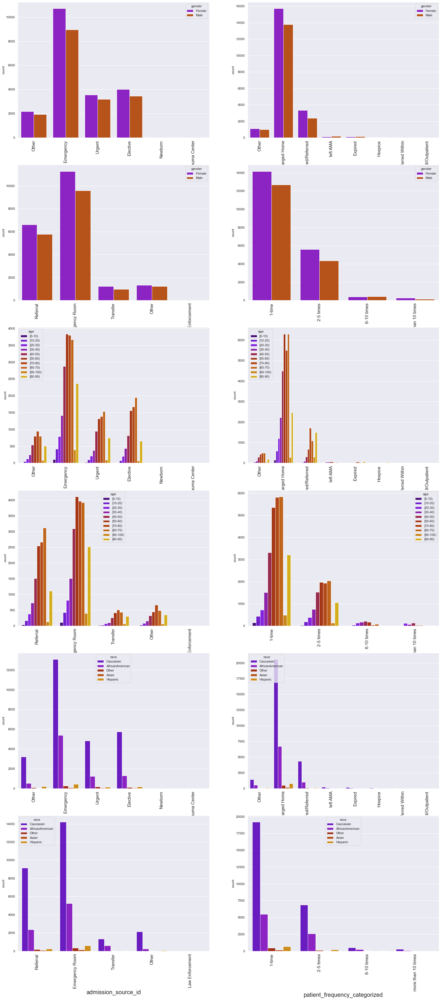

In [80]:
plt.figure(figsize=(26,60))
count =0
for i in patient_demographics_list:
    for j in patient_formalities_list:
        plt.subplot(6,2,count+1)
        plt.xticks(fontsize=15,rotation=90)
        plt.xlabel(i,fontsize=20)
        sns.countplot(x=j, hue=i,data=df_visual_diabetic, palette='gnuplot');
        count = count+1

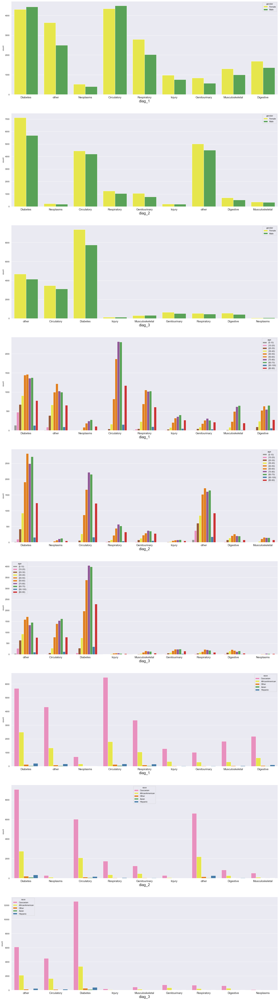

In [81]:
plt.figure(figsize=(26,99))
count =0
for i in patient_demographics_list:
    for j in diagnosis_list:
        plt.subplot(9,1,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        sns.countplot(x=j, hue=i,data=df_visual_diabetic, palette='Set1_r');
        count = count+1

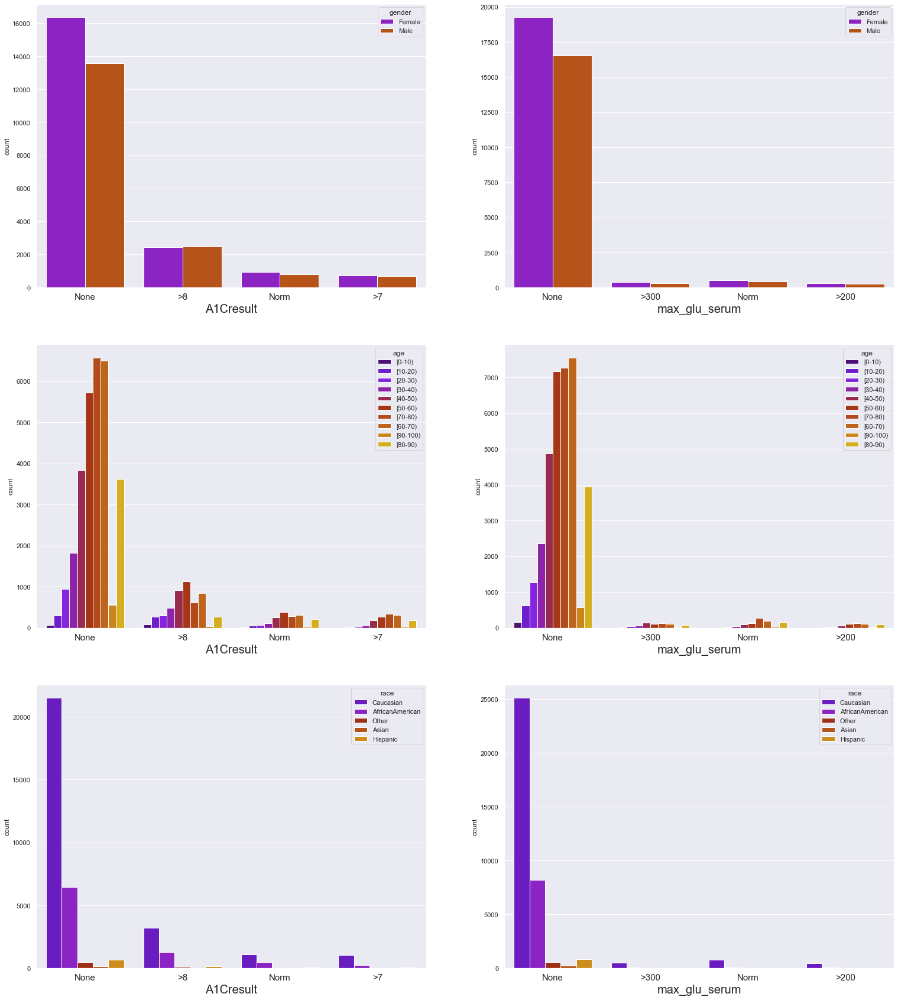

In [82]:
plt.figure(figsize=(26,30))
count =0
for i in patient_demographics_list:
    for j in primary_tests_list:
        plt.subplot(3,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        sns.countplot(x=j, hue=i,data=df_visual_diabetic, palette='gnuplot');
        count = count+1

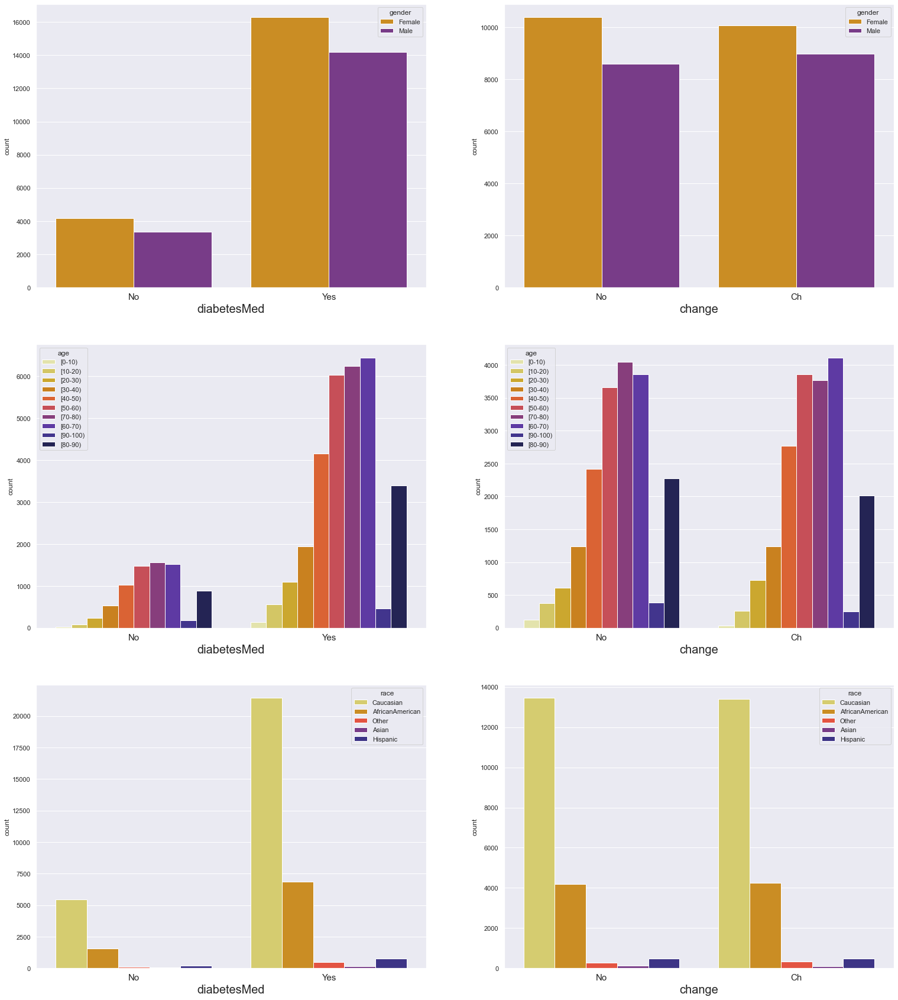

In [83]:
plt.figure(figsize=(26,30))
count =0
for i in patient_demographics_list:
    for j in medication_changes_list:
        plt.subplot(3,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        sns.countplot(x=j, hue=i,data=df_visual_diabetic, palette='CMRmap_r');
        count = count+1

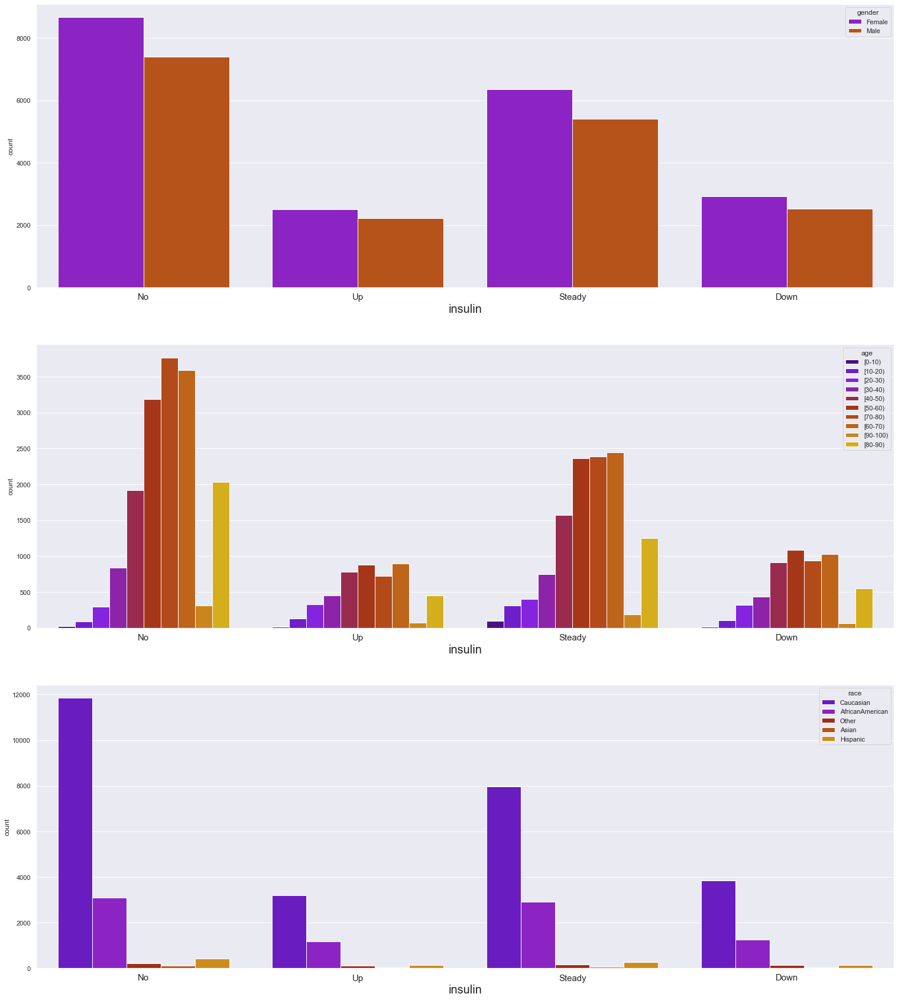

In [84]:
plt.figure(figsize=(26,30))
count =0
for i in patient_demographics_list:
    plt.subplot(3,1,count+1)
    plt.xticks(fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(x='insulin', hue=i,data=df_visual_diabetic, palette='gnuplot');
    count = count+1

### PATIENT FORMALITIES VS REST

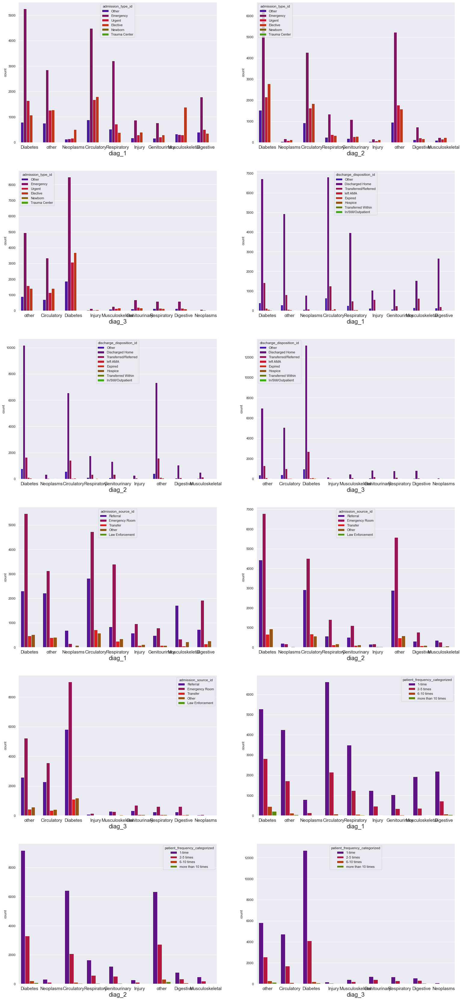

In [85]:
plt.figure(figsize=(26,60))
count =0
for i in patient_formalities_list:
    for j in diagnosis_list:
        plt.subplot(6,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.countplot(x=j, hue=i,data=df_visual_diabetic, palette='brg');
        count = count+1

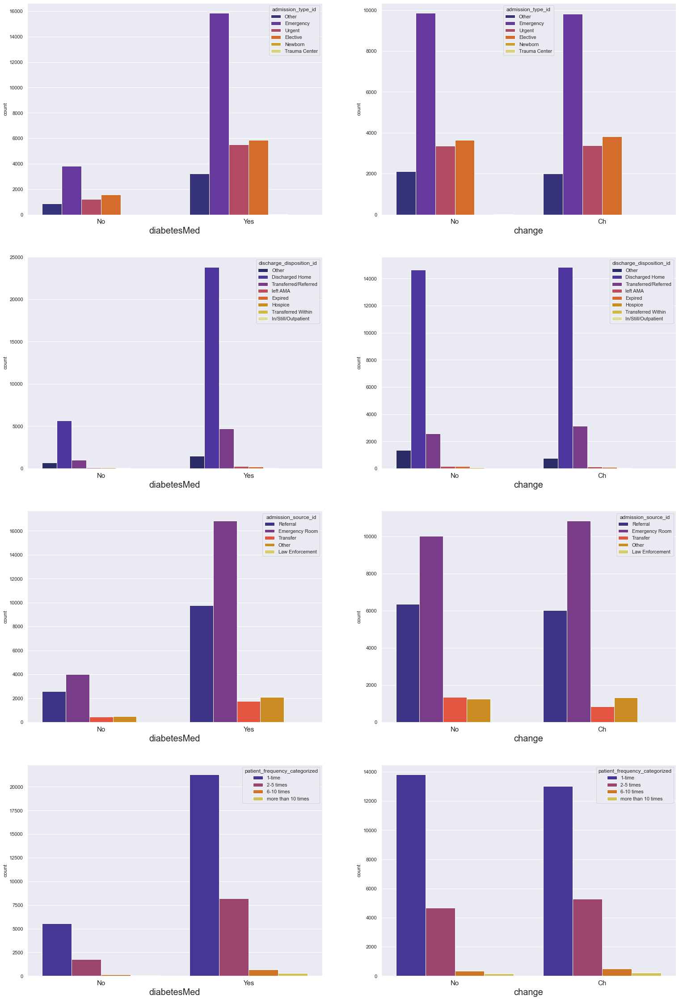

In [86]:
plt.figure(figsize=(26,40))
count =0
for i in patient_formalities_list:
    for j in medication_changes_list:
        plt.subplot(4,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        sns.countplot(x=j, hue=i,data=df_visual_diabetic, palette='CMRmap');
        count = count+1

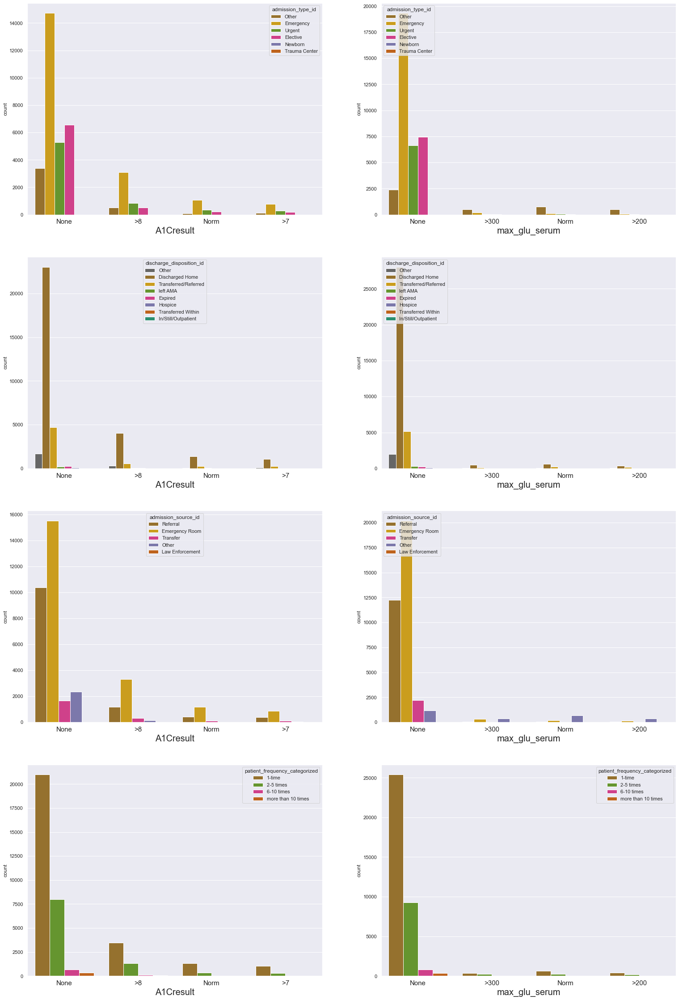

In [87]:
plt.figure(figsize=(26,40))
count =0
for i in patient_formalities_list:
    for j in primary_tests_list:
        plt.subplot(4,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.countplot(x=j, hue=i,data=df_visual_diabetic, palette='Dark2_r');
        count = count+1

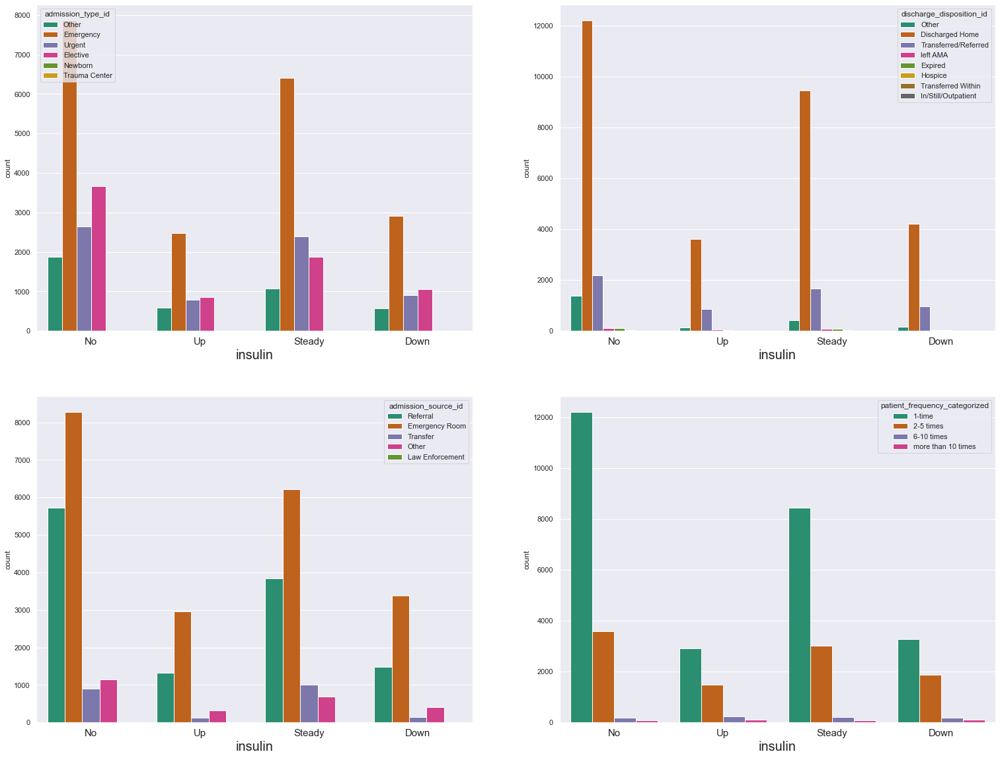

In [88]:
plt.figure(figsize=(26,20))
count =0
for i in patient_formalities_list:
    plt.subplot(2,2,count+1)
    plt.xticks(fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(x='insulin', hue=i,data=df_visual_diabetic, palette='Dark2');
    count = count+1

### DIAGNOSES VS REST

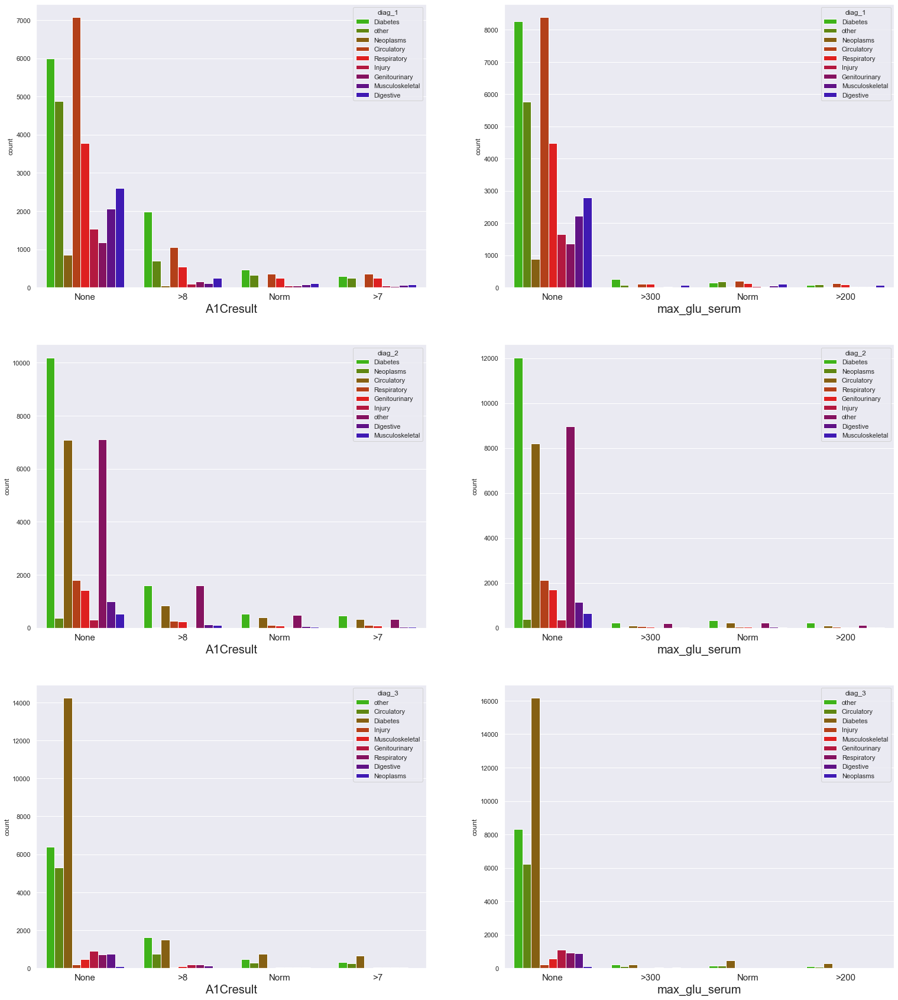

In [89]:
plt.figure(figsize=(26,30))
count =0
for i in diagnosis_list:
    for j in primary_tests_list:
        plt.subplot(3,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.countplot(x=j, hue=i,data=df_visual_diabetic, palette='brg_r');
        count = count+1

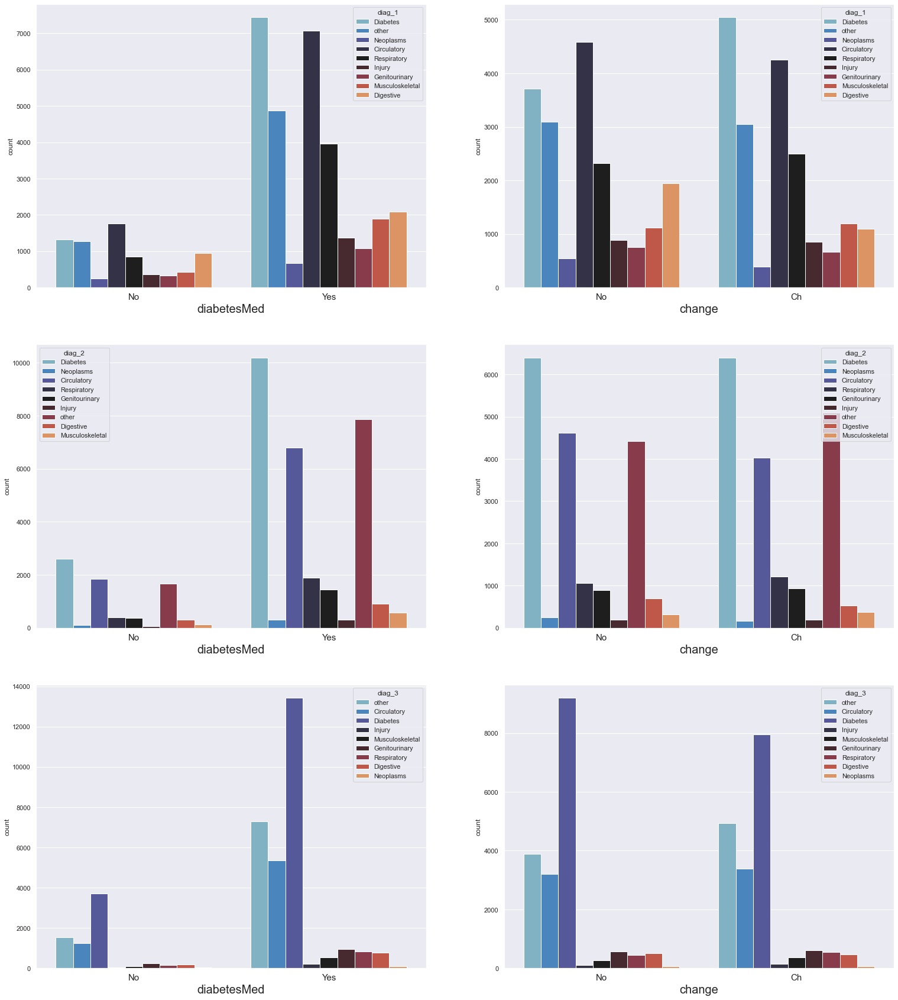

In [90]:
plt.figure(figsize=(26,30))
count =0
for i in diagnosis_list:
    for j in medication_changes_list:
        plt.subplot(3,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.countplot(x=j, hue=i,data=df_visual_diabetic, palette='icefire');
        count = count+1

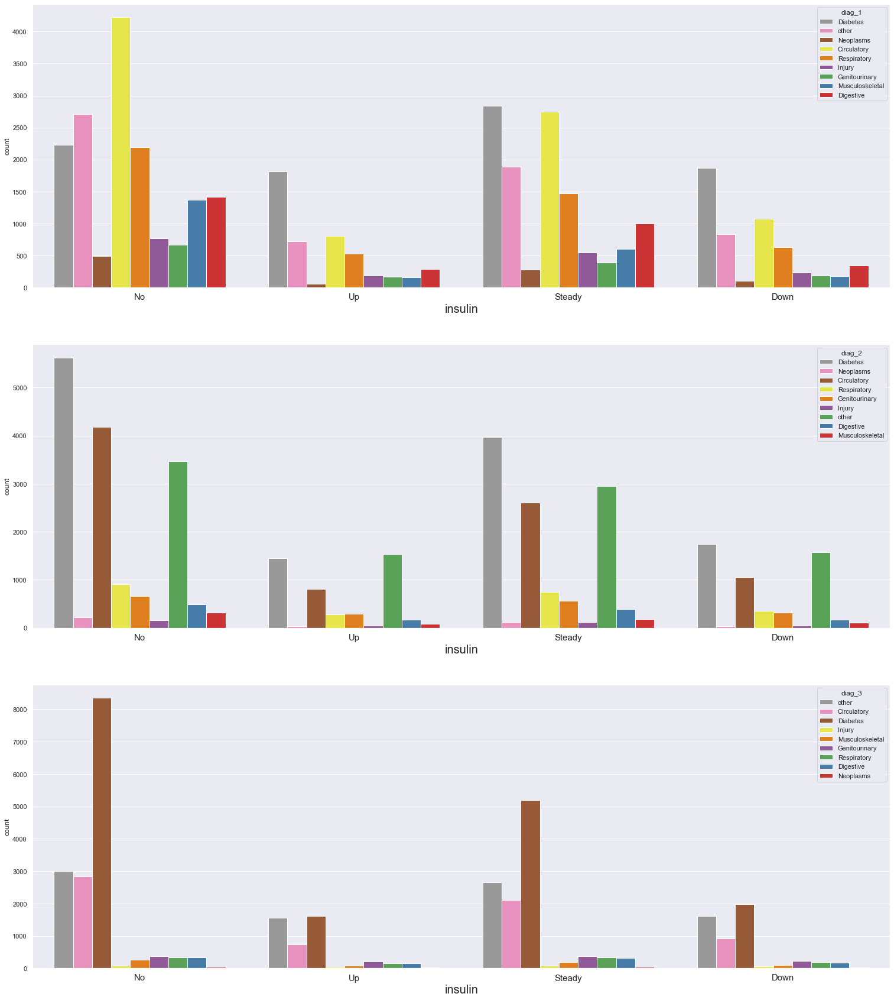

In [91]:
plt.figure(figsize=(26,30))
count =0
for i in diagnosis_list:
    plt.subplot(3,1,count+1)
    plt.xticks(fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(x='insulin', hue=i,data=df_visual_diabetic, palette='Set1_r');
    count = count+1

### PRIMARY TESTS VS REST

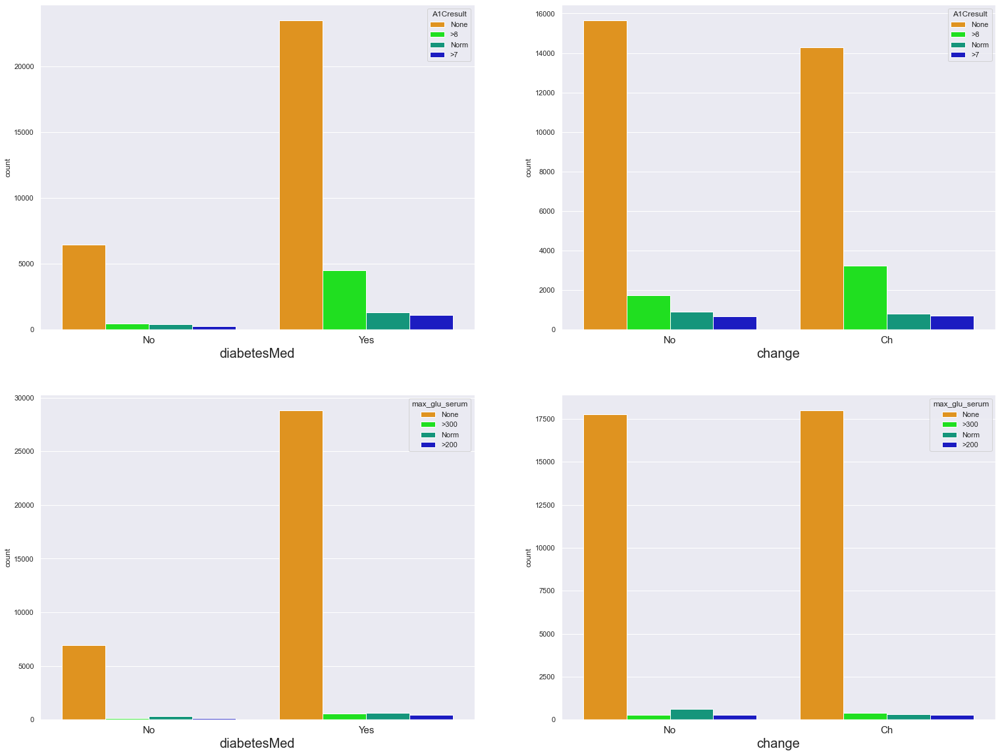

In [92]:
plt.figure(figsize=(26,20))
count =0
for i in primary_tests_list:
    for j in medication_changes_list:
        plt.subplot(2,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.countplot(x=j, hue=i,data=df_visual_diabetic, palette='nipy_spectral_r');
        count = count+1

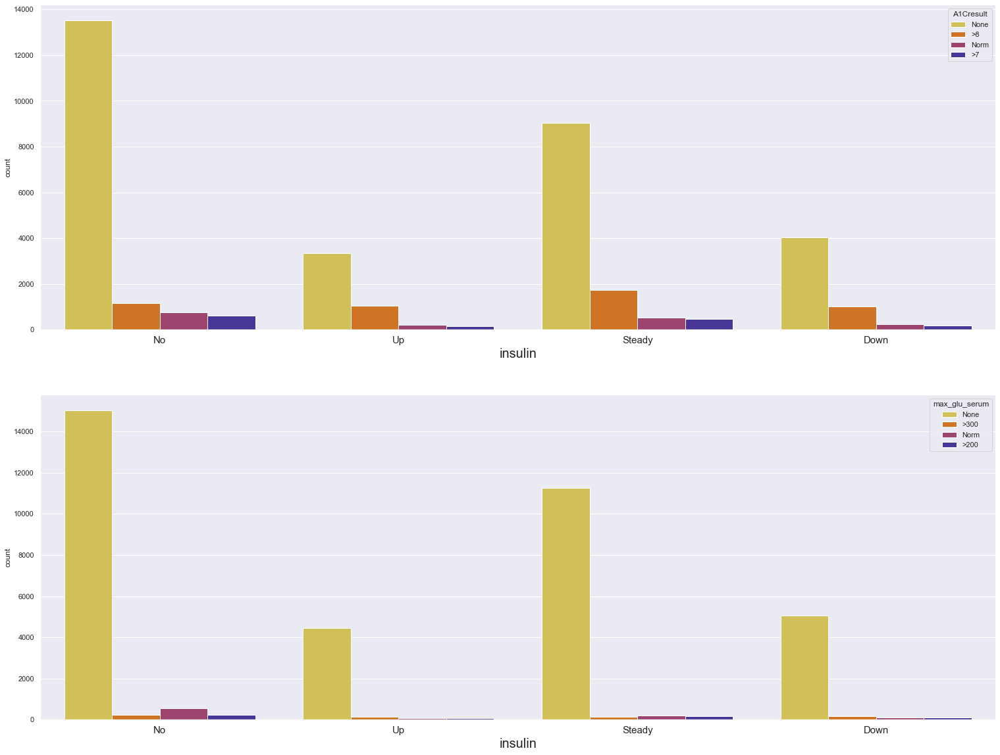

In [93]:
plt.figure(figsize=(26,20))
count =0
for i in primary_tests_list:
    plt.subplot(2,1,count+1)
    plt.xticks(fontsize=15)
    plt.xlabel(i,fontsize=20)
    sns.countplot(x='insulin', hue=i,data=df_visual_diabetic, palette='CMRmap_r');
    count = count+1

In [94]:
# reduced level of insulin for older people should be taken into consideration..doctors have to study..

In [95]:
# patient_demographics_list,hospital_formalities , drugs,diagnosis_list,primary_tests_list,medication_changes_list

In [96]:
# Have all the diabetic patients provided with insulin?

In [97]:
# comparison between patients who were not administered any drug and their diagnosis

### NUMERICAL FEATURES VS CATEGORICAL FEATURES

### patient_demographics_list vs Number_of_hospital_formalities 

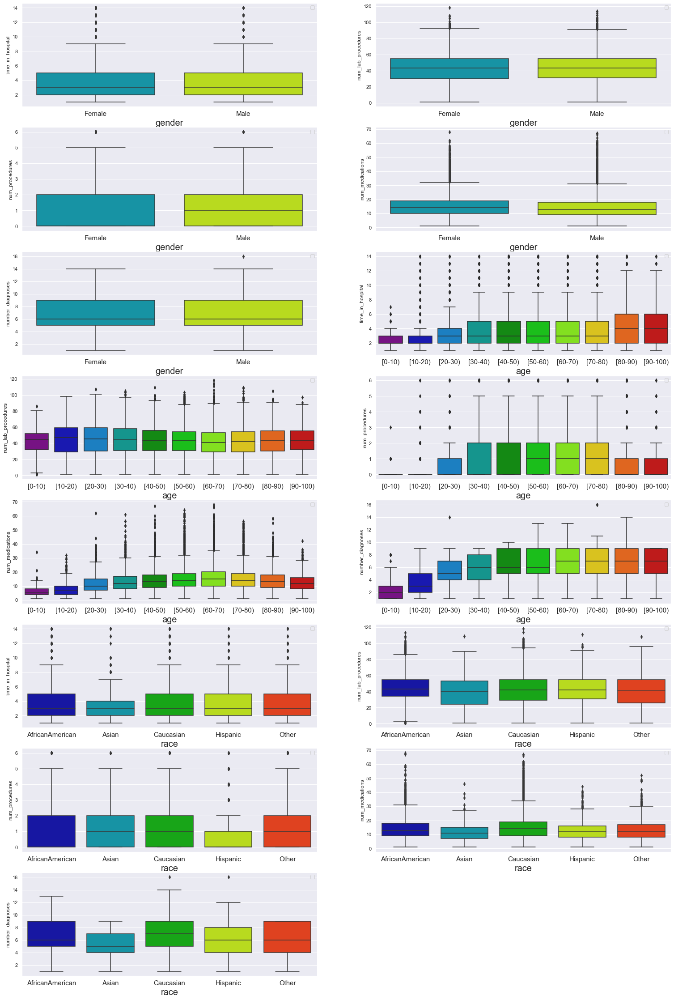

In [98]:
plt.figure(figsize=(26,40))
count =0
for i in patient_demographics_list:
    for j in number_of_hospital_formalities:
        plt.subplot(8,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='nipy_spectral')
        count += 1

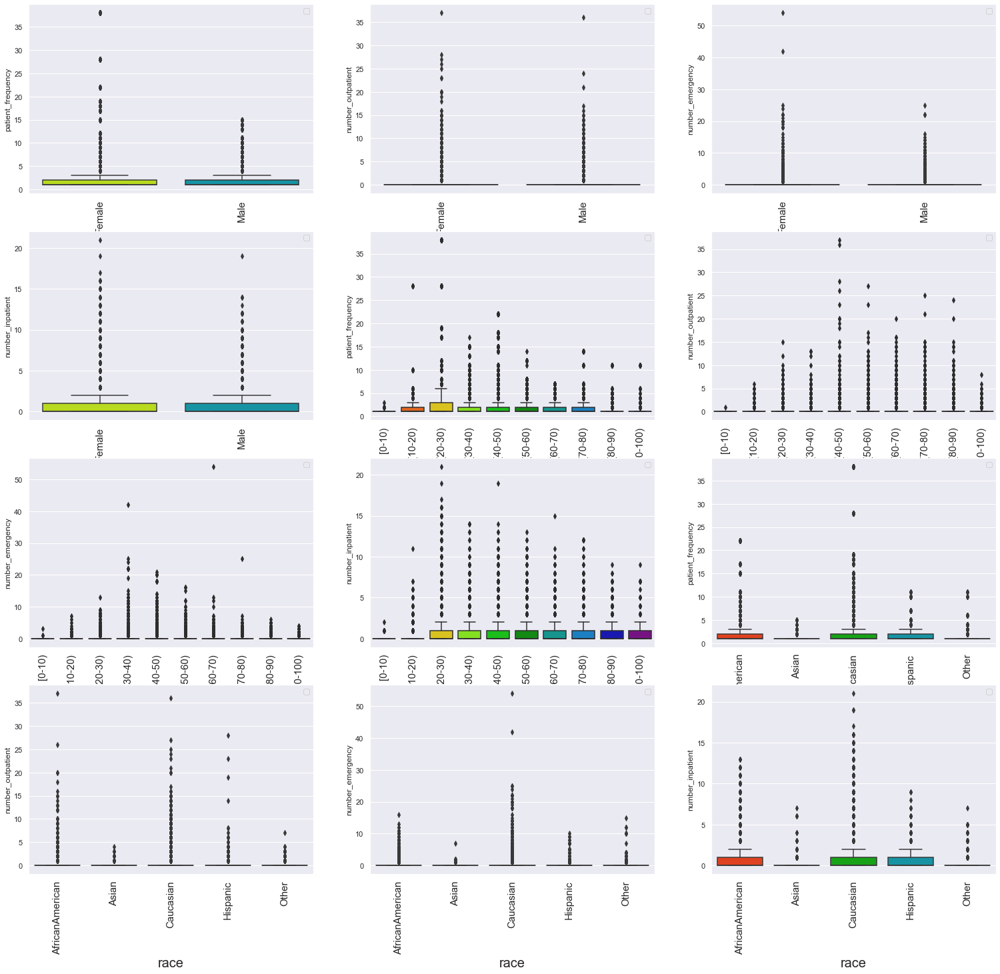

In [99]:
plt.figure(figsize=(26,24))
count =0
for i in patient_demographics_list:
    for j in number_of_visits:
        plt.subplot(4,3,count+1)
        plt.xticks(rotation=90,fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='nipy_spectral_r')
        count += 1

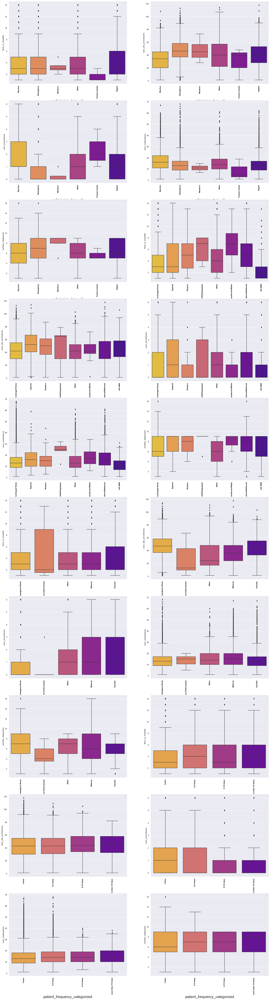

In [100]:
plt.figure(figsize=(26,100))
count =0
for i in patient_formalities_list:
    for j in number_of_hospital_formalities:
        plt.subplot(10,2,count+1)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='plasma_r')
        count += 1

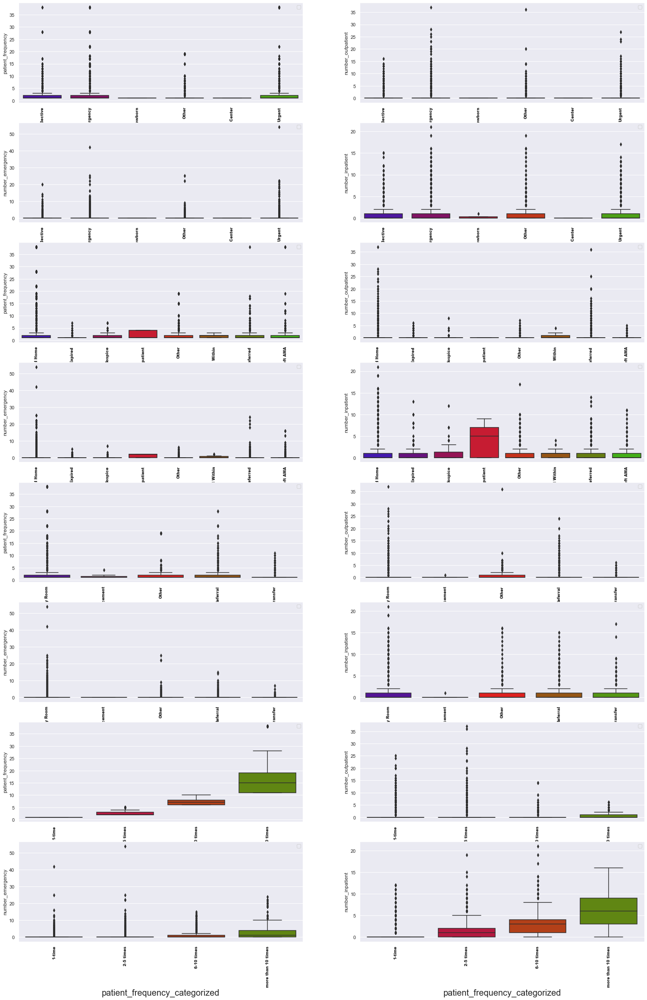

In [101]:
plt.figure(figsize=(26,40))
fig.tight_layout()
count =0
for i in patient_formalities_list:
    for j in number_of_visits:
        plt.subplot(8,2,count+1,)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='brg')
        count += 1

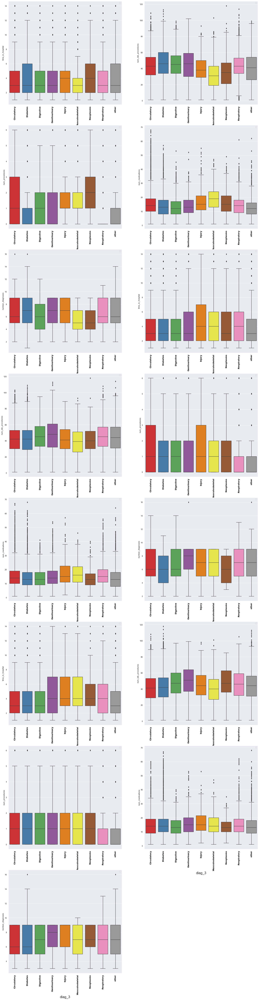

In [102]:
plt.figure(figsize=(26,104))
fig.tight_layout()
count =0
for i in diagnosis_list:
    for j in number_of_hospital_formalities:
        plt.subplot(8,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='Set1')
        count += 1

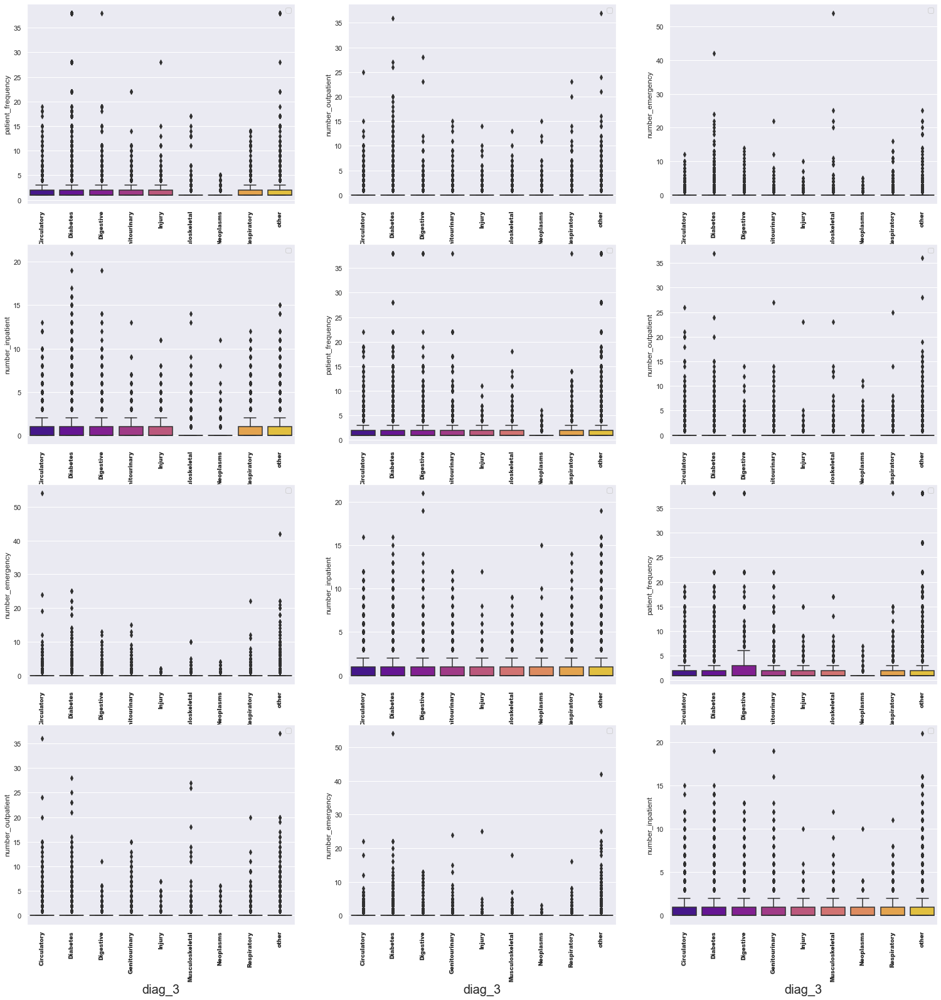

In [103]:
plt.figure(figsize=(26,27))
fig.tight_layout()
count =0
for i in diagnosis_list:
    for j in number_of_visits:
        plt.subplot(4,3,count+1,)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='plasma')
        count += 1

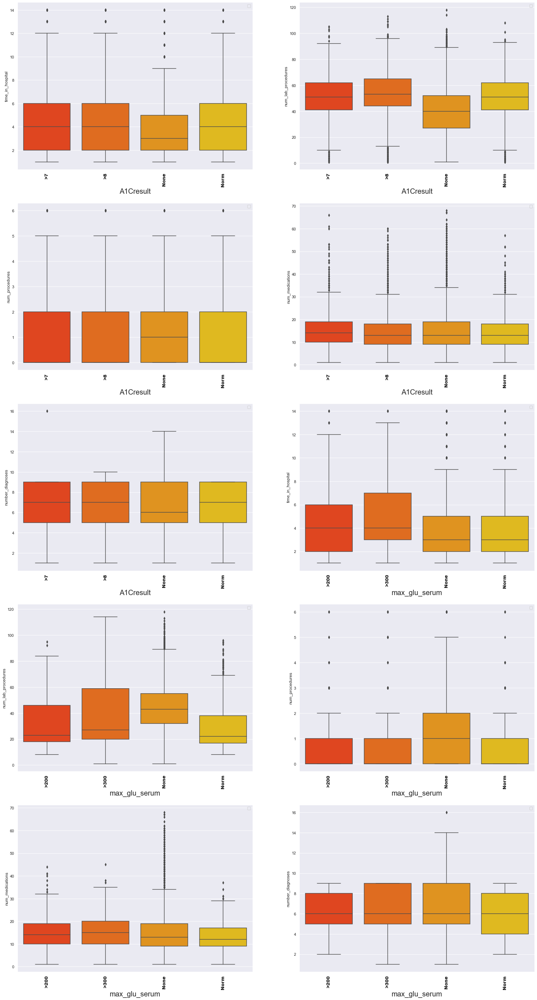

In [104]:
plt.figure(figsize=(26,50))
fig.tight_layout()
count =0
for i in primary_tests_list:
    for j in number_of_hospital_formalities:
        plt.subplot(5,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='autumn')
        count += 1

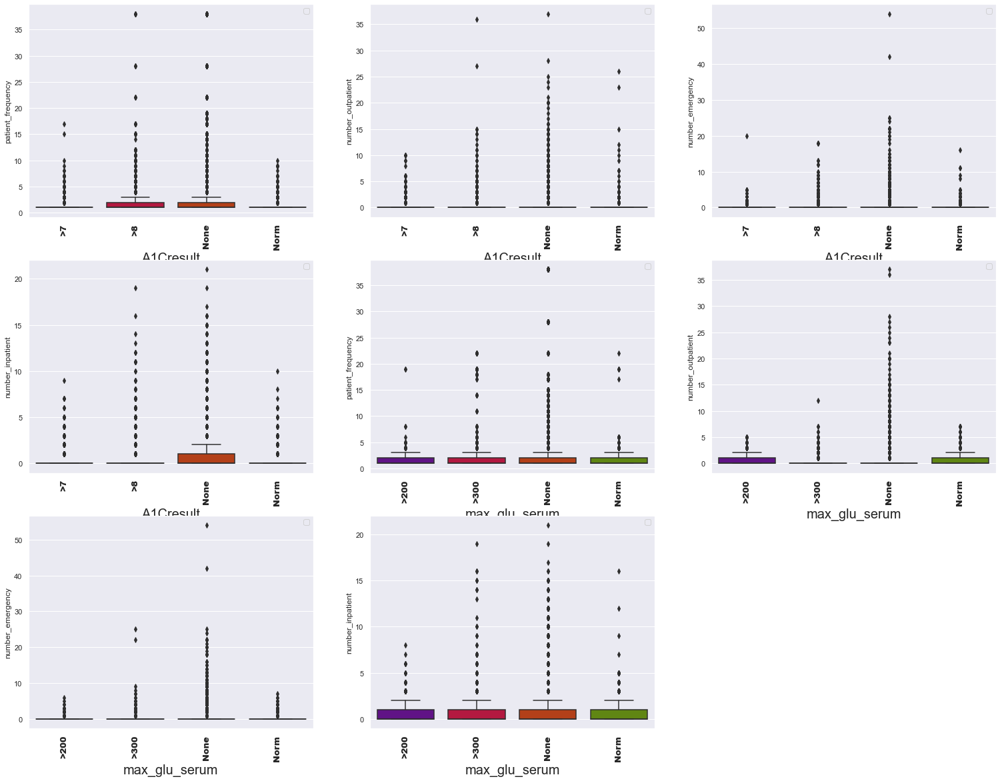

In [105]:
plt.figure(figsize=(26,20))
fig.tight_layout()
count =0
for i in primary_tests_list:
    for j in number_of_visits:
        plt.subplot(3,3,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='brg')
        count += 1

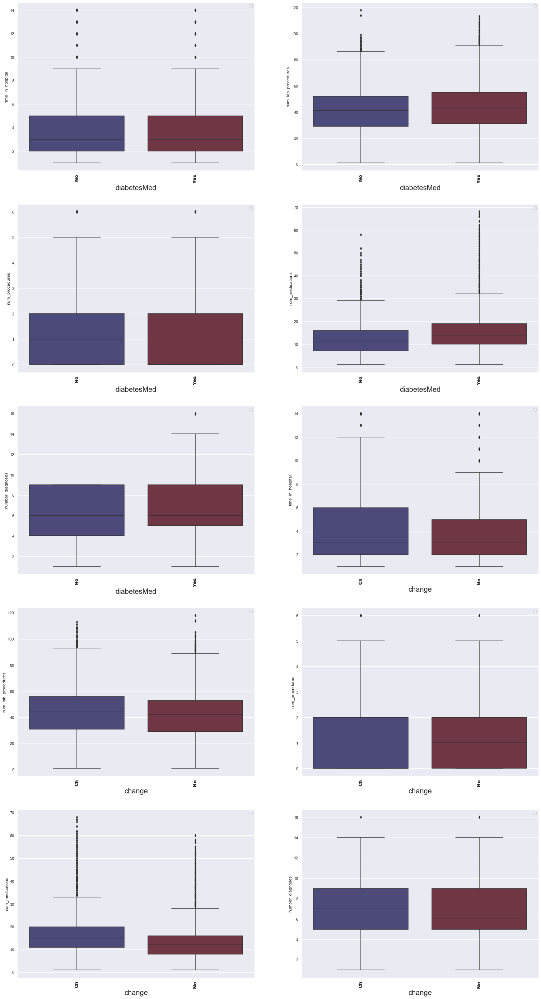

In [106]:
plt.figure(figsize=(26,50))
fig.tight_layout()
count =0
for i in medication_changes_list:
    for j in number_of_hospital_formalities:
        plt.subplot(5,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='icefire')
        count += 1

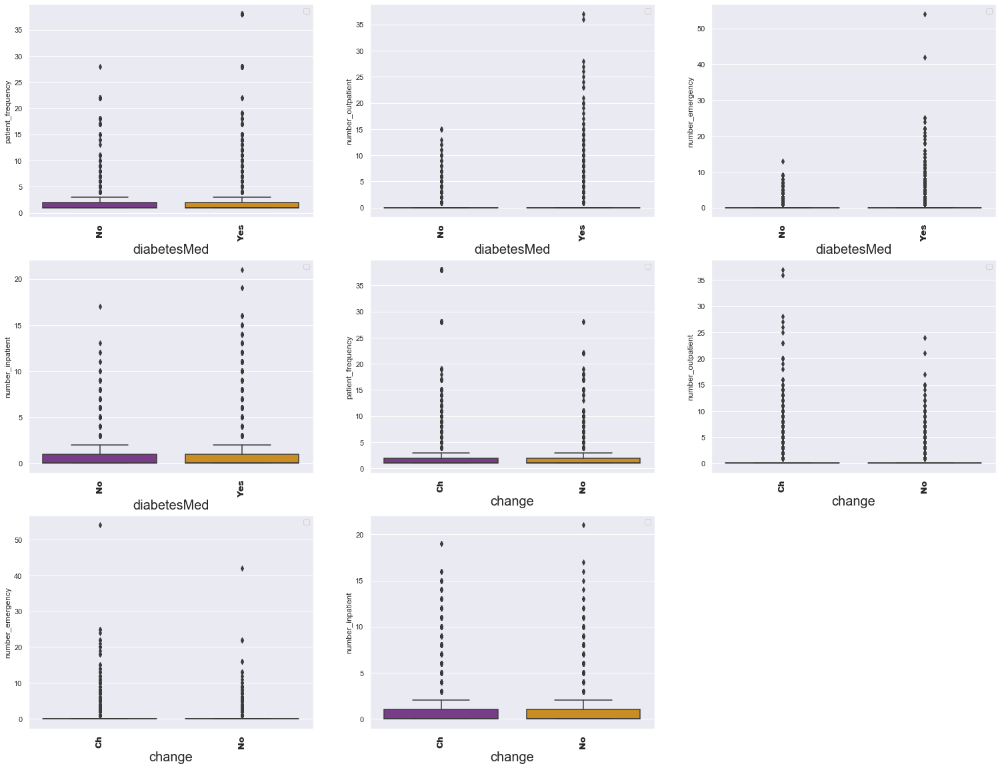

In [107]:
plt.figure(figsize=(26,20))
fig.tight_layout()
count =0
for i in medication_changes_list:
    for j in number_of_visits:
        plt.subplot(3,3,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='CMRmap')
        count += 1

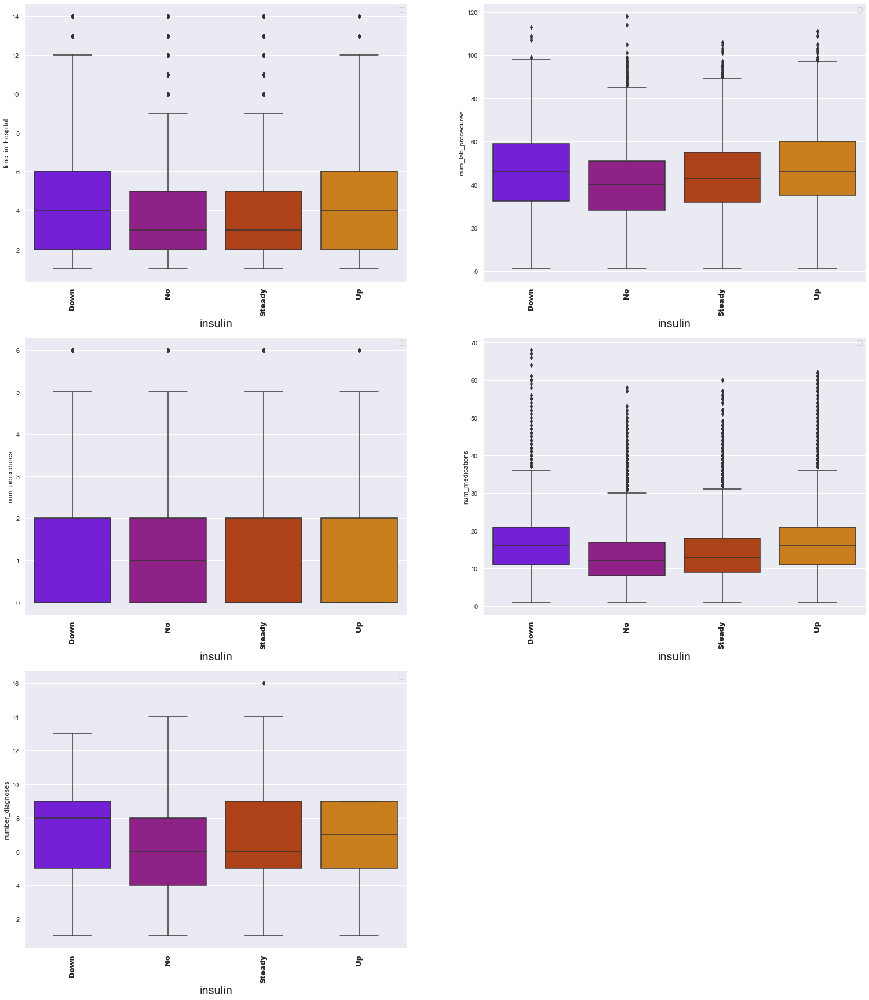

In [108]:
plt.figure(figsize=(26,30))
fig.tight_layout()
count =0
for i in ['insulin']:
    for j in number_of_hospital_formalities:
        plt.subplot(3,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='gnuplot')
        count += 1

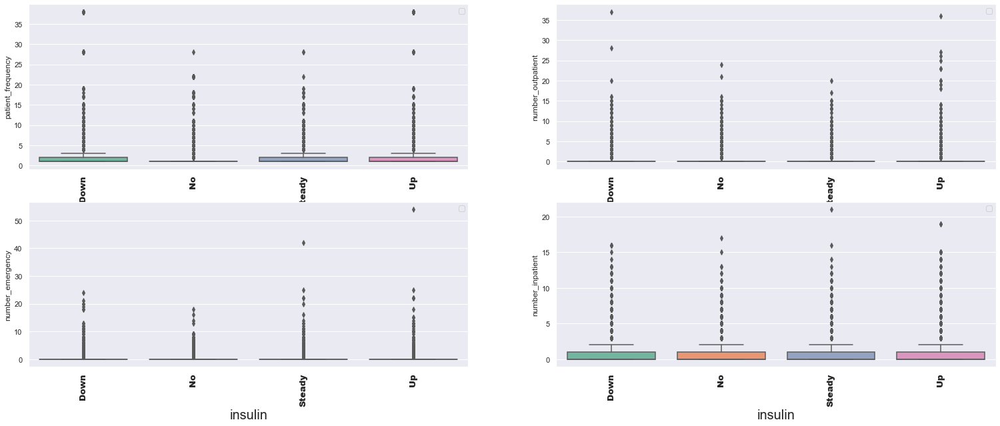

In [109]:
plt.figure(figsize=(26,10))
fig.tight_layout()
count =0
for i in ['insulin']:
    for j in number_of_visits:
        plt.subplot(2,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='Set2')
        count += 1

# MULTIVARIATE ANALYSIS

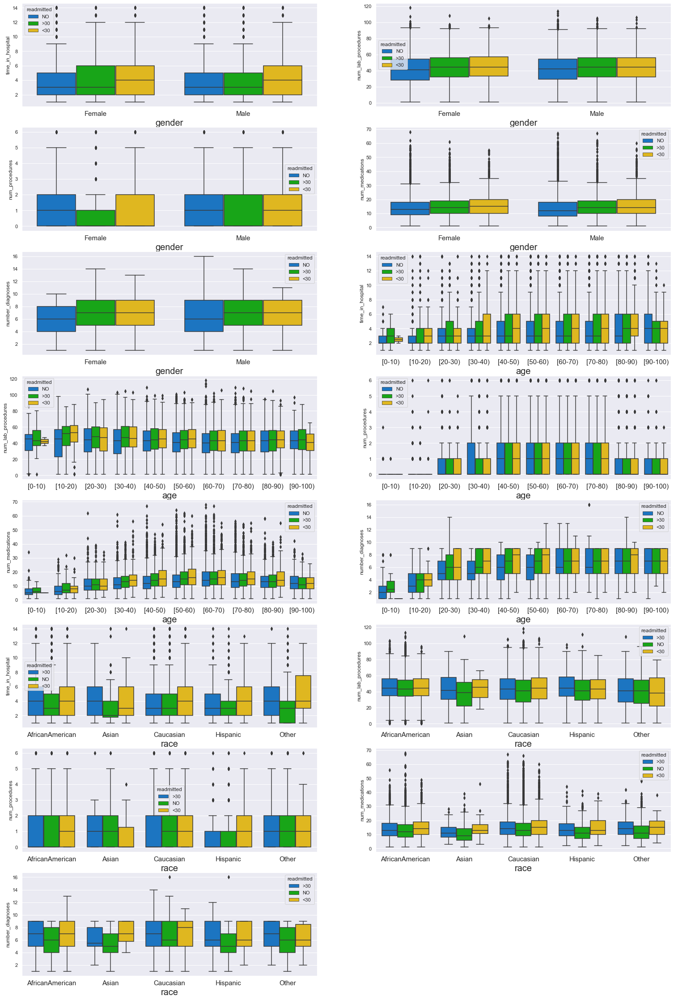

In [110]:
plt.figure(figsize=(26,40))
count =0
for i in patient_demographics_list:
    for j in number_of_hospital_formalities:
        plt.subplot(8,2,count+1)
        plt.xticks(fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),hue='readmitted',palette='nipy_spectral')
        count += 1

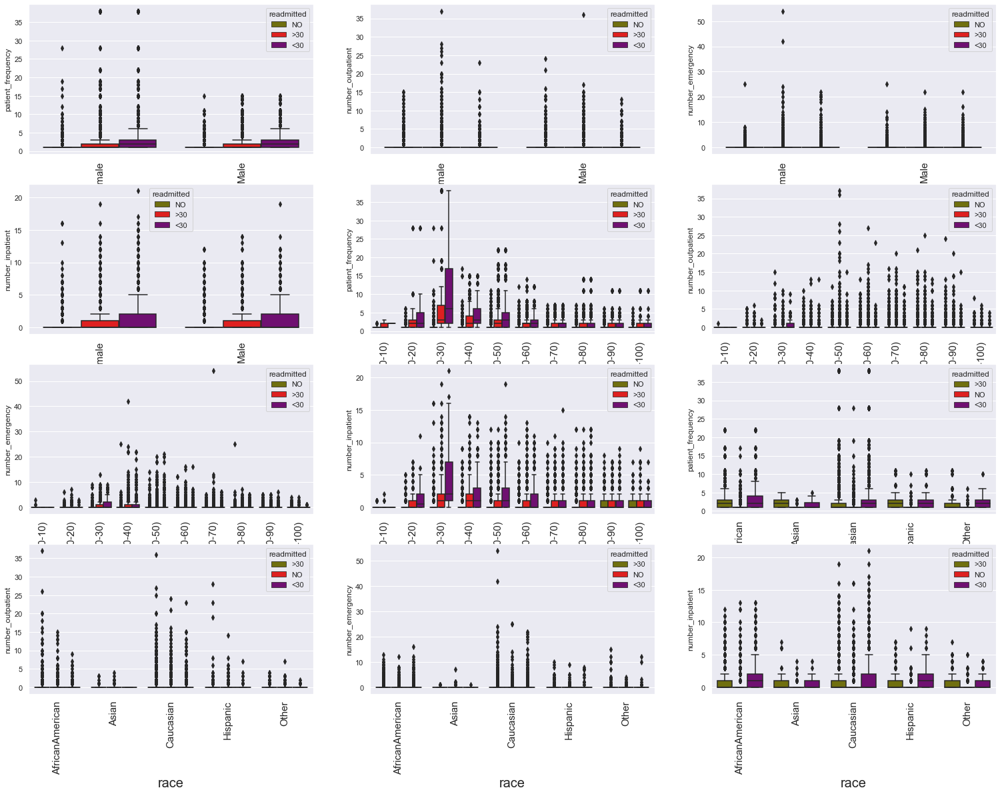

In [111]:
plt.figure(figsize=(26,24))
count =0
for i in patient_demographics_list:
    for j in number_of_visits:
        plt.subplot(5,3,count+1)
        plt.xticks(rotation=90,fontsize=15)
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='brg_r',hue='readmitted')
        count += 1

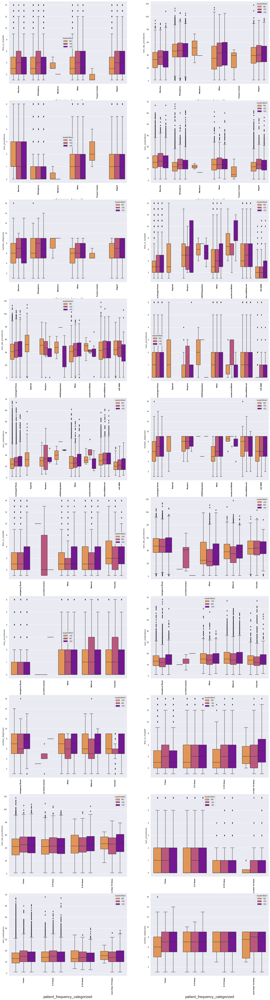

In [112]:
plt.figure(figsize=(26,100))
count =0
for i in patient_formalities_list:
    for j in number_of_hospital_formalities:
        plt.subplot(10,2,count+1)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='plasma_r',hue='readmitted')
        count += 1

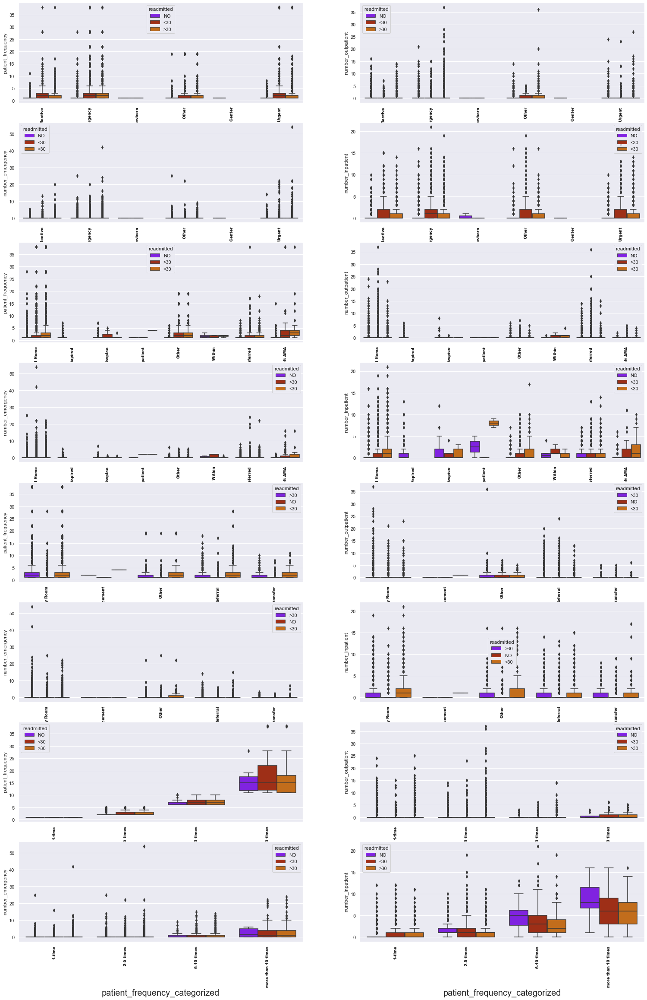

In [113]:
plt.figure(figsize=(26,40))
fig.tight_layout()
count =0
for i in patient_formalities_list:
    for j in number_of_visits:
        plt.subplot(8,2,count+1,)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='gnuplot',hue='readmitted')
        count += 1

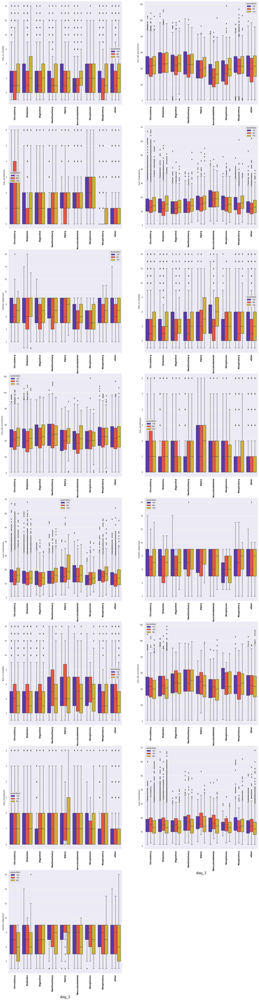

In [114]:
plt.figure(figsize=(26,104))
fig.tight_layout()
count =0
for i in diagnosis_list:
    for j in number_of_hospital_formalities:
        plt.subplot(8,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='CMRmap',hue='readmitted')
        count += 1

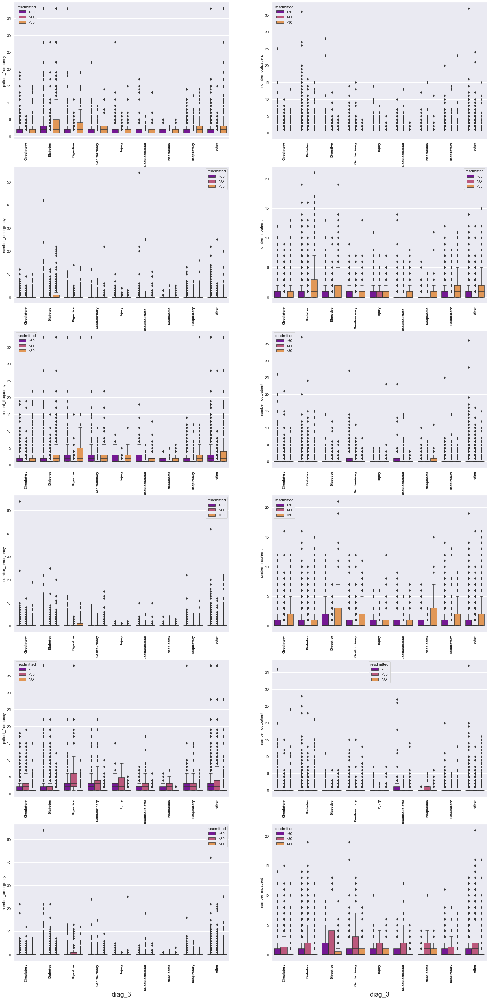

In [115]:
plt.figure(figsize=(26,54))
fig.tight_layout()
count =0
for i in diagnosis_list:
    for j in number_of_visits:
        plt.subplot(6,2,count+1,)
        plt.xticks(rotation=90,fontsize=9,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='plasma',hue='readmitted')
        count += 1

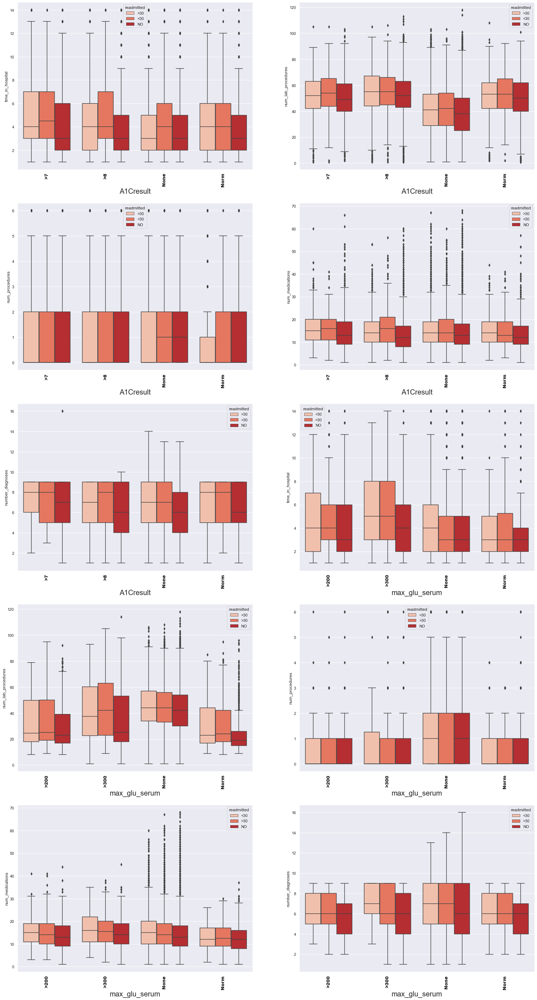

In [116]:
plt.figure(figsize=(26,50))
fig.tight_layout()
count =0
for i in primary_tests_list:
    for j in number_of_hospital_formalities:
        plt.subplot(5,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='Reds',hue='readmitted')
        count += 1

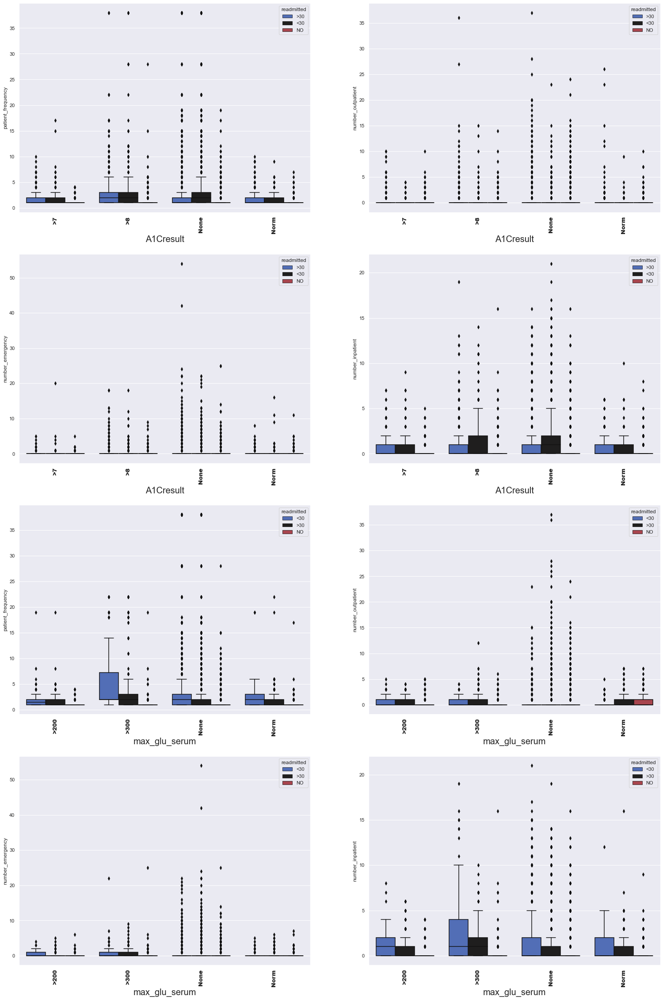

In [117]:
plt.figure(figsize=(26,40))
fig.tight_layout()
count =0
for i in primary_tests_list:
    for j in number_of_visits:
        plt.subplot(4,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='icefire',hue='readmitted')
        count += 1

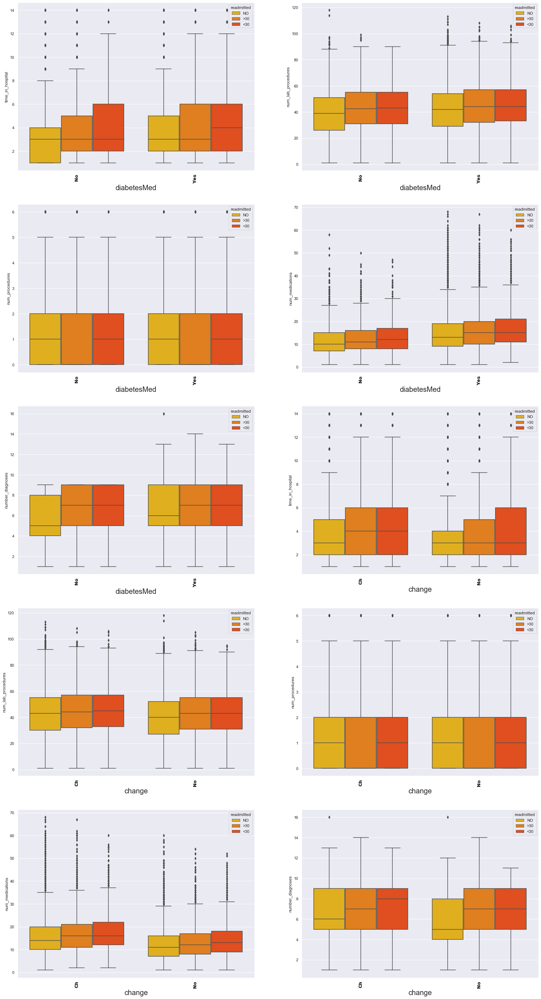

In [118]:
plt.figure(figsize=(26,50))
fig.tight_layout()
count =0
for i in medication_changes_list:
    for j in number_of_hospital_formalities:
        plt.subplot(5,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='autumn_r',hue='readmitted')
        count += 1

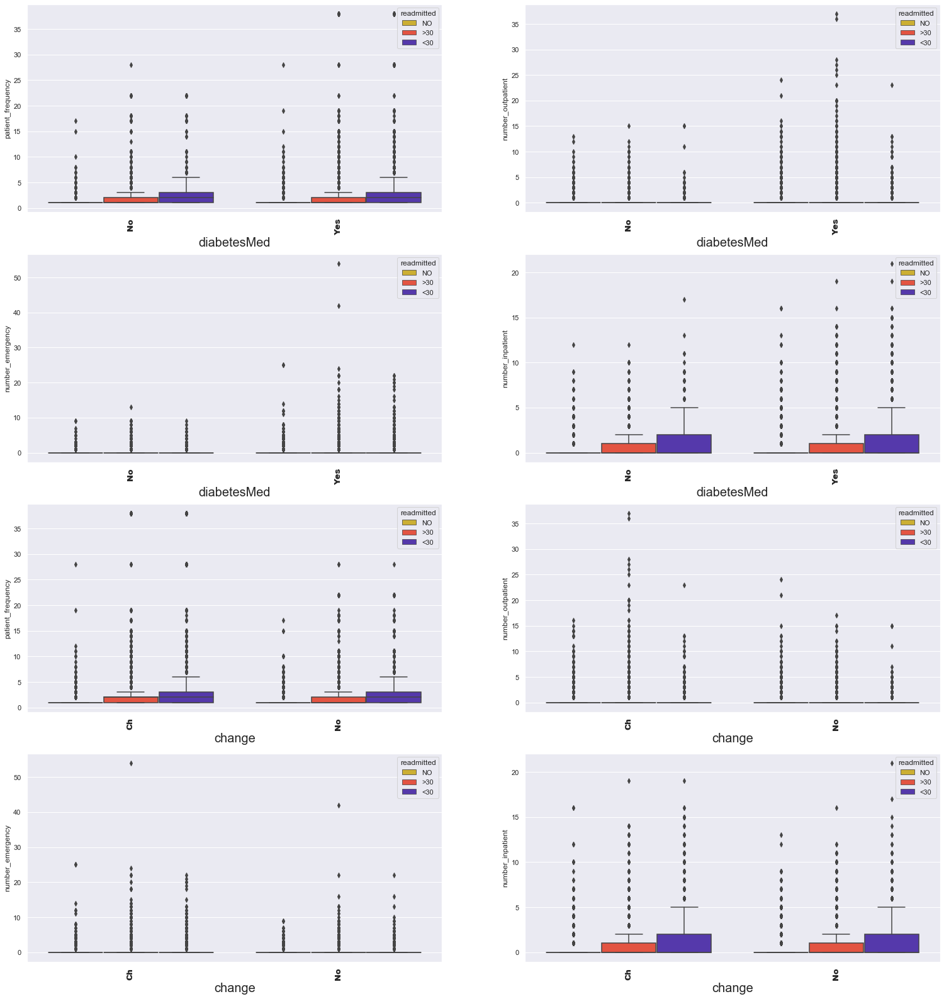

In [119]:
plt.figure(figsize=(26,28))
fig.tight_layout()
count =0
for i in medication_changes_list:
    for j in number_of_visits:
        plt.subplot(4,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='CMRmap_r',hue='readmitted')
        count += 1

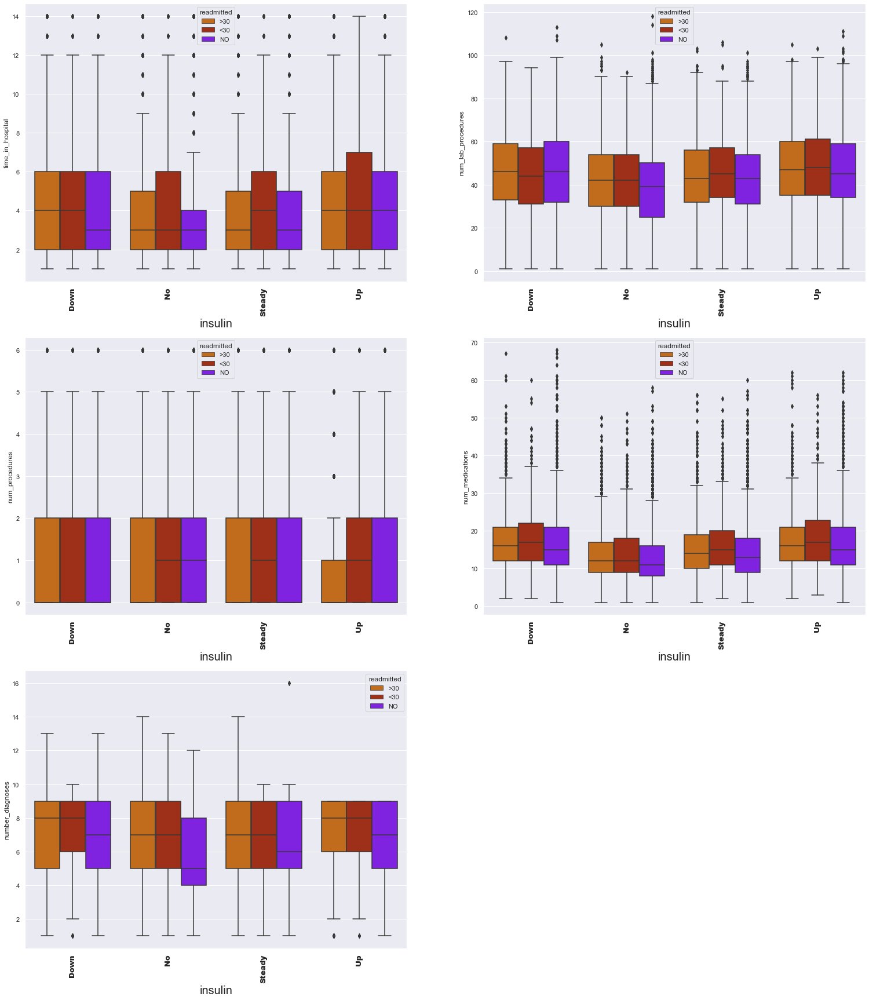

In [120]:
plt.figure(figsize=(26,30))
fig.tight_layout()
count =0
for i in ['insulin']:
    for j in number_of_hospital_formalities:
        plt.subplot(3,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='gnuplot_r',hue='readmitted')
        count += 1

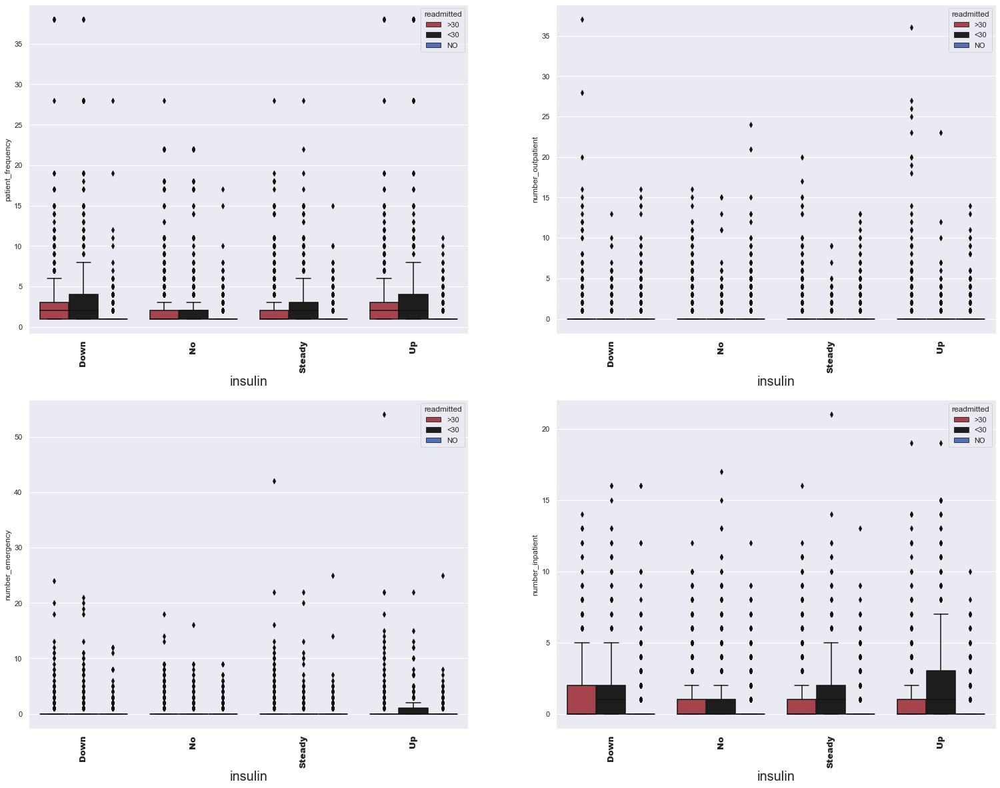

In [121]:
plt.figure(figsize=(26,20))
fig.tight_layout()
count =0
for i in ['insulin']:
    for j in number_of_visits:
        plt.subplot(2,2,count+1,)
        plt.xticks(rotation=90,fontsize=13,fontweight='heavy')
        plt.xlabel(i,fontsize=20)
        plt.legend('right')
        sns.boxplot(x=i, y=j, data=df_visual_diabetic.sort_values(i),palette='icefire_r',hue='readmitted')
        count += 1

### BUSINESS INTERPRETATION AND INSIGHTS

### INSIGHTS THAT ARE FOUND USING PREVIOUS ANALYSIS

### FINDING THE CAUSE FOR EVENTS.. 

In [122]:
df_visual_diabetic[(df_visual_diabetic['diag_1'].isnull()) & (df_visual_diabetic['diag_1'].isnull()) & (df_visual_diabetic['diag_1'].isnull())]

,patient_frequency,patient_nbr,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,patient_frequency_categorized


In [123]:
# Understanding Expired Patients wrt their disorders

In [124]:
df_visual_diabetic[df_visual_diabetic['discharge_disposition_id']=='Expired']['readmitted'].value_counts()

NO    264
Name: readmitted, dtype: int64

In [125]:
df_visual_diabetic[df_visual_diabetic['discharge_disposition_id']=='Hospice']['readmitted'].value_counts()

NO     80
>30    11
<30     5
Name: readmitted, dtype: int64

In [126]:
diag_tab_expired = pd.DataFrame(df_visual_diabetic[df_visual_diabetic['discharge_disposition_id']=='Expired']['diag_1'].value_counts())

In [127]:
diag_tab_expired['diag_2'] = df_visual_diabetic[df_visual_diabetic['discharge_disposition_id']=='Expired']['diag_2'].value_counts()

In [128]:
diag_tab_expired['diag_3'] = df_visual_diabetic[df_visual_diabetic['discharge_disposition_id']=='Expired']['diag_3'].value_counts()

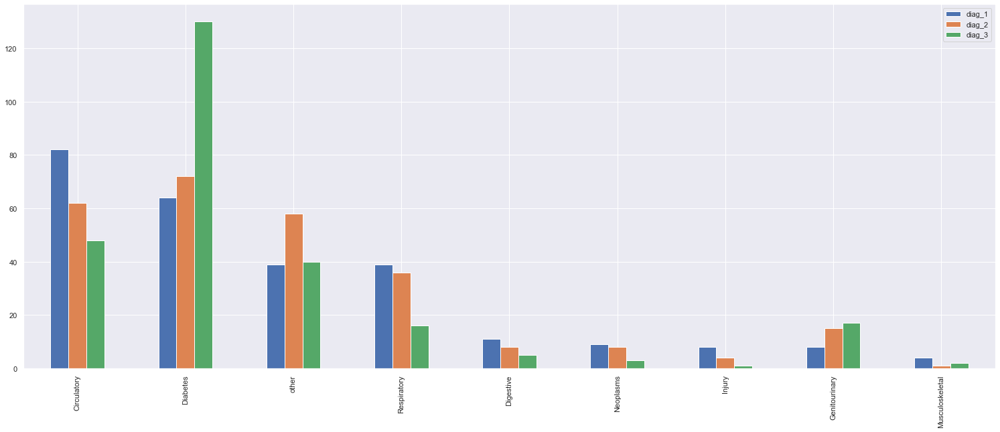

In [129]:
diag_tab_expired.plot(kind='bar',figsize=(26,10));

In [130]:
# From the above graph we could say that many patients who expired had Circulatory disorder...But the ratio of circulatory
# patients is also considerably high

In [131]:
fatality_percent_diag_1 = {}
fatality_percent_diag_2 = {}
fatality_percent_diag_3 = {}
for cat in df_visual_diabetic['diag_1'].unique():
    fatality_percent_diag_1.update({cat:100*(len(df_visual_diabetic[(df_visual_diabetic['diag_1']==cat) & (df_visual_diabetic['discharge_disposition_id']=='Expired')])/len(df_visual_diabetic[df_visual_diabetic['diag_1']==cat]))})
    fatality_percent_diag_2.update({cat:100*(len(df_visual_diabetic[(df_visual_diabetic['diag_2']==cat) & (df_visual_diabetic['discharge_disposition_id']=='Expired')])/len(df_visual_diabetic[df_visual_diabetic['diag_2']==cat]))})
    fatality_percent_diag_3.update({cat:100*(len(df_visual_diabetic[(df_visual_diabetic['diag_3']==cat) & (df_visual_diabetic['discharge_disposition_id']=='Expired')])/len(df_visual_diabetic[df_visual_diabetic['diag_3']==cat]))})
    

In [132]:
fatality_percent = pd.DataFrame()
for key in fatality_percent_diag_1:
    fatality_percent[key]=[fatality_percent_diag_1[key],fatality_percent_diag_2[key],fatality_percent_diag_3[key]]
    

In [133]:
fatality_percent = fatality_percent.T

In [134]:
fatality_percent.columns=['diag_1','diag_2','diag_3']

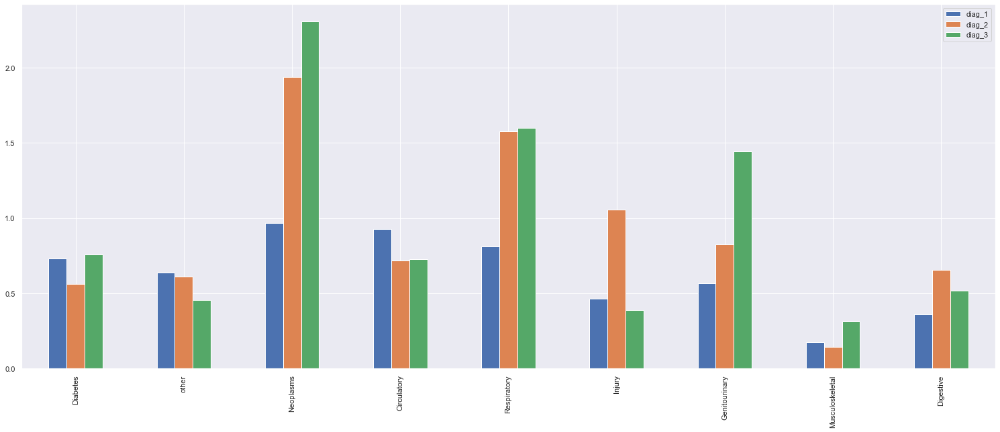

In [135]:
fatality_percent.plot(kind='bar',figsize=(26,10));

In [136]:
# the above plot shows the rate of expiration in terms of disease..

In [137]:
# Understandiing transferred Patients wrt their disorders

In [138]:
diag_tab_transferred = pd.DataFrame(df_visual_diabetic[df_visual_diabetic['discharge_disposition_id']=='Transferred/Referred']['diag_1'].value_counts())

In [139]:
diag_tab_transferred['diag_2'] = df_visual_diabetic[df_visual_diabetic['discharge_disposition_id']=='Transferred/Referred']['diag_2'].value_counts()

In [140]:
diag_tab_transferred['diag_3'] = df_visual_diabetic[df_visual_diabetic['discharge_disposition_id']=='Transferred/Referred']['diag_3'].value_counts()

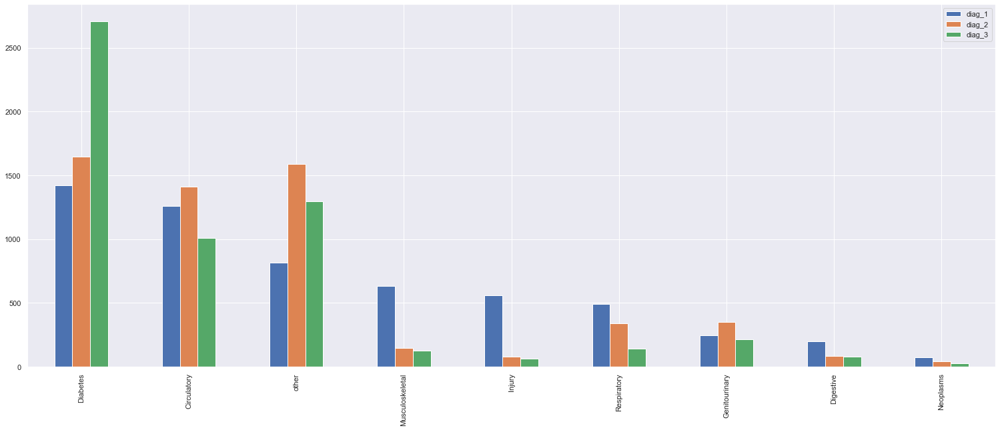

In [141]:
diag_tab_transferred.plot(kind='bar',figsize=(26,10));

In [142]:
# Many patients who were transferred had a circulatory disorder and other disorders with diabetes..

In [143]:
transfer_percent_diag_1 = {}
transfer_percent_diag_2 = {}
transfer_percent_diag_3 = {}
for cat in df_visual_diabetic['diag_1'].unique():
    transfer_percent_diag_1.update({cat:100*(len(df_visual_diabetic[(df_visual_diabetic['diag_1']==cat) & (df_visual_diabetic['discharge_disposition_id']=='Transferred/Referred')])/len(df_visual_diabetic[df_visual_diabetic['diag_1']==cat]))})
    transfer_percent_diag_2.update({cat:100*(len(df_visual_diabetic[(df_visual_diabetic['diag_2']==cat) & (df_visual_diabetic['discharge_disposition_id']=='Transferred/Referred')])/len(df_visual_diabetic[df_visual_diabetic['diag_2']==cat]))})
    transfer_percent_diag_3.update({cat:100*(len(df_visual_diabetic[(df_visual_diabetic['diag_3']==cat) & (df_visual_diabetic['discharge_disposition_id']=='Transferred/Referred')])/len(df_visual_diabetic[df_visual_diabetic['diag_3']==cat]))})
    

In [144]:
transfer_percent = pd.DataFrame()
for key in transfer_percent_diag_1:
    transfer_percent[key]=[transfer_percent_diag_1[key],transfer_percent_diag_2[key],transfer_percent_diag_3[key]]
    

In [145]:
transfer_percent = transfer_percent.T

In [146]:
transfer_percent.columns=['diag_1','diag_2','diag_3']

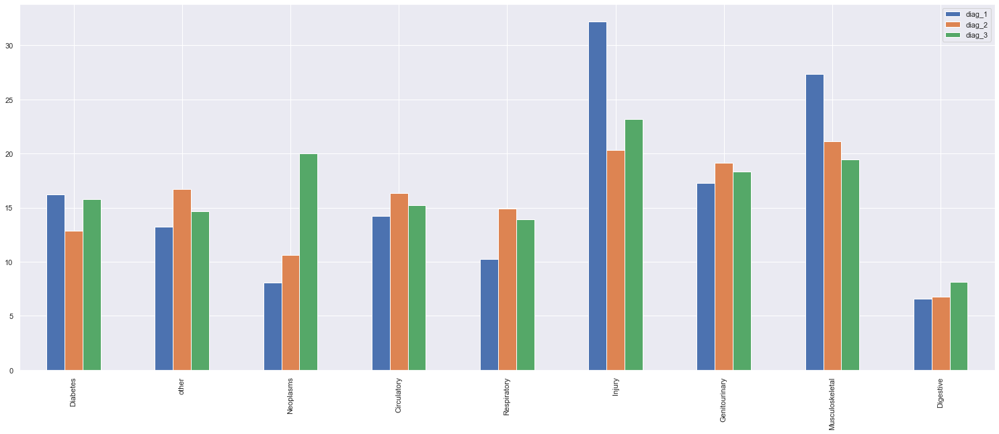

In [147]:
transfer_percent.plot(kind='bar',figsize=(26,10));

In [148]:
# the rate of transfer of patients who were injured and patients who had musculoskeletal disorders is high(all of them have diabetes)..

In [149]:
pd.crosstab(df_visual_diabetic['insulin'],df_visual_diabetic['age'],margins=True)

age,[0-10),[10-20),[20-30),[30-40),[40-50),[50-60),[60-70),[70-80),[80-90),[90-100),All
insulin,,,,,,,,,,,
Down,14,104,317,433,912,1082,1030,936,552,67,5447
No,26,88,292,839,1921,3184,3593,3765,2031,315,16054
Steady,100,313,398,750,1569,2365,2447,2390,1247,184,11763
Up,18,132,328,455,779,882,893,722,449,68,4726
All,158,637,1335,2477,5181,7513,7963,7813,4279,634,37990


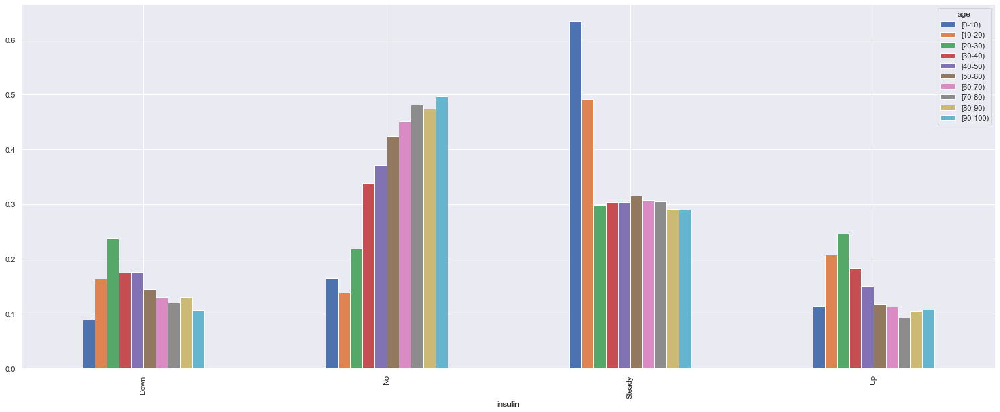

In [150]:
pd.crosstab(df_visual_diabetic['insulin'],df_visual_diabetic['age'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [151]:
# many children less than thee age of 10 suffer from diabetes and a steady doze of insulin was provided to many of them..

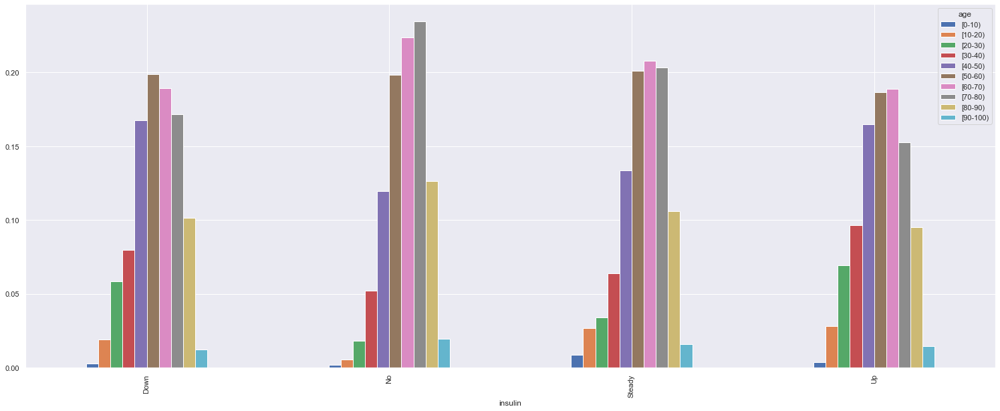

In [152]:
pd.crosstab(df_visual_diabetic['insulin'],df_visual_diabetic['age'],normalize='index').plot(kind='bar',figsize=(26,10));

In [153]:
pd.crosstab(df_visual_diabetic['insulin'],df_visual_diabetic['diag_1'],margins=True)

diag_1,Circulatory,Diabetes,Digestive,Genitourinary,Injury,Musculoskeletal,Neoplasms,Respiratory,other,All
insulin,,,,,,,,,,
Down,1074,1867,339,187,236,178,106,631,829,5447
No,4222,2233,1414,667,769,1365,488,2190,2706,16054
Steady,2744,2842,1000,392,545,601,275,1474,1890,11763
Up,805,1812,289,171,184,162,60,525,718,4726
All,8845,8754,3042,1417,1734,2306,929,4820,6143,37990


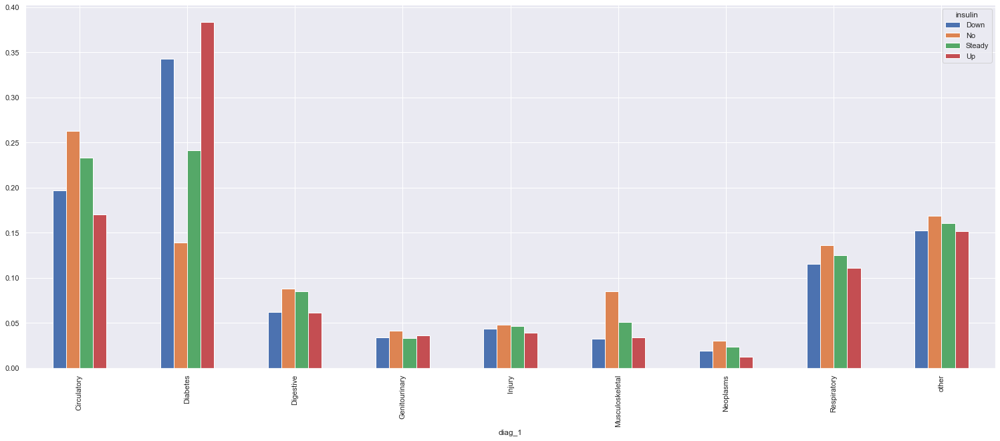

In [154]:
pd.crosstab(df_visual_diabetic['diag_1'],df_visual_diabetic['insulin'],normalize='columns').plot(kind='bar',figsize=(26,10));

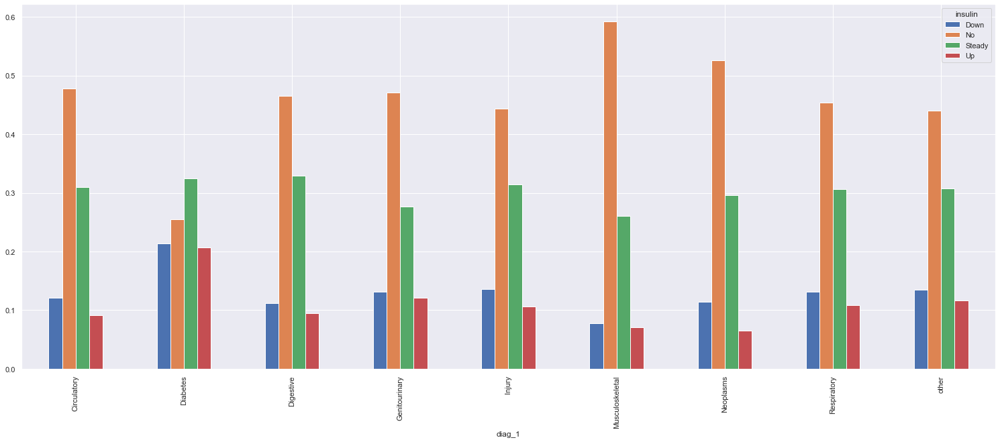

In [155]:
pd.crosstab(df_visual_diabetic['diag_1'],df_visual_diabetic['insulin'],normalize='index').plot(kind='bar',figsize=(26,10));

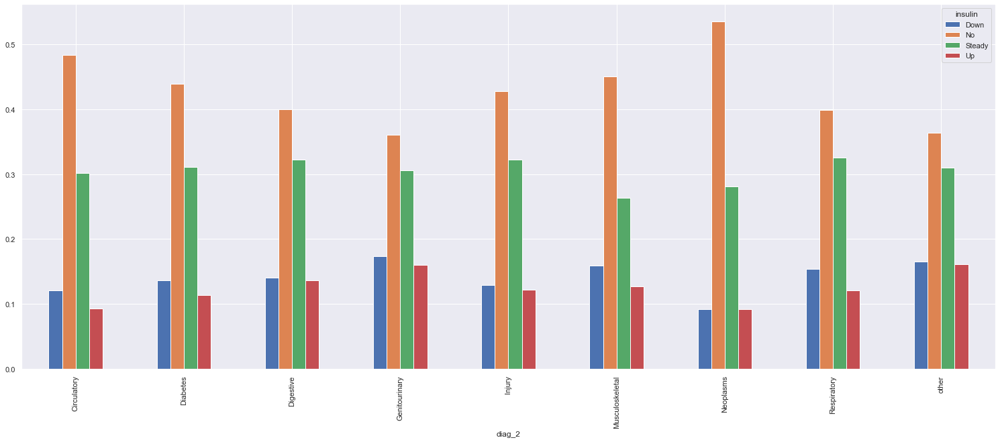

In [156]:
pd.crosstab(df_visual_diabetic['diag_2'],df_visual_diabetic['insulin'],normalize='index').plot(kind='bar',figsize=(26,10));

In [157]:
pd.crosstab(df_visual_diabetic['insulin'],df_visual_diabetic['patient_frequency_categorized'],margins=True)

patient_frequency_categorized,1-time,2-5 times,6-10 times,more than 10 times,All
insulin,,,,,
Down,3269,1881,186,111,5447
No,12205,3581,178,90,16054
Steady,8448,3016,225,74,11763
Up,2909,1477,232,108,4726
All,26831,9955,821,383,37990


In [158]:
# although few patients visited the hospital more than 10 times they were not administered with insulin..

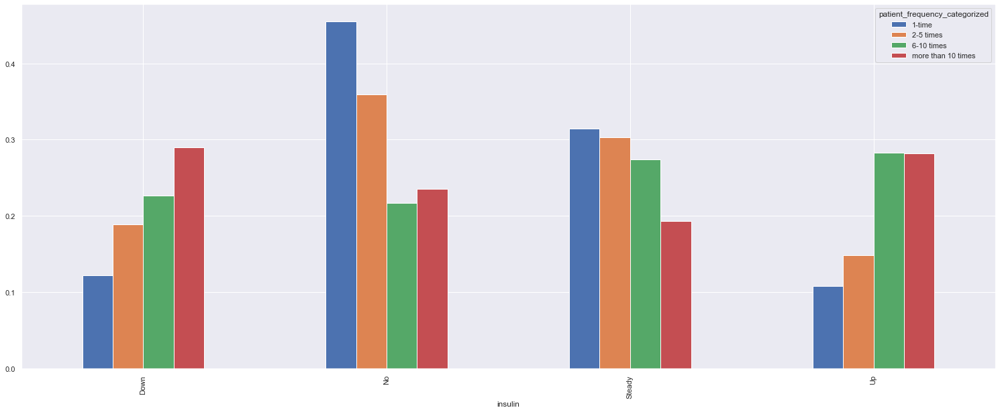

In [159]:
pd.crosstab(df_visual_diabetic['insulin'],df_visual_diabetic['patient_frequency_categorized'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [160]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['diag_1'],margins=True)

diag_1,Circulatory,Diabetes,Digestive,Genitourinary,Injury,Musculoskeletal,Neoplasms,Respiratory,other,All
age,,,,,,,,,,
[0-10),0,136,3,1,0,0,0,9,9,158
[10-20),3,475,12,10,12,3,2,34,86,637
[20-30),37,679,90,44,29,14,5,46,391,1335
[30-40),164,906,241,88,79,84,17,231,667,2477
[40-50),820,1447,525,180,207,233,80,690,999,5181
[50-60),1866,1465,636,263,323,497,187,1055,1221,7513
[60-70),2308,1376,651,265,405,650,281,1029,998,7963
[70-80),2320,1363,547,314,361,620,245,1018,1025,7813
[80-90),1171,779,277,217,271,192,105,610,657,4279


In [161]:
# the age group of 1-20 are least prone to all of these diseases except diabetes..

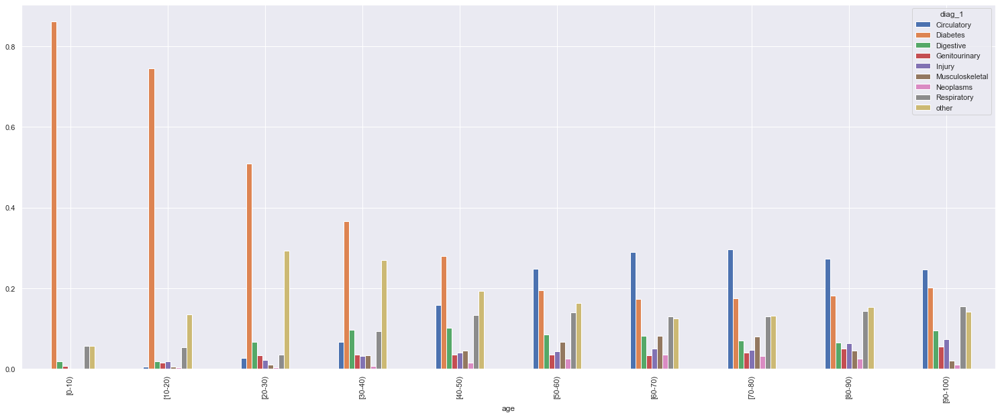

In [162]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['diag_1'],normalize='index').plot(kind='bar',figsize=(26,10));

In [163]:
# At a young age patients are more prone to diabetes..As age increases the diabetic patients are also prone to circulatory disorders..

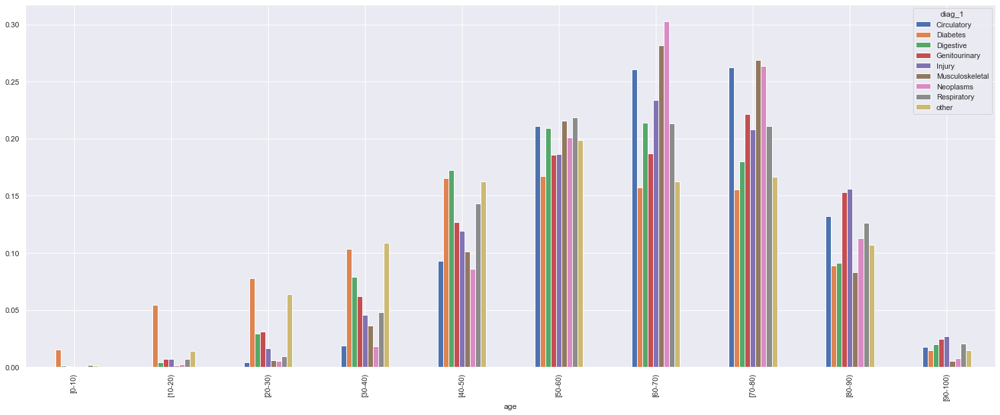

In [164]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['diag_1'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [165]:
# Until the age of 50 patients are more prone to diabetes..

In [166]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['discharge_disposition_id'],margins=True)

discharge_disposition_id,Discharged Home,Expired,Hospice,In/Still/Outpatient,Other,Transferred Within,Transferred/Referred,left AMA,All
age,,,,,,,,,
[0-10),144,1,0,0,10,0,2,1,158
[10-20),590,0,0,1,24,0,9,13,637
[20-30),1204,3,0,0,48,0,35,45,1335
[30-40),2216,4,0,0,109,0,93,55,2477
[40-50),4491,15,5,0,295,1,308,66,5181
[50-60),6301,43,3,0,432,3,668,63,7513
[60-70),6305,38,15,3,482,1,1079,40,7963
[70-80),5501,62,24,0,491,10,1709,16,7813
[80-90),2466,77,39,1,191,3,1497,5,4279


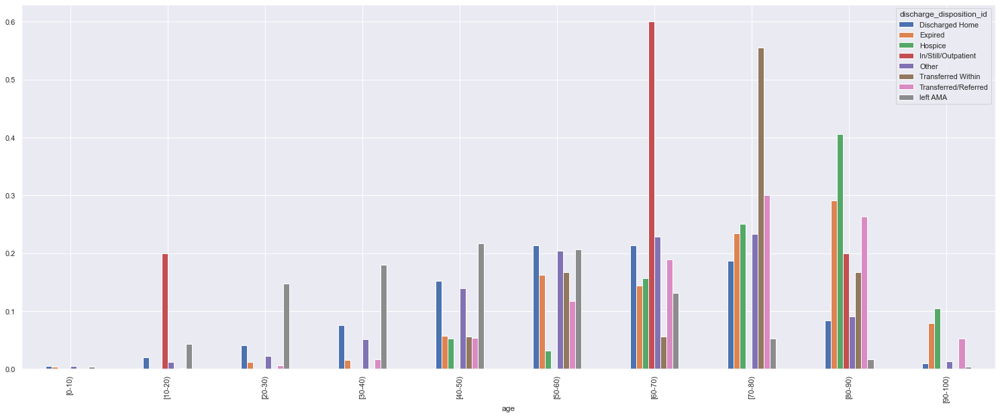

In [167]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['discharge_disposition_id'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [168]:
# Many of the inpatients are of the age 10-20 and 60-70 ..

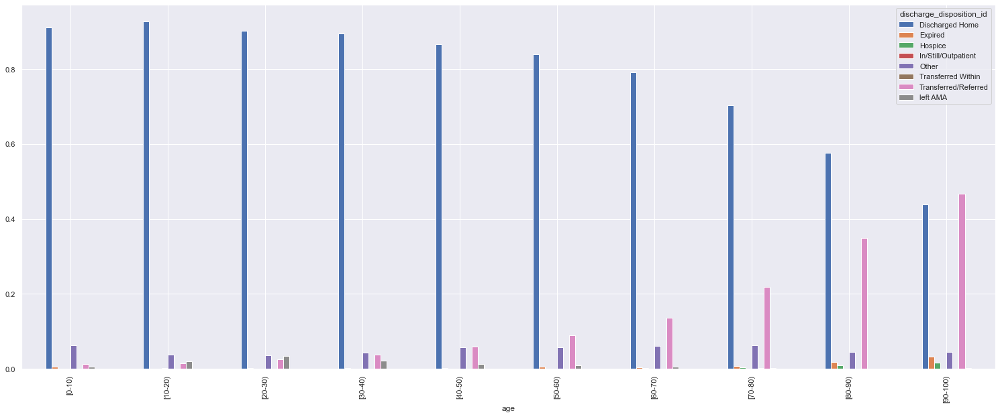

In [169]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['discharge_disposition_id'],normalize='index').plot(kind='bar',figsize=(26,10));

In [170]:
# as Age increases the transfer rate of the patients is also increasing..

In [171]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['patient_frequency_categorized'],margins=True)

patient_frequency_categorized,1-time,2-5 times,6-10 times,more than 10 times,All
age,,,,,
[0-10),143,15,0,0,158
[10-20),423,175,33,6,637
[20-30),716,373,128,118,1335
[30-40),1508,744,159,66,2477
[40-50),3321,1522,206,132,5181
[50-60),5360,1974,165,14,7513
[60-70),5849,2037,77,0,7963
[70-80),5814,1934,40,25,7813
[80-90),3211,1050,7,11,4279


In [172]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['readmitted'],margins=True)

readmitted,<30,>30,NO,All
age,,,,
[0-10),2,26,130,158
[10-20),38,207,392,637
[20-30),209,418,708,1335
[30-40),288,808,1381,2477
[40-50),571,1742,2868,5181
[50-60),680,2527,4306,7513
[60-70),848,2724,4391,7963
[70-80),934,2836,4043,7813
[80-90),521,1562,2196,4279


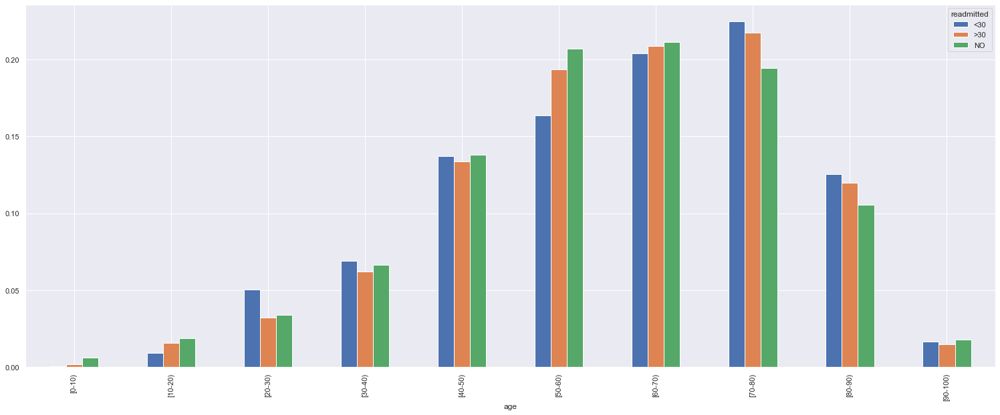

In [173]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['readmitted'],normalize='columns').plot(kind='bar',figsize=(26,10));

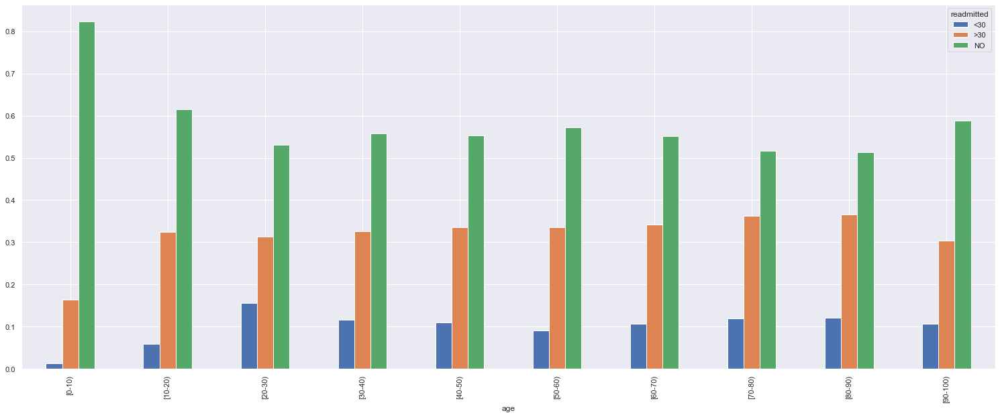

In [174]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['readmitted'],normalize='index').plot(kind='bar',figsize=(26,10));

In [175]:
# add this without inference..

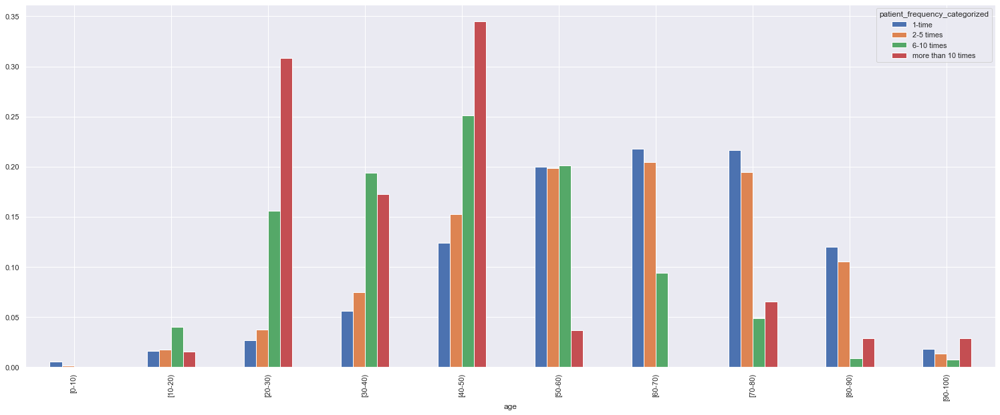

In [176]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['patient_frequency_categorized'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [177]:
# Patientss who are in the age 20-50 tend to visit the hospital more often..

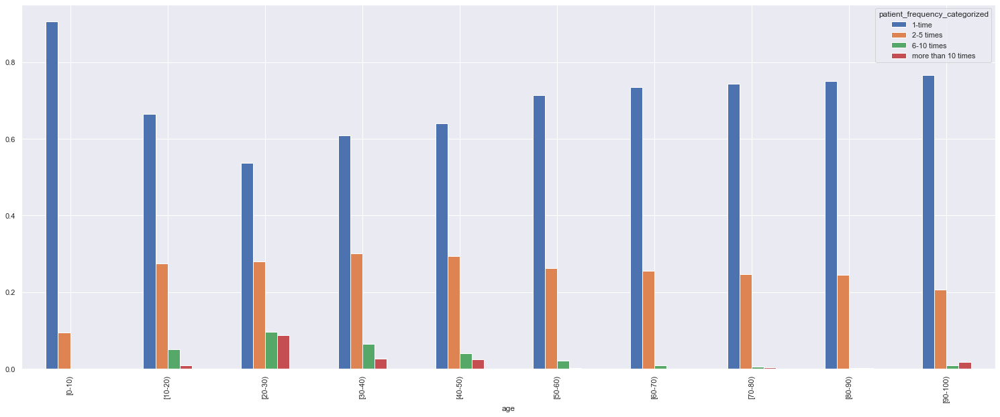

In [178]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['patient_frequency_categorized'],normalize='index').plot(kind='bar',figsize=(26,10));

In [179]:
# Many patients in all age group visit the hospital only once..

In [180]:
pd.crosstab(df_visual_diabetic['diag_1'],df_visual_diabetic['discharge_disposition_id'],margins=True)

discharge_disposition_id,Discharged Home,Expired,Hospice,In/Still/Outpatient,Other,Transferred Within,Transferred/Referred,left AMA,All
diag_1,,,,,,,,,
Circulatory,6805,82,18,1,640,2,1258,39,8845
Diabetes,6719,64,32,1,395,4,1422,117,8754
Digestive,2659,11,3,1,139,1,200,28,3042
Genitourinary,1079,8,4,0,74,1,245,6,1417
Injury,1033,8,4,0,125,0,558,6,1734
Musculoskeletal,1525,4,0,0,143,1,631,2,2306
Neoplasms,780,9,12,0,52,0,75,1,929
Respiratory,3969,39,13,1,254,4,493,47,4820
other,4927,39,10,1,288,5,814,59,6143


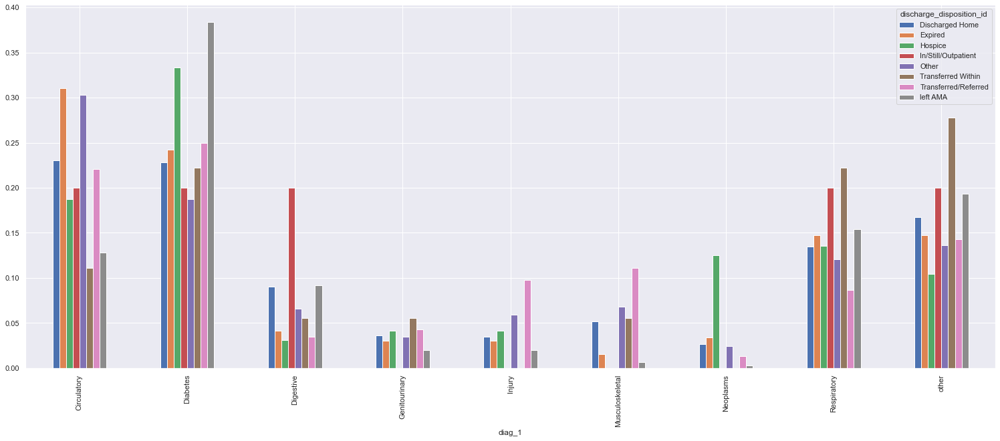

In [181]:
pd.crosstab(df_visual_diabetic['diag_1'],df_visual_diabetic['discharge_disposition_id'],normalize='columns').plot(kind='bar',figsize=(26,10));

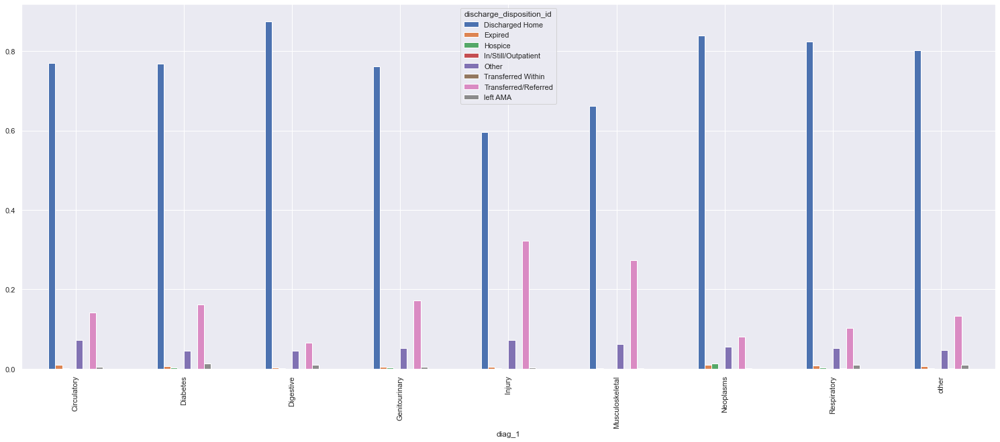

In [182]:
pd.crosstab(df_visual_diabetic['diag_1'],df_visual_diabetic['discharge_disposition_id'],normalize='index').plot(kind='bar',figsize=(26,10));

In [183]:
pd.crosstab(df_visual_diabetic['diag_1'],df_visual_diabetic['patient_frequency_categorized'],margins=True)

patient_frequency_categorized,1-time,2-5 times,6-10 times,more than 10 times,All
diag_1,,,,,
Circulatory,6614,2142,71,18,8845
Diabetes,5272,2826,443,213,8754
Digestive,2196,722,81,43,3042
Genitourinary,1034,346,28,9,1417
Injury,1242,466,20,6,1734
Musculoskeletal,1931,361,4,10,2306
Neoplasms,798,131,0,0,929
Respiratory,3488,1240,58,34,4820
other,4256,1721,116,50,6143


In [184]:
# circulatory respiratory and patients with other disorders tend to visit the hospital more number of times..

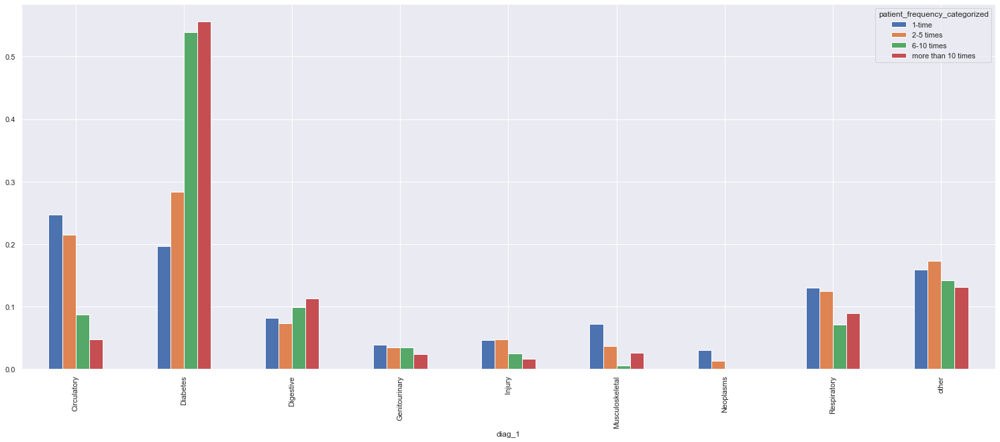

In [185]:
pd.crosstab(df_visual_diabetic['diag_1'],df_visual_diabetic['patient_frequency_categorized'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [186]:
# 

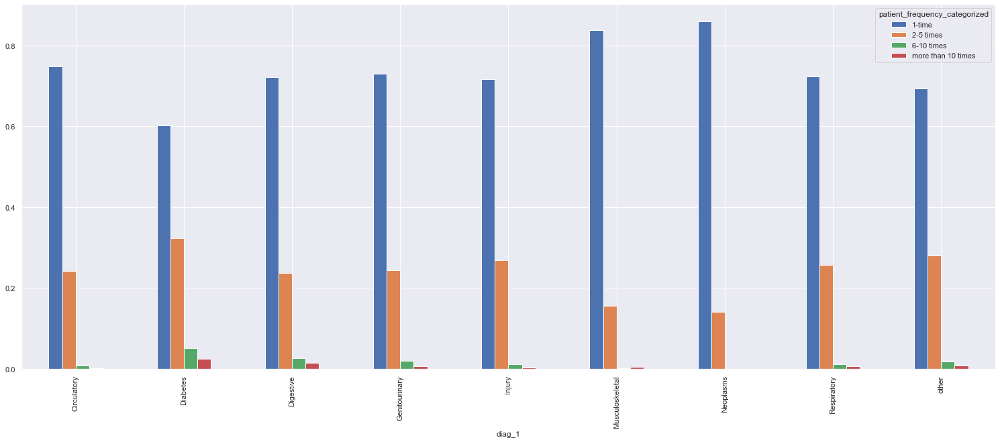

In [187]:
pd.crosstab(df_visual_diabetic['diag_1'],df_visual_diabetic['patient_frequency_categorized'],normalize='index').plot(kind='bar',figsize=(26,10));

In [188]:
# patients with respiratory and other illness tend to visit the hospital often..

In [189]:
pd.crosstab(df_visual_diabetic['discharge_disposition_id'],df_visual_diabetic['patient_frequency_categorized'],margins=True)

patient_frequency_categorized,1-time,2-5 times,6-10 times,more than 10 times,All
discharge_disposition_id,,,,,
Discharged Home,21132,7367,654,343,29496
Expired,207,55,2,0,264
Hospice,71,23,2,0,96
In/Still/Outpatient,3,2,0,0,5
Other,1346,685,65,14,2110
Transferred Within,8,10,0,0,18
Transferred/Referred,3881,1722,78,15,5696
left AMA,183,91,20,11,305
All,26831,9955,821,383,37990


In [190]:
# add anyways..

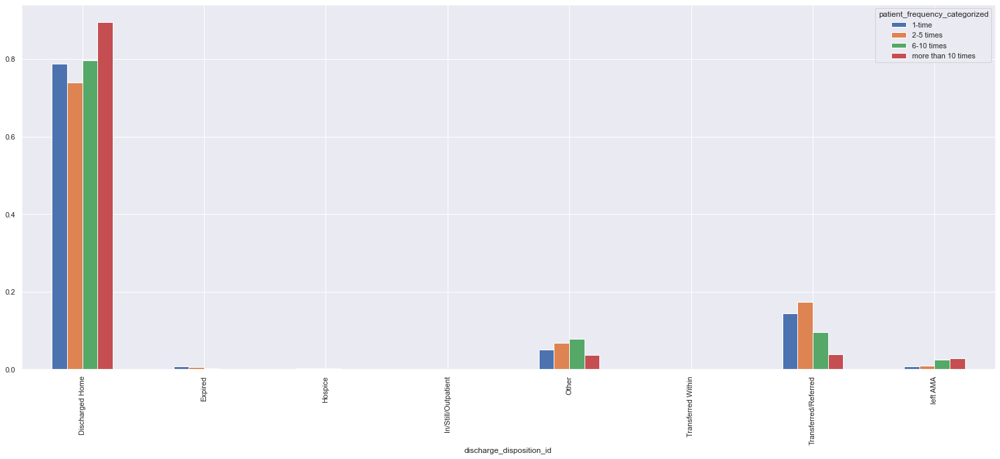

In [191]:
pd.crosstab(df_visual_diabetic['discharge_disposition_id'],df_visual_diabetic['patient_frequency_categorized'],normalize='columns').plot(kind='bar',figsize=(26,10));

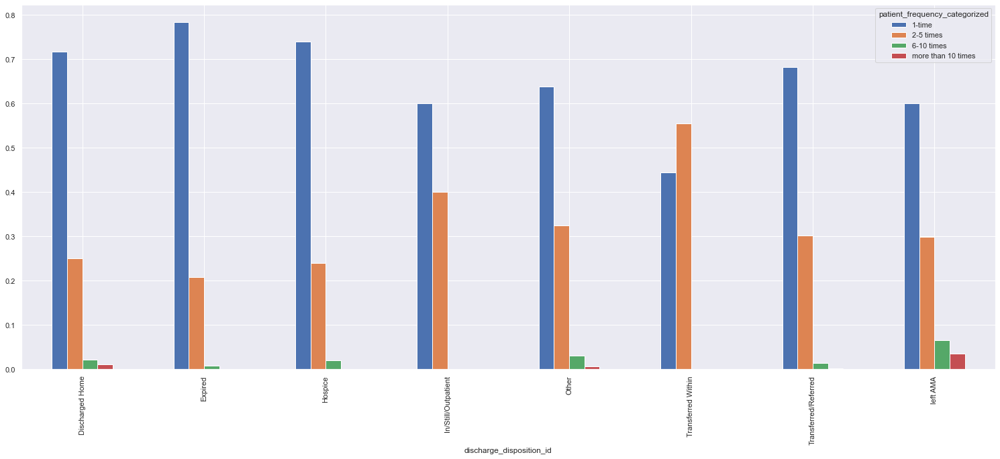

In [192]:
pd.crosstab(df_visual_diabetic['discharge_disposition_id'],df_visual_diabetic['patient_frequency_categorized'],normalize='index').plot(kind='bar',figsize=(26,10));

In [193]:
pd.crosstab(df_visual_diabetic['diag_1'],df_visual_diabetic['readmitted'],margins=True)

readmitted,<30,>30,NO,All
diag_1,,,,
Circulatory,973,3068,4804,8845
Diabetes,1137,3316,4301,8754
Digestive,309,1002,1731,3042
Genitourinary,129,484,804,1417
Injury,226,547,961,1734
Musculoskeletal,202,623,1481,2306
Neoplasms,79,209,641,929
Respiratory,417,1794,2609,4820
other,687,2000,3456,6143


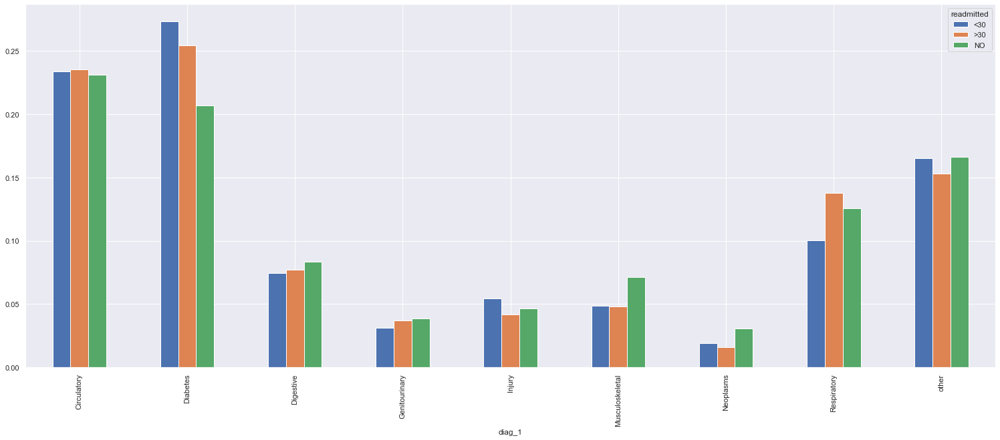

In [194]:
pd.crosstab(df_visual_diabetic['diag_1'],df_visual_diabetic['readmitted'],normalize='columns').plot(kind='bar',figsize=(26,10));

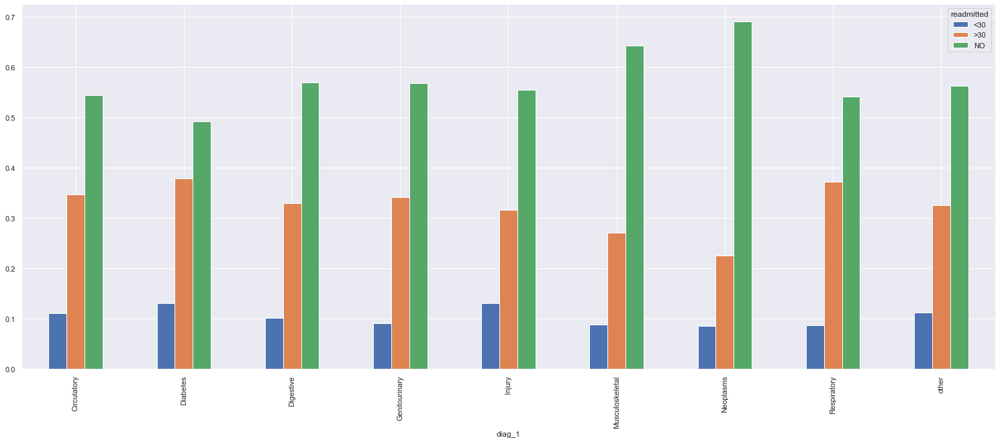

In [195]:
pd.crosstab(df_visual_diabetic['diag_1'],df_visual_diabetic['readmitted'],normalize='index').plot(kind='bar',figsize=(26,10));

In [196]:
pd.crosstab(df_visual_diabetic['discharge_disposition_id'],df_visual_diabetic['readmitted'],margins=True)

readmitted,<30,>30,NO,All
discharge_disposition_id,,,,
Discharged Home,2793,10350,16353,29496
Expired,0,0,264,264
Hospice,5,11,80,96
In/Still/Outpatient,2,1,2,5
Other,261,631,1218,2110
Transferred Within,7,5,6,18
Transferred/Referred,1050,1933,2713,5696
left AMA,41,112,152,305
All,4159,13043,20788,37990


In [197]:
# add anyways..

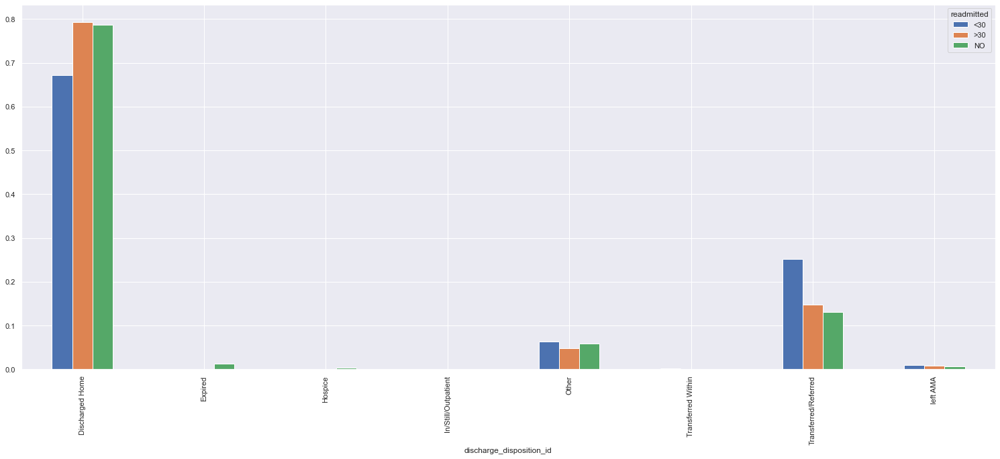

In [198]:
pd.crosstab(df_visual_diabetic['discharge_disposition_id'],df_visual_diabetic['readmitted'],normalize='columns').plot(kind='bar',figsize=(26,10));

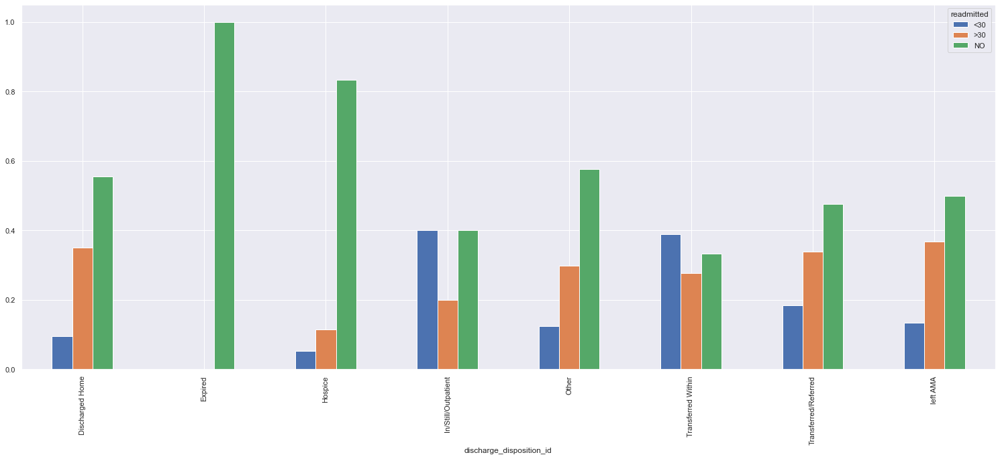

In [199]:
pd.crosstab(df_visual_diabetic['discharge_disposition_id'],df_visual_diabetic['readmitted'],normalize='index').plot(kind='bar',figsize=(26,10));

In [200]:
pd.crosstab(df_visual_diabetic['patient_frequency_categorized'],df_visual_diabetic['readmitted'],margins=True)

readmitted,<30,>30,NO,All
patient_frequency_categorized,,,,
1-time,1726,6718,18387,26831
2-5 times,2006,5620,2329,9955
6-10 times,237,520,64,821
more than 10 times,190,185,8,383
All,4159,13043,20788,37990


In [201]:
# Nearly 4200 patients were readmitted in the first instance itself..

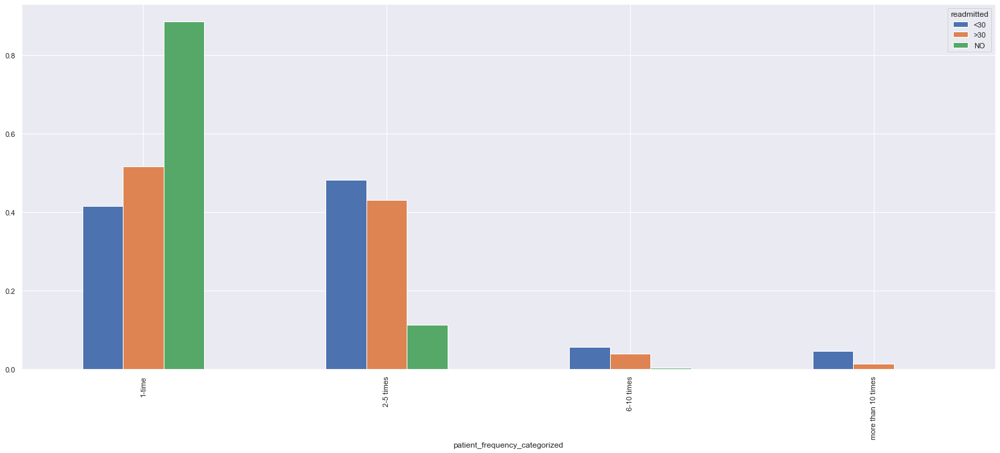

In [202]:
pd.crosstab(df_visual_diabetic['patient_frequency_categorized'],df_visual_diabetic['readmitted'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [203]:
# patients who visit the hospital more than once are more likely to be readmitted..

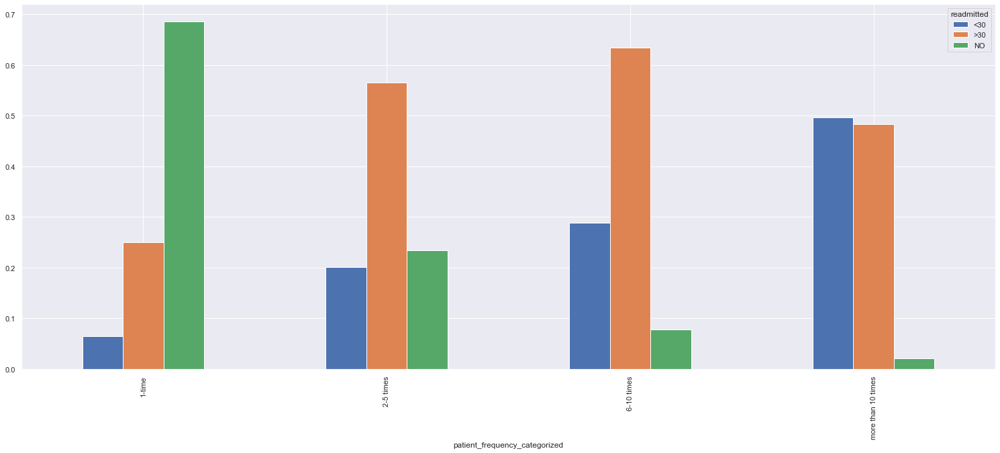

In [204]:
pd.crosstab(df_visual_diabetic['patient_frequency_categorized'],df_visual_diabetic['readmitted'],normalize='index').plot(kind='bar',figsize=(26,10));

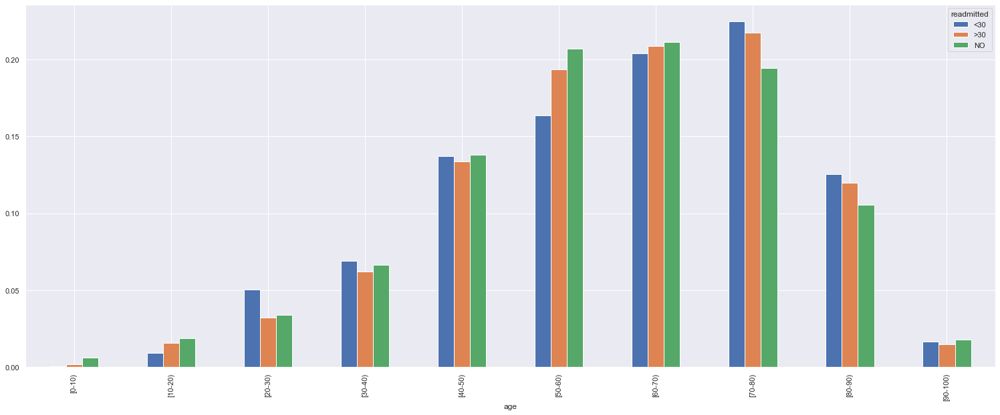

In [205]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['readmitted'],normalize='columns').plot(kind='bar',figsize=(26,10));

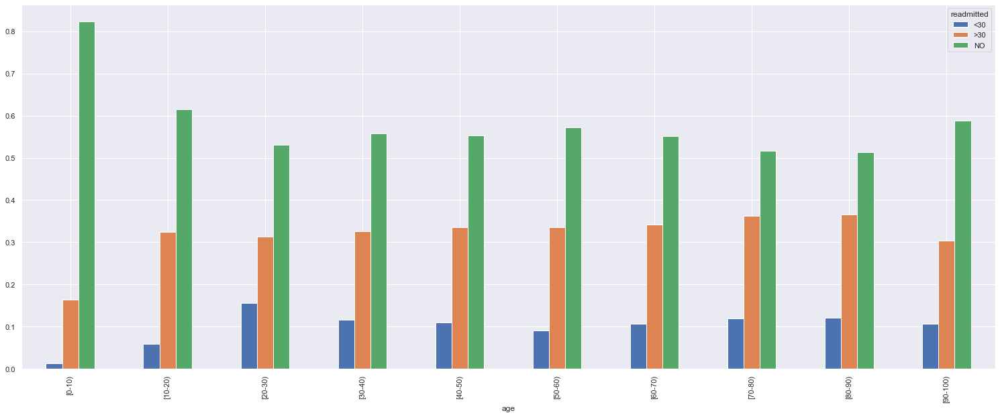

In [206]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['readmitted'],normalize='index').plot(kind='bar',figsize=(26,10));

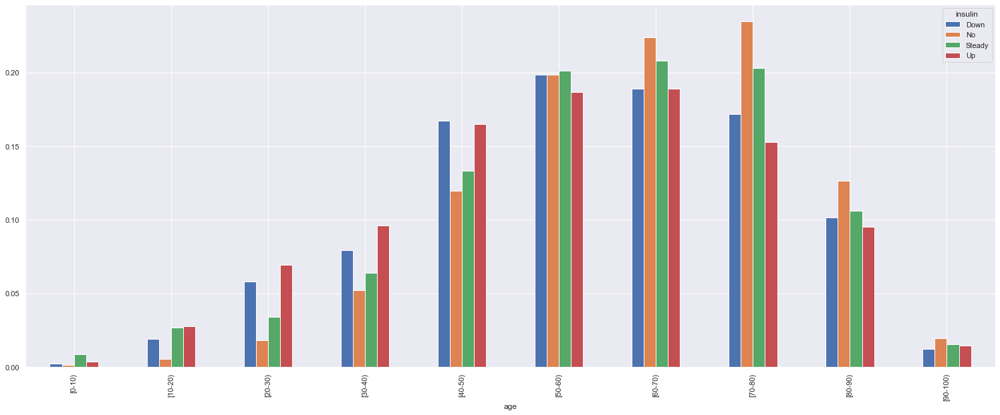

In [207]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['insulin'],normalize='columns').plot(kind='bar',figsize=(26,10));

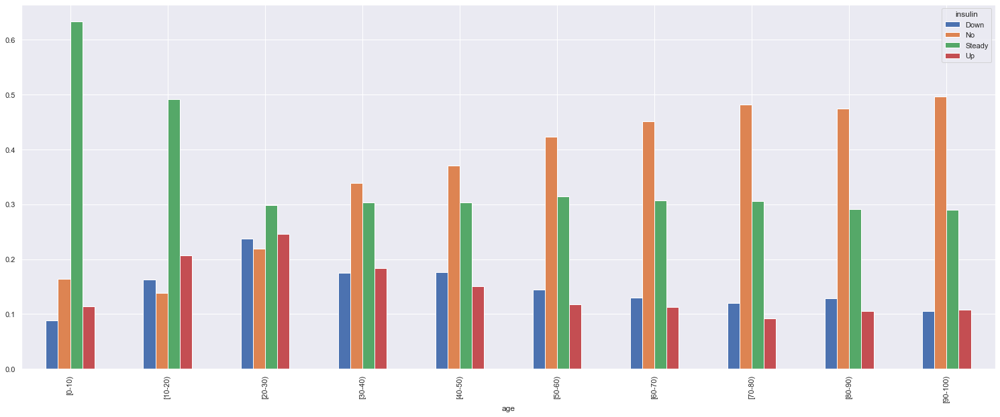

In [208]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['insulin'],normalize='index').plot(kind='bar',figsize=(26,10));

In [209]:
# diabetesMed,change,age,insulin,A1Cresult,max_glu_serum

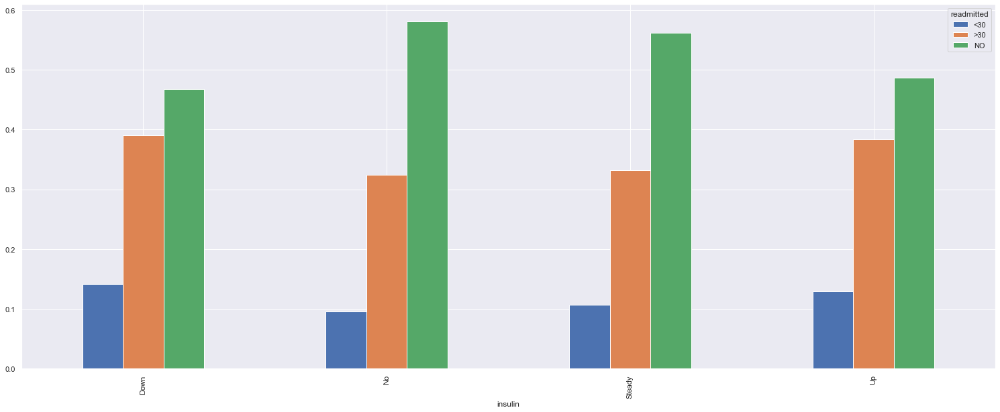

In [210]:
pd.crosstab(df_visual_diabetic['insulin'],df_visual_diabetic['readmitted'],normalize='index').plot(kind='bar',figsize=(26,10));

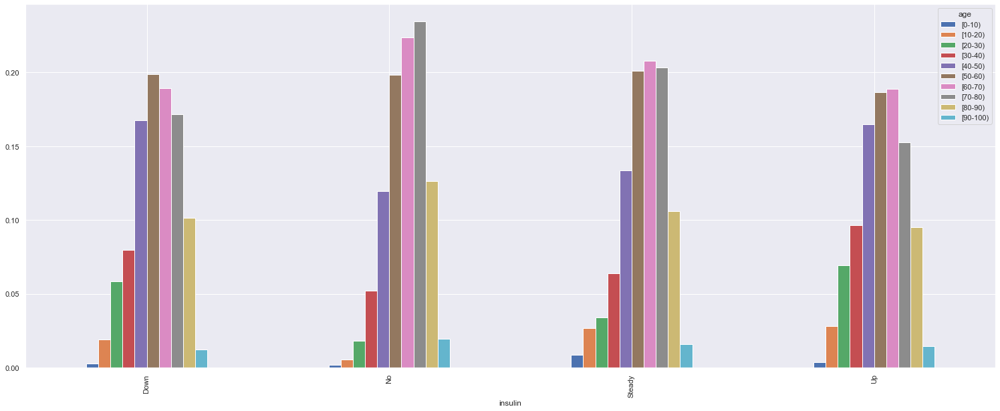

In [211]:
pd.crosstab(df_visual_diabetic['insulin'],df_visual_diabetic['age'],normalize='index').plot(kind='bar',figsize=(26,10));

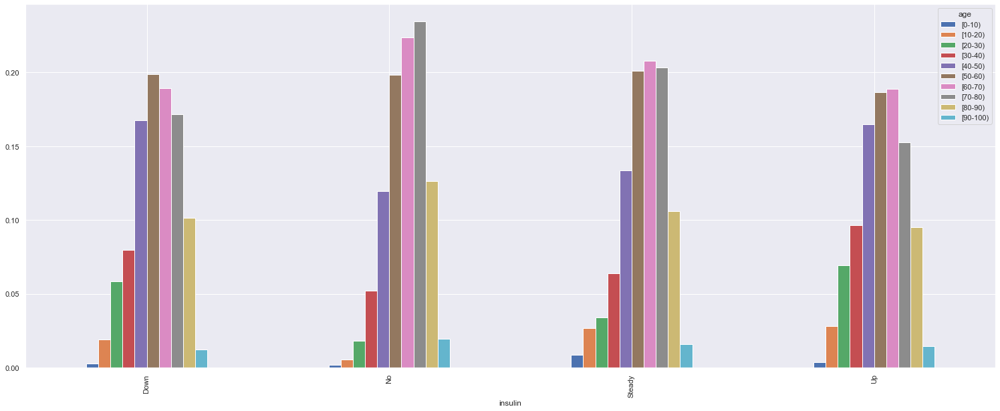

In [212]:
pd.crosstab(df_visual_diabetic['insulin'],df_visual_diabetic['age'],normalize='index').plot(kind='bar',figsize=(26,10));

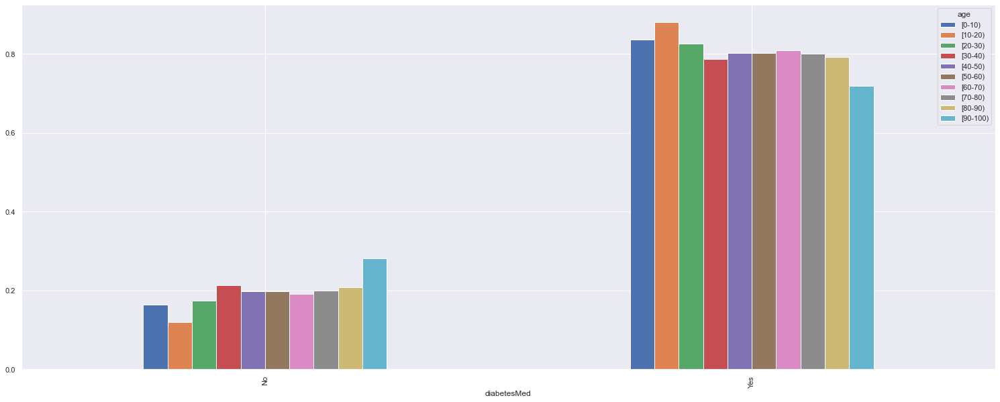

In [213]:
pd.crosstab(df_visual_diabetic['diabetesMed'],df_visual_diabetic['age'],normalize='columns').plot(kind='bar',figsize=(26,10));

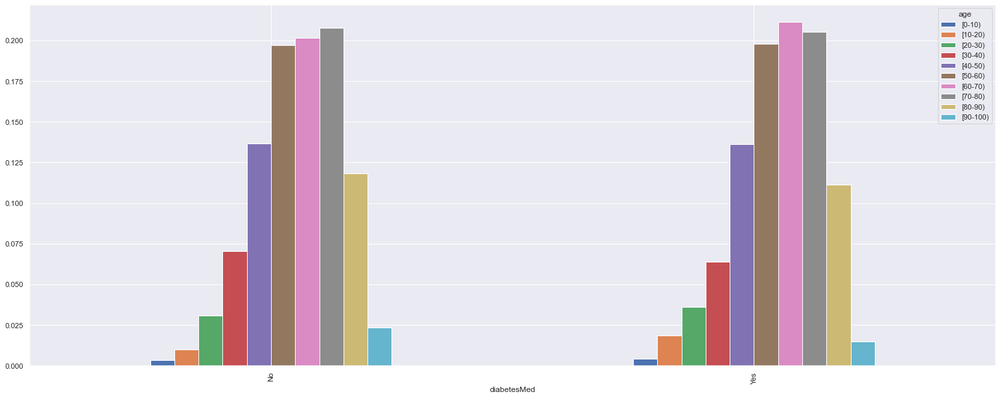

In [214]:
pd.crosstab(df_visual_diabetic['diabetesMed'],df_visual_diabetic['age'],normalize='index').plot(kind='bar',figsize=(26,10));

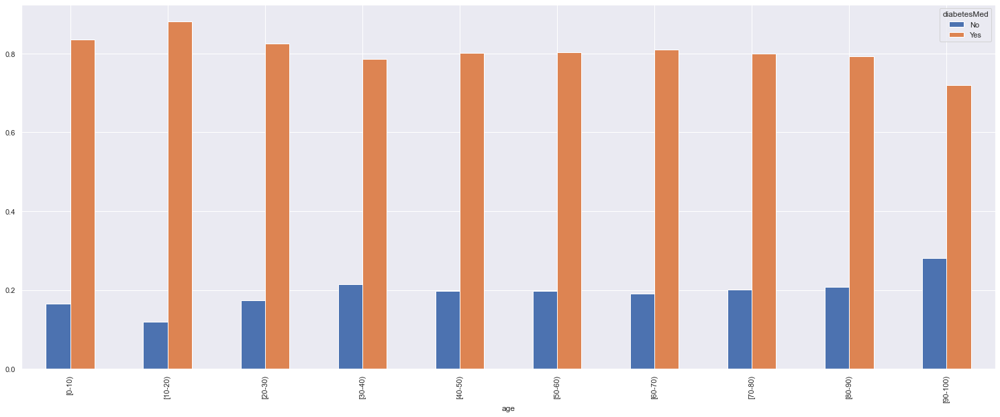

In [215]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['diabetesMed'],normalize='index').plot(kind='bar',figsize=(26,10));

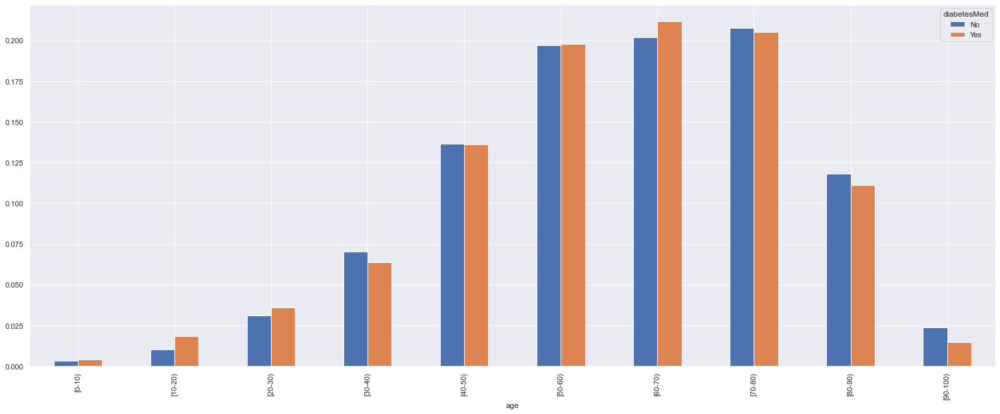

In [216]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['diabetesMed'],normalize='columns').plot(kind='bar',figsize=(26,10));

In [217]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['A1Cresult'],normalize='columns',margins=True)

A1Cresult,>7,>8,None,Norm,All
age,,,,,
[0-10),0.001440,0.016579,0.002171,0.005257,0.004159
[10-20),0.007919,0.055600,0.010153,0.027453,0.016768
[20-30),0.012959,0.060453,0.031727,0.039720,0.035141
[30-40),0.041037,0.097452,0.060849,0.067757,0.065201
[40-50),0.127430,0.184391,0.128077,0.150117,0.136378
[50-60),0.195104,0.228670,0.191197,0.225467,0.197763
[60-70),0.220302,0.170239,0.217213,0.181659,0.209608
[70-80),0.248380,0.123939,0.219417,0.166472,0.205659
[80-90),0.130310,0.055803,0.120796,0.119743,0.112635


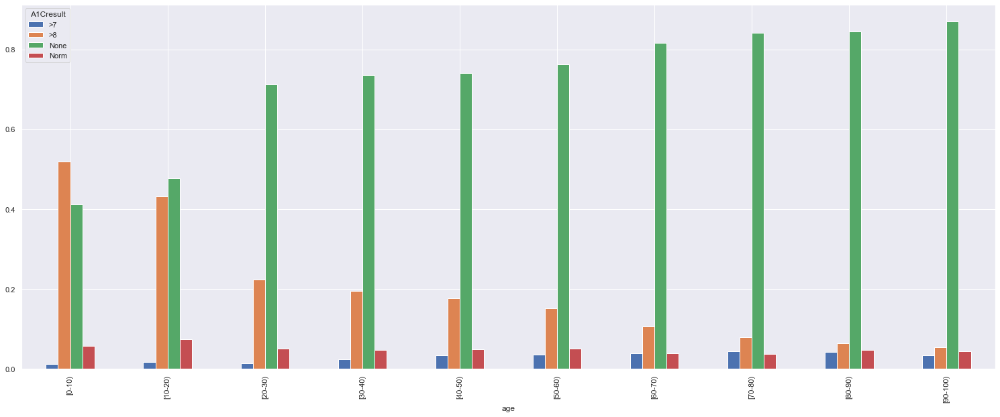

In [218]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['A1Cresult'],normalize='index').plot(kind='bar',figsize=(26,10));

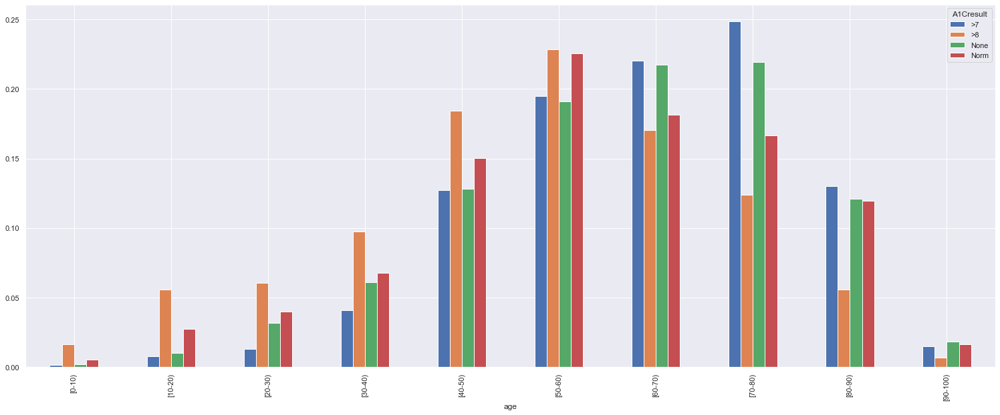

In [219]:
pd.crosstab(df_visual_diabetic['age'],df_visual_diabetic['A1Cresult'],normalize='columns').plot(kind='bar',figsize=(26,10));

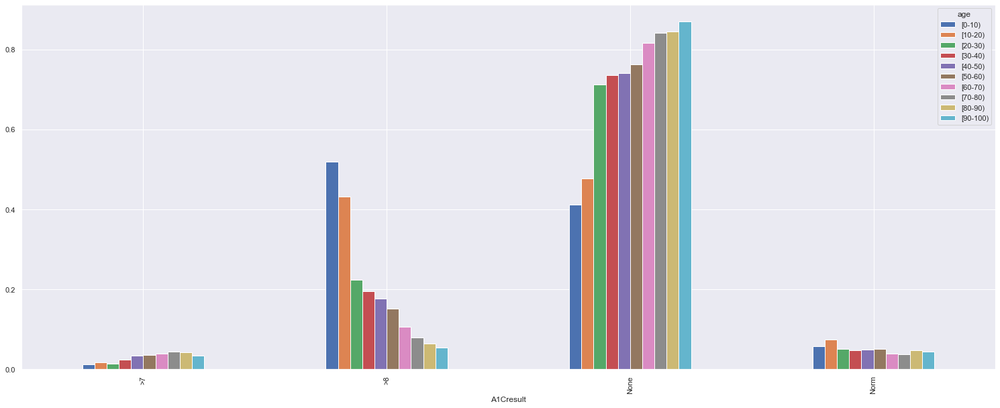

In [220]:
pd.crosstab(df_visual_diabetic['A1Cresult'],df_visual_diabetic['age'],normalize='columns').plot(kind='bar',figsize=(26,10));

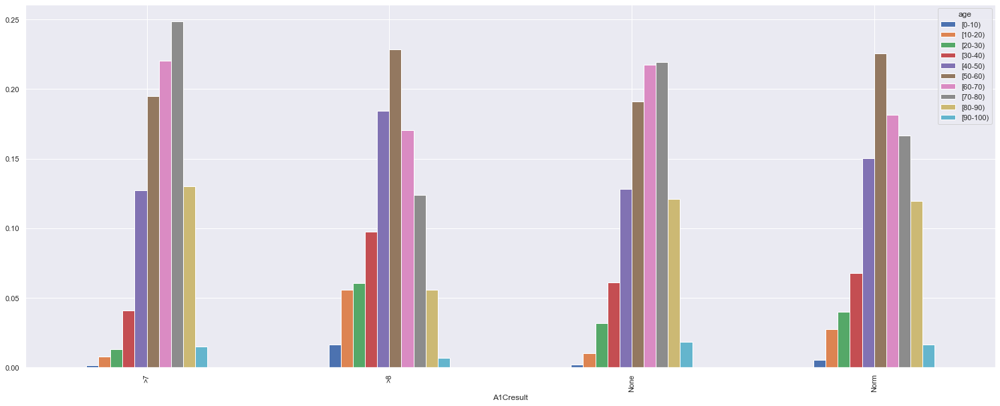

In [221]:
pd.crosstab(df_visual_diabetic['A1Cresult'],df_visual_diabetic['age'],normalize='index').plot(kind='bar',figsize=(26,10));

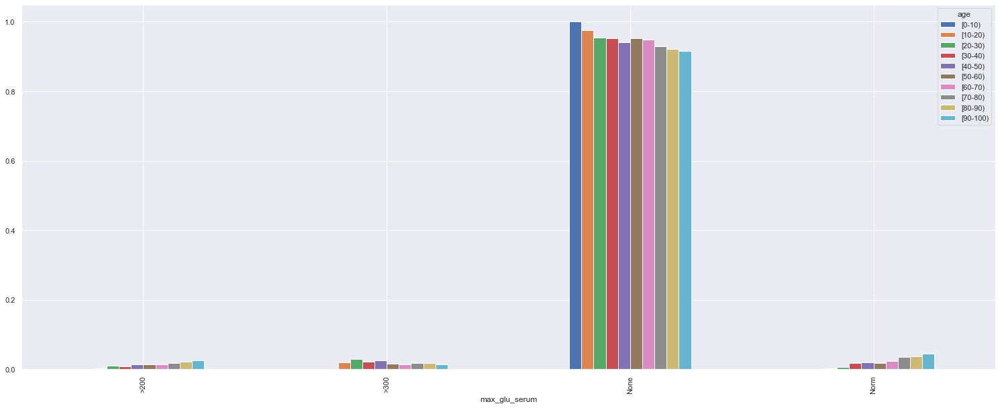

In [222]:
pd.crosstab(df_visual_diabetic['max_glu_serum'],df_visual_diabetic['age'],normalize='columns').plot(kind='bar',figsize=(26,10));

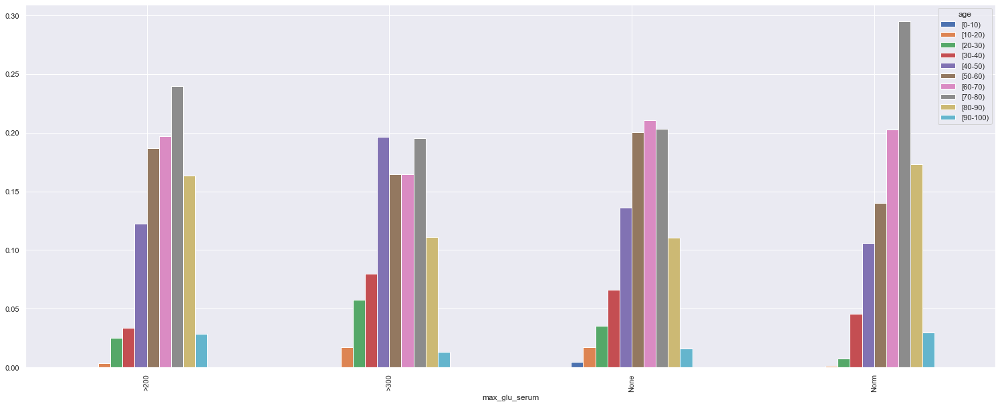

In [223]:
pd.crosstab(df_visual_diabetic['max_glu_serum'],df_visual_diabetic['age'],normalize='index').plot(kind='bar',figsize=(26,10));

In [224]:
df_visual_diabetic.drop(columns=['patient_frequency_categorized'],inplace=True)

In [225]:
df_visual_diabetic.drop(columns=['patient_nbr'],inplace=True)

In [226]:
index_to_be_dropped = df_visual_diabetic[df_visual_diabetic['discharge_disposition_id']=='Expired'].index

In [227]:
df_visual_diabetic.drop(index_to_be_dropped,inplace=True)

In [228]:
df_visual_diabetic.to_csv('Diabetic_data_for_stats.csv')

# Statistical Test

In [229]:
df_stat_diabetic = pd.read_csv('Diabetic_data_for_stats.csv',index_col=0)


df_stat_diabetic.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,1,1,41,0,1,0,0,0,1,Caucasian,Female,[0-10),Other,Other,Referral,Diabetes,NaN,NaN,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,1,3,59,0,18,0,0,0,9,Caucasian,Female,[10-20),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,1,2,11,5,13,2,0,1,6,AfricanAmerican,Female,[20-30),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,1,2,44,1,16,0,0,0,7,Caucasian,Male,[30-40),Emergency,Discharged Home,Emergency Room,other,Diabetes,Circulatory,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,1,1,51,0,8,0,0,0,5,Caucasian,Male,[40-50),Emergency,Discharged Home,Emergency Room,Neoplasms,Neoplasms,Diabetes,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [230]:
df_stat_diabetic.isnull().sum()

patient_frequency              0
time_in_hospital               0
num_lab_procedures             0
num_procedures                 0
num_medications                0
number_outpatient              0
number_emergency               0
number_inpatient               0
number_diagnoses               0
race                         912
gender                         0
age                            0
admission_type_id              0
discharge_disposition_id       0
admission_source_id            0
diag_1                         0
diag_2                       223
diag_3                      1260
max_glu_serum                  0
A1Cresult                      0
metformin                      0
repaglinide                    0
nateglinide                    0
chlorpropamide                 0
glimepiride                    0
acetohexamide                  0
glipizide                      0
glyburide                      0
tolbutamide                    0
pioglitazone                   0
rosiglitaz

In [231]:
# mode imputation for statistical analysis

In [232]:
for col in ['race','diag_2','diag_3']:
    df_stat_diabetic[col] = df_stat_diabetic[col].fillna(df_stat_diabetic[col].mode()[0])

In [233]:
df_stat_diabetic.isnull().sum()

patient_frequency           0
time_in_hospital            0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
number_diagnoses            0
race                        0
gender                      0
age                         0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
diag_1                      0
diag_2                      0
diag_3                      0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazone                0
rosiglitazone               0
acarbose                    0
miglitol                    0
troglitazo

In [234]:
df_stat_diabetic.shape

(37726, 44)

In [235]:
cat=df_stat_diabetic.select_dtypes(np.object)
cat.shape

(37726, 35)

In [236]:
quasi_constant_feat = []

for feature in df_stat_diabetic.columns:

    predominant = (df_stat_diabetic[feature].value_counts() / np.float(len(df_stat_diabetic))).sort_values(ascending=False).values[0]
    #print(predominant)

    if predominant > 0.998:
        
        quasi_constant_feat.append(feature)

len(quasi_constant_feat)

0.7057201929703653
0.19596564703387584
0.03628797116047288
0.4987011610030218
0.06332502783226422
0.8522239304458463
0.8875311456290091
0.6959656470338759
0.2998197529555214
0.7307692307692307
0.5386205799713726
0.2100673275724964
0.516858400042411
0.7818480623442718
0.5481365636431108
0.2322801251126544
0.34305253671208186
0.4839898213433706
0.9424004665217621
0.7877856120447437
0.7738959868525686
0.9874887345597201
0.9939564226263055
0.9990457509409956
0.9521550124582516
1.0
0.8800561946668081
0.8987965859089222
0.9998144515718602
0.9264963155383555
0.9334676350527488
0.9971637597412925
0.9996289031437205
0.9999734930816944
0.9996023962254148
0.42273233313894926
0.99276361130255
0.9998939723267772
0.9999734930816944
1.0
0.9999734930816944
0.5018024704447861
0.8026559932142289
0.5440279913057308


10

In [237]:
quasi_constant_feat

['chlorpropamide',
 'acetohexamide',
 'tolbutamide',
 'miglitol',
 'troglitazone',
 'tolazamide',
 'glipizide-metformin',
 'glimepiride-pioglitazone',
 'metformin-rosiglitazone',
 'metformin-pioglitazone']

### CHI-SQUARED TEST FOR INDEPENDENCE

In [238]:
categorical_columns = df_stat_diabetic.select_dtypes(include='object').columns.tolist()

In [239]:
# define a function that returns a table, a chi-square value, and a p value
def chisquare_test(df, var_list, target, null_list=[]):
    for var in var_list:
        print('\n\n',var.upper())
        chi_test = pd.crosstab(df[var], df[target])
        display(chi_test)
        
        chisq_value, pvalue, dof, expected = chi2_contingency(chi_test)
        print('---'*10,'\nExpected Chi table ')
        display(pd.DataFrame(expected,index=chi_test.index,columns=chi_test.columns))
        print(f"""Chi-square value: {chisq_value:.2f}
p-value\t\t: {pvalue:.3f}         for      {var.upper()}\n""")
        print('===='*30)
        
        if pvalue > 0.05: # adds variables that fail to reject the null hypothesis
            null_list.append(var)
            
    print(f'Failed to Reject null hypothesis: {null_list}')

In [240]:
cols_cat = df_stat_diabetic.select_dtypes(exclude=np.number).columns.to_list()
chi_squared_failed_features=[]
chisquare_test(df_stat_diabetic, cols_cat,'readmitted',chi_squared_failed_features)



 RACE


readmitted,<30,>30,NO
race,,,
AfricanAmerican,925,2884,4570
Asian,20,58,149
Caucasian,3074,9647,14848
Hispanic,85,287,571
Other,55,167,386


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
race,,,
AfricanAmerican,923.720007,2896.869453,4558.410539
Asian,25.024996,78.480650,123.494354
Caucasian,3039.269231,9531.423077,14998.307692
Hispanic,103.958464,326.023141,513.018396
Other,67.027302,210.203679,330.769019


Chi-square value: 49.96
p-value		: 0.000         for      RACE



 GENDER


readmitted,<30,>30,NO
gender,,,
Female,2318,7212,10790
Male,1841,5831,9734


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
gender,,,
Female,2240.122992,7025.228225,11054.648783
Male,1918.877008,6017.771775,9469.351217


Chi-square value: 30.36
p-value		: 0.000         for      GENDER



 AGE


readmitted,<30,>30,NO
age,,,
[0-10),2,26,129
[10-20),38,207,392
[20-30),209,418,705
[30-40),288,808,1377
[40-50),571,1742,2853
[50-60),680,2527,4263
[60-70),848,2724,4353
[70-80),934,2836,3981
[80-90),521,1562,2119


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
age,,,
[0-10),17.308037,54.279568,85.412395
[10-20),70.224328,220.229841,346.545830
[20-30),146.842708,460.512008,724.645284
[30-40),272.629142,854.989636,1345.381222
[40-50),569.511584,1786.039813,2810.448603
[50-60),823.509781,2582.601124,4063.889095
[60-70),873.670015,2739.908154,4311.421831
[70-80),854.487860,2679.751180,4216.760961
[80-90),463.238032,1452.756348,2286.005619


Chi-square value: 205.99
p-value		: 0.000         for      AGE



 ADMISSION_TYPE_ID


readmitted,<30,>30,NO
admission_type_id,,,
Elective,734,2193,4508
Emergency,2228,6930,10341
Newborn,1,0,3
Other,434,1610,2045
Trauma Center,0,0,2
Urgent,762,2310,3625


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
admission_type_id,,,
Elective,819.651301,2570.500583,4044.848115
Emergency,2149.614086,6741.384112,10608.001802
Newborn,0.440969,1.382919,2.176112
Other,450.780655,1413.688888,2224.530456
Trauma Center,0.220485,0.691459,1.088056
Urgent,738.292504,2315.352038,3643.355458


Chi-square value: 179.60
p-value		: 0.000         for      ADMISSION_TYPE_ID



 DISCHARGE_DISPOSITION_ID


readmitted,<30,>30,NO
discharge_disposition_id,,,
Discharged Home,2793,10350,16353
Hospice,5,11,80
In/Still/Outpatient,2,1,2
Other,261,631,1218
Transferred Within,7,5,6
Transferred/Referred,1050,1933,2713
left AMA,41,112,152


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
discharge_disposition_id,,,
Discharged Home,3251.706091,10197.644277,16046.649632
Hospice,10.583258,33.190055,52.226687
In/Still/Outpatient,0.551211,1.728649,2.720140
Other,232.611197,729.489742,1147.899062
Transferred Within,1.984361,6.223135,9.792504
Transferred/Referred,627.939988,1969.276573,3098.783438
left AMA,33.623893,105.447569,165.928537


Chi-square value: 480.69
p-value		: 0.000         for      DISCHARGE_DISPOSITION_ID



 ADMISSION_SOURCE_ID


readmitted,<30,>30,NO
admission_source_id,,,
Emergency Room,2396,7790,10493
Law Enforcement,1,1,5
Other,267,935,1352
Referral,1258,3897,7165
Transfer,237,420,1509


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
admission_source_id,,,
Emergency Room,2279.699968,7149.345200,11249.954832
Law Enforcement,0.771696,2.420108,3.808196
Other,281.558766,882.993744,1389.447490
Referral,1358.184806,4259.390341,6702.424853
Transfer,238.784764,748.850607,1178.364629


Chi-square value: 427.72
p-value		: 0.000         for      ADMISSION_SOURCE_ID



 DIAG_1


readmitted,<30,>30,NO
diag_1,,,
Circulatory,973,3068,4722
Diabetes,1137,3316,4237
Digestive,309,1002,1720
Genitourinary,129,484,796
Injury,226,547,953
Musculoskeletal,202,623,1477
Neoplasms,79,209,632
Respiratory,417,1794,2570
other,687,2000,3417


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
diag_1,,,
Circulatory,966.053040,3029.629672,4767.317288
Diabetes,958.005354,3004.391401,4727.603244
Digestive,334.144330,1047.906828,1648.948842
Genitourinary,155.331363,487.133197,766.535440
Injury,190.278164,596.729523,938.992313
Musculoskeletal,253.777713,795.869851,1252.352436
Neoplasms,101.422891,318.071357,500.505752
Respiratory,527.068308,1652.933865,2600.997826
other,672.918836,2110.334305,3320.746859


Chi-square value: 350.85
p-value		: 0.000         for      DIAG_1



 DIAG_2


readmitted,<30,>30,NO
diag_2,,,
Circulatory,930,2994,4664
Diabetes,1366,4236,7340
Digestive,150,427,639
Genitourinary,217,665,923
Injury,52,107,216
Musculoskeletal,72,241,378
Neoplasms,70,111,224
Respiratory,245,867,1133
other,1057,3395,5007


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
diag_2,,,
Circulatory,946.760643,2969.126968,4672.112389
Diabetes,1426.755500,4474.434236,7040.810263
Digestive,134.054604,420.407358,661.538037
Genitourinary,198.987303,624.042173,981.970524
Injury,41.340852,129.648651,204.010497
Musculoskeletal,76.177411,238.899247,375.923342
Neoplasms,44.648121,140.020543,220.331336
Respiratory,247.493903,776.163256,1221.342840
other,1042.781663,3270.257568,5145.960770


Chi-square value: 93.04
p-value		: 0.000         for      DIAG_2



 DIAG_3


readmitted,<30,>30,NO
diag_3,,,
Circulatory,716,2301,3530
Diabetes,1884,6129,10246
Digestive,143,401,422
Genitourinary,173,471,517
Injury,30,84,144
Musculoskeletal,66,222,348
Neoplasms,19,37,71
Respiratory,120,380,483
other,1008,3018,4763


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
diag_3,,,
Circulatory,721.756163,2263.492578,3561.751259
Diabetes,2012.913667,6312.679240,9933.407093
Digestive,106.494036,333.974924,525.531040
Genitourinary,127.991279,401.392223,631.616498
Injury,28.442506,89.198272,140.359222
Musculoskeletal,70.114086,219.884112,346.001802
Neoplasms,14.000769,43.907676,69.091555
Respiratory,108.368155,339.852330,534.779515
other,968.919339,3038.618645,4781.462016


Chi-square value: 135.92
p-value		: 0.000         for      DIAG_3



 MAX_GLU_SERUM


readmitted,<30,>30,NO
max_glu_serum,,,
>200,82,205,271
>300,96,302,282
None,3876,12204,19473
Norm,105,332,498


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
max_glu_serum,,,
>200,61.515188,192.917192,303.567619
>300,74.964746,235.096220,369.939034
None,3919.443540,12291.729285,19341.827175
Norm,103.076525,323.257303,508.666172


Chi-square value: 59.41
p-value		: 0.000         for      MAX_GLU_SERUM



 A1CRESULT


readmitted,<30,>30,NO
A1Cresult,,,
>7,148,440,796
>8,449,1664,2805
None,3393,10383,15944
Norm,169,556,979


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
A1Cresult,,,
>7,152.575306,478.489954,752.934740
>8,542.171500,1700.298839,2675.529661
None,3276.400360,10275.087738,16168.511902
Norm,187.852834,589.123469,927.023697


Chi-square value: 43.82
p-value		: 0.000         for      A1CRESULT



 METFORMIN


readmitted,<30,>30,NO
metformin,,,
Down,32,82,152
No,3405,10316,15475
Steady,686,2498,4566
Up,36,147,331


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
metformin,,,
Down,29.324445,91.964110,144.711446
No,3218.633409,10093.925357,15883.441234
Steady,854.377618,2679.405450,4216.216933
Up,56.664528,177.705084,279.630388


Chi-square value: 124.63
p-value		: 0.000         for      METFORMIN



 REPAGLINIDE


readmitted,<30,>30,NO
repaglinide,,,
Down,0,4,4
No,4101,12856,20297
Steady,50,172,197
Up,8,11,26


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
repaglinide,,,
Down,0.881938,2.765838,4.352224
No,4106.965647,12879.815565,20267.218788
Steady,46.191512,144.860759,227.947728
Up,4.960902,15.557838,24.481260


Chi-square value: 14.45
p-value		: 0.025         for      REPAGLINIDE



 NATEGLINIDE


readmitted,<30,>30,NO
nateglinide,,,
Down,0,2,3
No,4137,12962,20399
Steady,21,78,116
Up,1,1,6


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
nateglinide,,,
Down,0.551211,1.728649,2.720140
No,4133.864762,12964.173620,20399.961618
Steady,23.702089,74.331893,116.966018
Up,0.881938,2.765838,4.352224


Chi-square value: 2.89
p-value		: 0.823         for      NATEGLINIDE



 CHLORPROPAMIDE


readmitted,<30,>30,NO
chlorpropamide,,,
Down,0,0,1
No,4157,13029,20504
Steady,2,13,19
Up,0,1,0


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
chlorpropamide,,,
Down,0.110242,0.345730,0.544028
No,4155.031278,13030.553730,20504.414992
Steady,3.748237,11.754811,18.496952
Up,0.110242,0.345730,0.544028


Chi-square value: 3.69
p-value		: 0.718         for      CHLORPROPAMIDE



 GLIMEPIRIDE


readmitted,<30,>30,NO
glimepiride,,,
Down,6,27,41
No,3997,12415,19509
Steady,140,571,909
Up,16,30,65


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
glimepiride,,,
Down,8.157928,25.584000,40.258071
No,3960.012697,12418.957827,19542.029476
Steady,178.592483,560.082171,881.325346
Up,12.236892,38.376001,60.387107


Chi-square value: 13.82
p-value		: 0.032         for      GLIMEPIRIDE



 ACETOHEXAMIDE


readmitted,<30,>30,NO
acetohexamide,,,
No,4159,13043,20524


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
acetohexamide,,,
No,4159.0,13043.0,20524.0


Chi-square value: 0.00
p-value		: 1.000         for      ACETOHEXAMIDE



 GLIPIZIDE


readmitted,<30,>30,NO
glipizide,,,
Down,27,67,87
No,3713,11446,18042
Steady,390,1426,2242
Up,29,104,153


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
glipizide,,,
Down,19.953851,62.577082,98.469066
No,3660.153714,11478.572947,18062.273339
Steady,447.363145,1402.971267,2207.665589
Up,31.529290,98.878704,155.592006


Chi-square value: 13.79
p-value		: 0.032         for      GLIPIZIDE



 GLYBURIDE


readmitted,<30,>30,NO
glyburide,,,
Down,19,67,113
No,3783,11798,18327
Steady,316,1085,1905
Up,41,93,179


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
glyburide,,,
Down,21.938212,68.800217,108.261570
No,3738.095001,11723.003870,18446.901129
Steady,364.460955,1142.982505,1798.556539
Up,34.505832,108.213407,170.280761


Chi-square value: 21.94
p-value		: 0.001         for      GLYBURIDE



 TOLBUTAMIDE


readmitted,<30,>30,NO
tolbutamide,,,
No,4159,13042,20518
Steady,0,1,6


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
tolbutamide,,,
No,4158.228304,13040.579892,20520.191804
Steady,0.771696,2.420108,3.808196


Chi-square value: 2.87
p-value		: 0.238         for      TOLBUTAMIDE



 PIOGLITAZONE


readmitted,<30,>30,NO
pioglitazone,,,
Down,4,22,21
No,3881,12067,19005
Steady,264,910,1447
Up,10,44,51


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
pioglitazone,,,
Down,5.181387,16.249298,25.569316
No,3853.298176,12084.291444,19015.410380
Steady,288.944998,906.157637,1425.897365
Up,11.575439,36.301622,57.122939


Chi-square value: 8.34
p-value		: 0.214         for      PIOGLITAZONE



 ROSIGLITAZONE


readmitted,<30,>30,NO
rosiglitazone,,,
Down,1,12,22
No,3924,12103,19189
Steady,227,909,1270
Up,7,19,43


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
rosiglitazone,,,
Down,3.858480,12.100541,19.040980
No,3882.291894,12175.218364,19158.489742
Steady,265.242909,831.825744,1308.931347
Up,7.606717,23.855352,37.537931


Chi-square value: 19.17
p-value		: 0.004         for      ROSIGLITAZONE



 ACARBOSE


readmitted,<30,>30,NO
acarbose,,,
No,4150,12993,20476
Steady,8,46,46
Up,1,4,2


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
acarbose,,,
No,4147.204077,13006.006918,20465.789005
Steady,11.024227,34.572974,54.402799
Up,0.771696,2.420108,3.808196


Chi-square value: 7.88
p-value		: 0.096         for      ACARBOSE



 MIGLITOL


readmitted,<30,>30,NO
miglitol,,,
Down,1,0,0
No,4157,13035,20520
Steady,1,7,3
Up,0,1,1


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
miglitol,,,
Down,0.110242,0.345730,0.544028
No,4157.456608,13038.159784,20516.383608
Steady,1.212665,3.803027,5.984308
Up,0.220485,0.691459,1.088056


Chi-square value: 12.65
p-value		: 0.049         for      MIGLITOL



 TROGLITAZONE


readmitted,<30,>30,NO
troglitazone,,,
No,4159,13042,20524
Steady,0,1,0


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
troglitazone,,,
No,4158.889758,13042.65427,20523.455972
Steady,0.110242,0.34573,0.544028


Chi-square value: 1.89
p-value		: 0.388         for      TROGLITAZONE



 TOLAZAMIDE


readmitted,<30,>30,NO
tolazamide,,,
No,4158,13043,20510
Steady,1,0,14


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
tolazamide,,,
No,4157.346366,13037.814054,20515.83958
Steady,1.653634,5.185946,8.16042


Chi-square value: 9.63
p-value		: 0.008         for      TOLAZAMIDE



 INSULIN


readmitted,<30,>30,NO
insulin,,,
Down,772,2128,2510
No,1527,5200,9221
Steady,1250,3901,6528
Up,610,1814,2265


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
insulin,,,
Down,596.410698,1870.397869,2943.191433
No,1758.143774,5513.697821,8676.158405
Steady,1287.519509,4037.777580,6353.702910
Up,516.926019,1621.126730,2550.947251


Chi-square value: 315.65
p-value		: 0.000         for      INSULIN



 GLYBURIDE-METFORMIN


readmitted,<30,>30,NO
glyburide-metformin,,,
Down,1,0,4
No,4129,12938,20386
Steady,29,105,129
Up,0,0,5


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
glyburide-metformin,,,
Down,0.551211,1.728649,2.720140
No,4128.903859,12948.615782,20375.480358
Steady,28.993718,90.926920,143.079362
Up,0.551211,1.728649,2.720140


Chi-square value: 10.46
p-value		: 0.106         for      GLYBURIDE-METFORMIN



 GLIPIZIDE-METFORMIN


readmitted,<30,>30,NO
glipizide-metformin,,,
No,4159,13041,20522
Steady,0,2,2


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
glipizide-metformin,,,
No,4158.559031,13041.617081,20521.823888
Steady,0.440969,1.382919,2.176112


Chi-square value: 0.73
p-value		: 0.694         for      GLIPIZIDE-METFORMIN



 GLIMEPIRIDE-PIOGLITAZONE


readmitted,<30,>30,NO
glimepiride-pioglitazone,,,
No,4159,13042,20524
Steady,0,1,0


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
glimepiride-pioglitazone,,,
No,4158.889758,13042.65427,20523.455972
Steady,0.110242,0.34573,0.544028


Chi-square value: 1.89
p-value		: 0.388         for      GLIMEPIRIDE-PIOGLITAZONE



 METFORMIN-ROSIGLITAZONE


readmitted,<30,>30,NO
metformin-rosiglitazone,,,
No,4159,13043,20524


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
metformin-rosiglitazone,,,
No,4159.0,13043.0,20524.0


Chi-square value: 0.00
p-value		: 1.000         for      METFORMIN-ROSIGLITAZONE



 METFORMIN-PIOGLITAZONE


readmitted,<30,>30,NO
metformin-pioglitazone,,,
No,4159,13043,20523
Steady,0,0,1


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
metformin-pioglitazone,,,
No,4158.889758,13042.65427,20523.455972
Steady,0.110242,0.34573,0.544028


Chi-square value: 0.84
p-value		: 0.658         for      METFORMIN-PIOGLITAZONE



 CHANGE


readmitted,<30,>30,NO
change,,,
Ch,2199,6827,9905
No,1960,6216,10619


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
change,,,
Ch,2086.996475,6545.009622,10298.993903
No,2072.003525,6497.990378,10225.006097


Chi-square value: 66.71
p-value		: 0.000         for      CHANGE



 DIABETESMED


readmitted,<30,>30,NO
diabetesMed,,,
No,774,2312,4359
Yes,3385,10731,16165


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
diabetesMed,,,
No,820.753724,2573.957881,4050.288395
Yes,3338.246276,10469.042119,16473.711605


Chi-square value: 65.85
p-value		: 0.000         for      DIABETESMED



 READMITTED


readmitted,<30,>30,NO
readmitted,,,
<30,4159,0,0
>30,0,13043,0
NO,0,0,20524


------------------------------ 
Expected Chi table 


readmitted,<30,>30,NO
readmitted,,,
<30,458.497614,1437.889970,2262.612416
>30,1437.889970,4509.352940,7095.757091
NO,2262.612416,7095.757091,11165.630494


Chi-square value: 75452.00
p-value		: 0.000         for      READMITTED

Failed to Reject null hypothesis: ['nateglinide', 'chlorpropamide', 'acetohexamide', 'tolbutamide', 'pioglitazone', 'acarbose', 'troglitazone', 'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone', 'metformin-rosiglitazone', 'metformin-pioglitazone']


In [241]:
chi_squared_failed_features

['nateglinide',
 'chlorpropamide',
 'acetohexamide',
 'tolbutamide',
 'pioglitazone',
 'acarbose',
 'troglitazone',
 'glyburide-metformin',
 'glipizide-metformin',
 'glimepiride-pioglitazone',
 'metformin-rosiglitazone',
 'metformin-pioglitazone']

### ONE-WAY ANOVA

In [242]:
# The numerical variables 
numerical=df_stat_diabetic.select_dtypes(include=np.number).columns.to_list()
print(numerical)

['patient_frequency', 'time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses']


In [243]:
# define a function that performs the ANOVA test and returns a table
def anova_table(var_list,target_column, failed_list=[],test_list=[]):
    for var in var_list:
        print('\n\n')
        print(var.upper())
        print('=='*20)
        for cat in df_stat_diabetic[target_column].unique():
            print(cat.upper())
            data = df_stat_diabetic[df_stat_diabetic[target_column]==cat][var]
            shapiro_stats = stats.shapiro(data)
            print(shapiro_stats)
            if shapiro_stats[1]<0.05:
                print(f'\n-----------------Shapiro test for {var} and {cat} has failed--------------------\n')
                
            print('--'*44,'\n')
            test_list.append(data)
            
        print(f'\nlevene  test for {var} \n')
        print(stats.levene(*test_list))
        print('--'*20,'\n\n')   
        print(f'\nanova  test for {var} \n')
        print(stats.f_oneway(*test_list))
        print('--'*20,'\n\n')
        print(f'\nkruskal  test for {var}\n')
        print(stats.kruskal(*test_list))
        print('--'*20,'\n\n')
        print('=='*50)  
        print('\n\n')
        

In [244]:
anova_table(numerical,'readmitted')




PATIENT_FREQUENCY
NO
ShapiroResult(statistic=0.2740901708602905, pvalue=0.0)

-----------------Shapiro test for patient_frequency and NO has failed--------------------

---------------------------------------------------------------------------------------- 

>30
ShapiroResult(statistic=0.4665907025337219, pvalue=0.0)

-----------------Shapiro test for patient_frequency and >30 has failed--------------------

---------------------------------------------------------------------------------------- 

<30
ShapiroResult(statistic=0.4724894165992737, pvalue=0.0)

-----------------Shapiro test for patient_frequency and <30 has failed--------------------

---------------------------------------------------------------------------------------- 


levene  test for patient_frequency 

LeveneResult(statistic=1733.744194711288, pvalue=0.0)
---------------------------------------- 



anova  test for patient_frequency 

F_onewayResult(statistic=1826.8836926668894, pvalue=0.0)
-------------------

KruskalResult(statistic=214973.7384128044, pvalue=0.0)
---------------------------------------- 








NUMBER_INPATIENT
NO
ShapiroResult(statistic=0.4310442805290222, pvalue=0.0)

-----------------Shapiro test for number_inpatient and NO has failed--------------------

---------------------------------------------------------------------------------------- 

>30
ShapiroResult(statistic=0.611181378364563, pvalue=0.0)

-----------------Shapiro test for number_inpatient and >30 has failed--------------------

---------------------------------------------------------------------------------------- 

<30
ShapiroResult(statistic=0.6385226845741272, pvalue=0.0)

-----------------Shapiro test for number_inpatient and <30 has failed--------------------

---------------------------------------------------------------------------------------- 


levene  test for number_inpatient 

LeveneResult(statistic=13388.486768091581, pvalue=0.0)
---------------------------------------- 



anova  test for

In [245]:
# All the numerical features are significant.

In [246]:
insignificant_features = list(set(quasi_constant_feat).union(set(chi_squared_failed_features)))

In [247]:
insignificant_features

['tolbutamide',
 'nateglinide',
 'glimepiride-pioglitazone',
 'glyburide-metformin',
 'metformin-rosiglitazone',
 'glipizide-metformin',
 'acetohexamide',
 'metformin-pioglitazone',
 'miglitol',
 'chlorpropamide',
 'acarbose',
 'tolazamide',
 'troglitazone',
 'pioglitazone']

In [248]:
df_stat_diabetic.drop(columns=insignificant_features,inplace=True)

In [249]:
df_stat_diabetic.shape

(37726, 30)

In [250]:
df_stat_diabetic.to_csv('Diabetic_data_for_encoding.csv')

## Encoding Ordinal Variables

In [251]:
df_encoding_diabetic = pd.read_csv('Diabetic_data_for_encoding.csv',index_col=0)


df_encoding_diabetic.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,rosiglitazone,insulin,change,diabetesMed,readmitted
0,1,1,41,0,1,0,0,0,1,Caucasian,Female,[0-10),Other,Other,Referral,Diabetes,Diabetes,Diabetes,None,None,No,No,No,No,No,No,No,No,No,NO
1,1,3,59,0,18,0,0,0,9,Caucasian,Female,[10-20),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,No,No,No,Up,Ch,Yes,>30
2,1,2,11,5,13,2,0,1,6,AfricanAmerican,Female,[20-30),Emergency,Discharged Home,Emergency Room,other,Diabetes,other,None,None,No,No,No,Steady,No,No,No,No,Yes,NO
3,1,2,44,1,16,0,0,0,7,Caucasian,Male,[30-40),Emergency,Discharged Home,Emergency Room,other,Diabetes,Circulatory,None,None,No,No,No,No,No,No,Up,Ch,Yes,NO
4,1,1,51,0,8,0,0,0,5,Caucasian,Male,[40-50),Emergency,Discharged Home,Emergency Room,Neoplasms,Neoplasms,Diabetes,None,None,No,No,No,Steady,No,No,Steady,Ch,Yes,NO


In [252]:
df_encoding_diabetic['age']=df_encoding_diabetic['age'].apply(lambda x: x[1]).astype(int)

In [253]:
df_encoding_diabetic['max_glu_serum']=df_encoding_diabetic['max_glu_serum'].replace({'None':0,'Norm':1,'>200':200,'>300':300}).astype(int)

In [254]:
df_encoding_diabetic['A1Cresult']=df_encoding_diabetic['A1Cresult'].replace({'None':0,'Norm':1,'>8':8,'>7':7}).astype(int)

In [255]:
for col in drugs_list:
    if col in df_encoding_diabetic.columns:
        df_encoding_diabetic[col].replace({'No':0,'Steady':0.5,'Down':-1,'Up':1},inplace=True)

In [256]:
df_encoding_diabetic.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,rosiglitazone,insulin,change,diabetesMed,readmitted
0,1,1,41,0,1,0,0,0,1,Caucasian,Female,0,Other,Other,Referral,Diabetes,Diabetes,Diabetes,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,No,No,NO
1,1,3,59,0,18,0,0,0,9,Caucasian,Female,1,Emergency,Discharged Home,Emergency Room,other,Diabetes,other,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Ch,Yes,>30
2,1,2,11,5,13,2,0,1,6,AfricanAmerican,Female,2,Emergency,Discharged Home,Emergency Room,other,Diabetes,other,0,0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,No,Yes,NO
3,1,2,44,1,16,0,0,0,7,Caucasian,Male,3,Emergency,Discharged Home,Emergency Room,other,Diabetes,Circulatory,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Ch,Yes,NO
4,1,1,51,0,8,0,0,0,5,Caucasian,Male,4,Emergency,Discharged Home,Emergency Room,Neoplasms,Neoplasms,Diabetes,0,0,0.0,0.0,0.0,0.5,0.0,0.0,0.5,Ch,Yes,NO


## MultiCollinearity

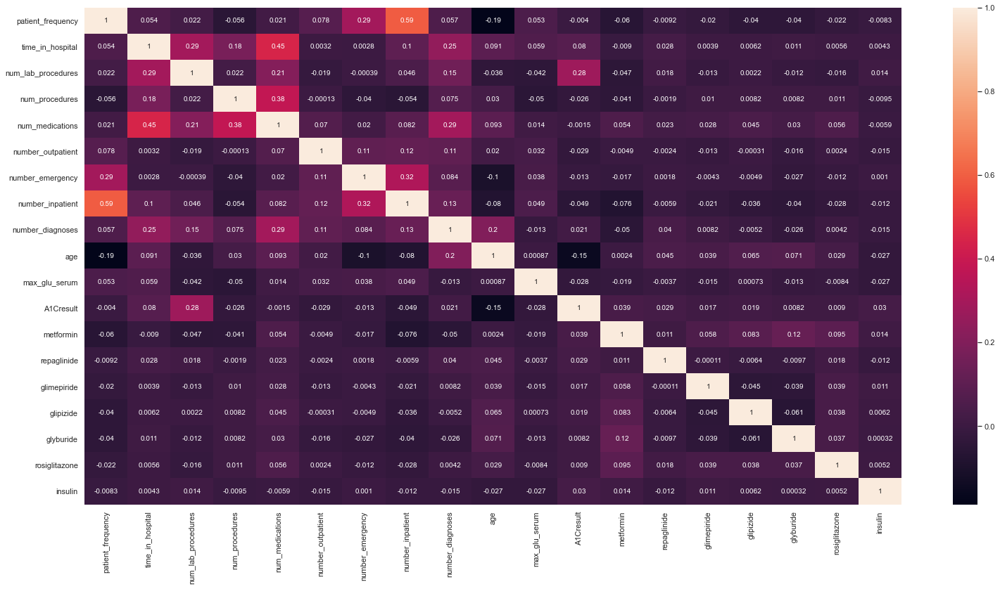

In [257]:
plt.figure(figsize=(26,13))
sns.heatmap(df_encoding_diabetic.corr(),annot=True)
plt.xticks(rotation=90)
plt.show()

### One Hot Encoding of Categorical Data

In [258]:
df_diabetic_for_ml=pd.get_dummies(df_encoding_diabetic.drop(columns=['readmitted']),drop_first=True)
df_diabetic_for_ml['readmitted'] = df_encoding_diabetic['readmitted']

In [259]:
df_diabetic_for_ml.to_csv('Diabetic_data_for_ml.csv')

## TRAIN TEST SPLIT and SCALING

In [260]:
df_diabetic_for_ml = pd.read_csv('Diabetic_data_for_ml.csv',index_col=0)
df_diabetic_for_ml.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Law Enforcement,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Transfer,diag_1_Diabetes,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Diabetes,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Diabetes,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes,readmitted
0,1,1,41,0,1,0,0,0,1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,NO
1,1,3,59,0,18,0,0,0,9,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,>30
2,1,2,11,5,13,2,0,1,6,2,0,0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,NO
3,1,2,44,1,16,0,0,0,7,3,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,NO
4,1,1,51,0,8,0,0,0,5,4,0,0,0.0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,NO


In [261]:
X=df_diabetic_for_ml.drop(columns=['readmitted'])
y=df_diabetic_for_ml['readmitted']

In [262]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)
sc =  StandardScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((26408, 65), (11318, 65), (26408,), (11318,))

In [263]:
X_train.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Law Enforcement,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Transfer,diag_1_Diabetes,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Diabetes,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Diabetes,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes
0,-0.333703,-1.059905,-1.368868,-0.732433,0.054022,-0.275274,-0.21252,-0.450313,0.271614,0.255022,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-0.240672,-0.078564,0.606577,-0.157598,-0.129868,-0.925375,0.968829,-0.006154,-0.347271,-0.008703,-0.465306,-0.054077,-0.013761,-0.244358,-0.02538,2.387999,-0.08996,-0.012308,-0.26673,-0.697869,-0.247131,-0.544967,-0.294911,5.069686,-0.217707,-0.253875,-0.155567,-0.381229,-0.445363,1.381670,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,-0.250392,-0.577583,-0.968021,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,1.804418,1.004402,-2.021941
1,-0.333703,2.898564,-1.005895,3.064603,0.316530,1.404357,-0.21252,0.281224,1.182906,0.825317,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,0.638518,-0.078564,0.606577,-0.157598,-0.129868,-0.925375,-1.032174,-0.006154,-0.347271,-0.008703,2.149122,-0.054077,-0.013761,-0.244358,-0.02538,2.387999,-0.08996,-0.012308,-0.26673,1.432934,-0.247131,1.834973,-0.294911,-0.197251,-0.217707,-0.253875,-0.155567,-0.381229,-0.445363,-0.723762,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,-0.250392,-0.577583,-0.968021,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,1.804418,1.004402,0.494574
2,-0.333703,0.019677,-0.228095,0.533245,0.316530,-0.275274,-0.21252,-0.450313,-0.184032,0.255022,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-0.240672,-0.078564,0.606577,-0.157598,-0.129868,1.080643,-1.032174,-0.006154,2.879592,-0.008703,-0.465306,-0.054077,-0.013761,-0.244358,-0.02538,-0.418761,-0.08996,-0.012308,-0.26673,-0.697869,-0.247131,-0.544967,-0.294911,-0.197251,4.593337,-0.253875,-0.155567,-0.381229,-0.445363,-0.723762,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,3.993737,-0.577583,1.033036,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,-0.554195,1.004402,-2.021941
3,-0.333703,-1.059905,-2.094814,-0.099594,-0.208487,-0.275274,-0.21252,-0.450313,-1.095324,0.825317,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-0.240672,-0.078564,0.606577,-0.157598,-0.129868,1.080643,-1.032174,-0.006154,-0.347271,-0.008703,-0.465306,-0.054077,-0.013761,-0.244358,-0.02538,-0.418761,-0.08996,-0.012308,-0.26673,1.432934,-0.247131,-0.544967,-0.294911,-0.197251,4.593337,-0.253875,-0.155567,-0.381229,-0.445363,-0.723762,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,-0.250392,-0.577583,1.033036,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,-0.554195,1.004402,0.494574
4,-0.333703,0.019677,-0.072535,-0.099594,-0.602249,-0.275274,-0.21252,-0.450313,-0.184032,-1.455863,-0.179633,-0.462781,1.579743,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-1.999052,-0.078564,-1.

In [264]:
y_train.head()

91836    <30
68978    >30
4508     >30
20838     NO
74195     NO
Name: readmitted, dtype: object

# MODEL BUILDING

## Logistic Regression:

In [265]:
cv_acc_train = {}
cv_acc_test = {}
cv_TPR = {}
cv_FPR = {}
cv_f1_train = {}
cv_f1_test = {}
cv_acc = {}

In [266]:
def plot_result(model, name:str):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    
    scores_train = cross_val_score(model, X_train, y_train, cv=5, scoring = 'balanced_accuracy')
    scores_test = cross_val_score(model, X_test, y_test, cv=5, scoring = 'balanced_accuracy')  
    scores_train_f1 = cross_val_score(model, X_train, y_train, cv=5, scoring = 'f1_micro')
    scores_test_f1 = cross_val_score(model, X_test, y_test, cv=5, scoring = 'f1_micro')  
    cv_acc_train[name] = round(scores_train.mean(), 4)*100 
    cv_acc_test[name] = round(scores_test.mean(), 4)*100
    cv_TPR[name] = (confusion_matrix(y_test, y_pred)[1][1]/confusion_matrix(y_test, y_pred)[1].sum())*100 
    cv_FPR[name] = (confusion_matrix(y_test, y_pred)[0][1]/confusion_matrix(y_test, y_pred)[0].sum())*100 
    cv_f1_train[name] = round(scores_train_f1.mean(), 4)*100 
    cv_f1_test[name] = round(scores_test_f1.mean(), 4)*100
    cv_acc[name] = accuracy_score(y_test,y_pred)
    print('Average Balanced Accuracy (CV=5), Test Set:', scores_test.mean())  
    print('Average Balanced Accuracy (CV=5), Training Set: ', scores_train.mean())
    print('Average Micro f1 (CV=5), Test Set:', scores_test_f1.mean())  
    print('Average Micro f1 (CV=5), Training Set: ', scores_train_f1.mean())

    
    print(classification_report(y_test, y_pred, zero_division=0))

    
    plot_confusion_matrix(model, X_test, y_test)
    plt.show()

In [267]:
lgc = LogisticRegression()
knc = KNeighborsClassifier()
dtc = DecisionTreeClassifier()
rfc = RandomForestClassifier()
abc = AdaBoostClassifier()
gbc = GradientBoostingClassifier()

Average Balanced Accuracy (CV=5), Test Set: 0.4504293162104401
Average Balanced Accuracy (CV=5), Training Set:  0.45379335591690523
Average Micro f1 (CV=5), Test Set: 0.640572257033957
Average Micro f1 (CV=5), Training Set:  0.640639225830191
              precision    recall  f1-score   support

         <30       0.38      0.03      0.06      1248
         >30       0.58      0.42      0.49      3913
          NO       0.66      0.90      0.77      6157

    accuracy                           0.64     11318
   macro avg       0.54      0.45      0.44     11318
weighted avg       0.60      0.64      0.59     11318



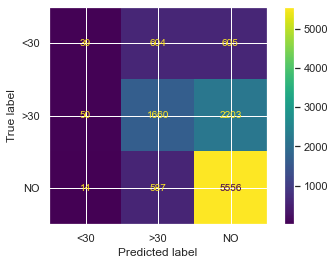

In [268]:
plot_result(lgc, "LogisticRegression_base")

Average Balanced Accuracy (CV=5), Test Set: 0.43091918504385374
Average Balanced Accuracy (CV=5), Training Set:  0.4416659940817144
Average Micro f1 (CV=5), Test Set: 0.5337512042708872
Average Micro f1 (CV=5), Training Set:  0.5390787962619669
              precision    recall  f1-score   support

         <30       0.20      0.21      0.21      1248
         >30       0.44      0.46      0.45      3913
          NO       0.68      0.66      0.67      6157

    accuracy                           0.54     11318
   macro avg       0.44      0.44      0.44     11318
weighted avg       0.54      0.54      0.54     11318



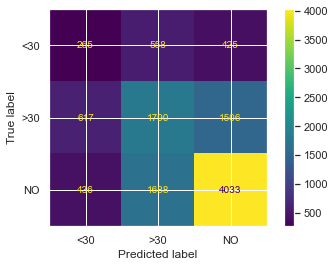

In [269]:
plot_result(dtc, "DecisionTreeClassifier_base")

Average Balanced Accuracy (CV=5), Test Set: 0.47314739421102237
Average Balanced Accuracy (CV=5), Training Set:  0.4815930314942863
Average Micro f1 (CV=5), Test Set: 0.6576243424329629
Average Micro f1 (CV=5), Training Set:  0.6622991870508617
              precision    recall  f1-score   support

         <30       0.47      0.04      0.07      1248
         >30       0.58      0.54      0.56      3913
          NO       0.71      0.87      0.78      6157

    accuracy                           0.66     11318
   macro avg       0.59      0.48      0.47     11318
weighted avg       0.64      0.66      0.62     11318



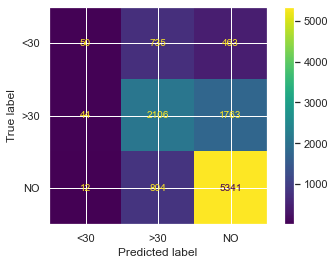

In [270]:
plot_result(rfc, "RandomForestClassifier_base")

Average Balanced Accuracy (CV=5), Test Set: 0.4698325553887327
Average Balanced Accuracy (CV=5), Training Set:  0.4729886172192832
Average Micro f1 (CV=5), Test Set: 0.6511745252010761
Average Micro f1 (CV=5), Training Set:  0.6488184550775747
              precision    recall  f1-score   support

         <30       0.33      0.06      0.11      1248
         >30       0.58      0.46      0.52      3913
          NO       0.68      0.88      0.77      6157

    accuracy                           0.65     11318
   macro avg       0.53      0.47      0.46     11318
weighted avg       0.61      0.65      0.61     11318



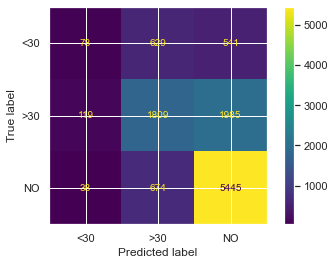

In [271]:
plot_result(abc, "AdaBoostClassifier_base")

Average Balanced Accuracy (CV=5), Test Set: 0.48013408671905405
Average Balanced Accuracy (CV=5), Training Set:  0.4847468680075299
Average Micro f1 (CV=5), Test Set: 0.6651350891355639
Average Micro f1 (CV=5), Training Set:  0.6660480826114579
              precision    recall  f1-score   support

         <30       0.39      0.04      0.07      1248
         >30       0.60      0.53      0.56      3913
          NO       0.71      0.89      0.79      6157

    accuracy                           0.67     11318
   macro avg       0.56      0.49      0.47     11318
weighted avg       0.63      0.67      0.63     11318



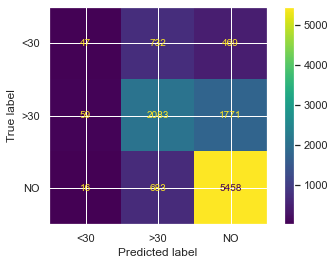

In [272]:
plot_result(gbc, "GradientBoostingClassifier_base")

In [273]:
def plot_multiclass_roc(clf, X_test, y_test, n_classes, figsize=(5,5)):
    
    
    y_score = clf.decision_function(X_test)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    # calculate dummies once
    y_test_dummies = pd.get_dummies(y_test, drop_first=False).values
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_dummies[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # roc for each class
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot([0, 1], [0, 1], 'k--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic example')
    for i in range(n_classes):
        ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for label %i' % (roc_auc[i], i))
    ax.legend(loc="best")
    ax.grid(alpha=.4)
    sns.despine()
    plt.show()

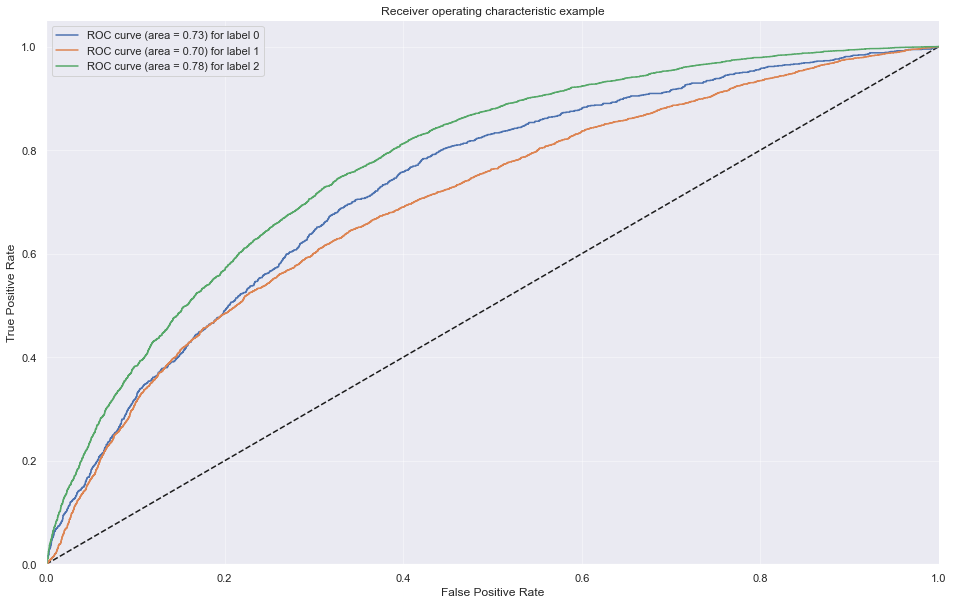

In [274]:
plot_multiclass_roc(lgc, X_test, y_test, n_classes=3, figsize=(16, 10))

# Feature Selection Using Embedded methods

### Feature Selection using Logistice Regression

In [275]:
sel2=SelectFromModel(LogisticRegression(penalty='l1',C=0.015,solver='saga'))
sel2.fit(X_train,y_train)

SelectFromModel(estimator=LogisticRegression(C=0.015, penalty='l1',
                                             solver='saga'))

In [276]:
len(X_train.columns)

65

In [277]:
selected_feat = X_train.columns[(sel2.get_support())]

In [278]:
len(selected_feat)

52

In [279]:
df_embedded=df_diabetic_for_ml[selected_feat]

In [280]:
df_embedded.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,A1Cresult,metformin,repaglinide,glipizide,glyburide,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Transfer,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Diabetes,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_other,diabetesMed_Yes
0,1,1,41,0,1,0,0,0,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,1,3,59,0,18,0,0,0,9,1,0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1
2,1,2,11,5,13,2,0,1,6,2,0,0.0,0.0,0.5,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1
3,1,2,44,1,16,0,0,0,7,3,0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1
4,1,1,51,0,8,0,0,0,5,4,0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1


In [281]:
X=df_embedded
Y=df_diabetic_for_ml['readmitted']

In [282]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30,stratify=Y, random_state=42)
sc =  StandardScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((26408, 52), (11318, 52), (26408,), (11318,))

In [283]:
log_reg_drop=LogisticRegression()
log_reg_drop.fit(X_train,y_train)

LogisticRegression()

In [284]:
print ('Accuracy Score of Train data set for Logistice Regression is',accuracy_score(y_train,log_reg_drop.predict(X_train)))
print ('Accuracy Score of Test data set for Logistice Regression is',accuracy_score(y_test,log_reg_drop.predict(X_test)))

Accuracy Score of Train data set for Logistice Regression is 0.6432141775219631
Accuracy Score of Test data set for Logistice Regression is 0.6418095069800318


Average Balanced Accuracy (CV=5), Test Set: 0.44869038756201374
Average Balanced Accuracy (CV=5), Training Set:  0.4544231713858502
Average Micro f1 (CV=5), Test Set: 0.6395999010038583
Average Micro f1 (CV=5), Training Set:  0.6416236870677469
              precision    recall  f1-score   support

         <30       0.38      0.03      0.06      1248
         >30       0.58      0.42      0.49      3913
          NO       0.67      0.90      0.77      6157

    accuracy                           0.64     11318
   macro avg       0.54      0.45      0.44     11318
weighted avg       0.61      0.64      0.59     11318



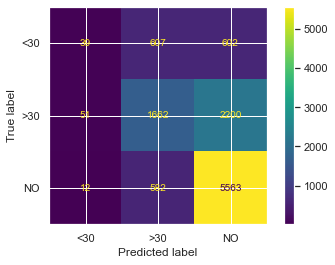

In [285]:
plot_result(log_reg_drop,'LassoLogistic')

# MODEL BUILDING : ITERATION 4 (FEATURE SELECTION USING WRAPPER METHODS

<a id="rfe"></a>
# 5. Recursive Feature Elimination (RFE)

It is the process that returns the significant features in the dataset by recursively removing the less significant feature subsets.

In [286]:
df = pd.read_csv('Diabetic_data_for_ml.csv',index_col=0)

df.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Law Enforcement,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Transfer,diag_1_Diabetes,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Diabetes,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Diabetes,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes,readmitted
0,1,1,41,0,1,0,0,0,1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,NO
1,1,3,59,0,18,0,0,0,9,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,>30
2,1,2,11,5,13,2,0,1,6,2,0,0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,NO
3,1,2,44,1,16,0,0,0,7,3,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,NO
4,1,1,51,0,8,0,0,0,5,4,0,0,0.0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,NO


In [287]:
X = df.drop(columns=['readmitted'])

In [288]:
y = df['readmitted']

In [289]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)

In [290]:
sc =  StandardScaler()

In [291]:
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)

In [292]:
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)

In [293]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((26408, 65), (11318, 65), (26408,), (11318,))

In [294]:
X_train.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Law Enforcement,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Transfer,diag_1_Diabetes,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Diabetes,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Diabetes,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes
0,-0.333703,-1.059905,-1.368868,-0.732433,0.054022,-0.275274,-0.21252,-0.450313,0.271614,0.255022,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-0.240672,-0.078564,0.606577,-0.157598,-0.129868,-0.925375,0.968829,-0.006154,-0.347271,-0.008703,-0.465306,-0.054077,-0.013761,-0.244358,-0.02538,2.387999,-0.08996,-0.012308,-0.26673,-0.697869,-0.247131,-0.544967,-0.294911,5.069686,-0.217707,-0.253875,-0.155567,-0.381229,-0.445363,1.381670,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,-0.250392,-0.577583,-0.968021,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,1.804418,1.004402,-2.021941
1,-0.333703,2.898564,-1.005895,3.064603,0.316530,1.404357,-0.21252,0.281224,1.182906,0.825317,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,0.638518,-0.078564,0.606577,-0.157598,-0.129868,-0.925375,-1.032174,-0.006154,-0.347271,-0.008703,2.149122,-0.054077,-0.013761,-0.244358,-0.02538,2.387999,-0.08996,-0.012308,-0.26673,1.432934,-0.247131,1.834973,-0.294911,-0.197251,-0.217707,-0.253875,-0.155567,-0.381229,-0.445363,-0.723762,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,-0.250392,-0.577583,-0.968021,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,1.804418,1.004402,0.494574
2,-0.333703,0.019677,-0.228095,0.533245,0.316530,-0.275274,-0.21252,-0.450313,-0.184032,0.255022,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-0.240672,-0.078564,0.606577,-0.157598,-0.129868,1.080643,-1.032174,-0.006154,2.879592,-0.008703,-0.465306,-0.054077,-0.013761,-0.244358,-0.02538,-0.418761,-0.08996,-0.012308,-0.26673,-0.697869,-0.247131,-0.544967,-0.294911,-0.197251,4.593337,-0.253875,-0.155567,-0.381229,-0.445363,-0.723762,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,3.993737,-0.577583,1.033036,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,-0.554195,1.004402,-2.021941
3,-0.333703,-1.059905,-2.094814,-0.099594,-0.208487,-0.275274,-0.21252,-0.450313,-1.095324,0.825317,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-0.240672,-0.078564,0.606577,-0.157598,-0.129868,1.080643,-1.032174,-0.006154,-0.347271,-0.008703,-0.465306,-0.054077,-0.013761,-0.244358,-0.02538,-0.418761,-0.08996,-0.012308,-0.26673,1.432934,-0.247131,-0.544967,-0.294911,-0.197251,4.593337,-0.253875,-0.155567,-0.381229,-0.445363,-0.723762,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,-0.250392,-0.577583,1.033036,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,-0.554195,1.004402,0.494574
4,-0.333703,0.019677,-0.072535,-0.099594,-0.602249,-0.275274,-0.21252,-0.450313,-0.184032,-1.455863,-0.179633,-0.462781,1.579743,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-1.999052,-0.078564,-1.

In [295]:
y_train.head()

91836    <30
68978    >30
4508     >30
20838     NO
74195     NO
Name: readmitted, dtype: object

In [296]:
y_train.unique()

array(['<30', '>30', 'NO'], dtype=object)

In [297]:
rfc_hybrid = RandomForestClassifier()

rfe_model = RFE(estimator=rfc_hybrid, n_features_to_select = None,verbose=2)


rfe_model = rfe_model.fit(X_train, y_train)


feat_index = pd.Series(data = rfe_model.ranking_, index = X_train.columns)


signi_feat_rfe = feat_index[feat_index==1].index


print(signi_feat_rfe)

Fitting estimator with 65 features.
Fitting estimator with 64 features.
Fitting estimator with 63 features.
Fitting estimator with 62 features.
Fitting estimator with 61 features.
Fitting estimator with 60 features.
Fitting estimator with 59 features.
Fitting estimator with 58 features.
Fitting estimator with 57 features.
Fitting estimator with 56 features.
Fitting estimator with 55 features.
Fitting estimator with 54 features.
Fitting estimator with 53 features.
Fitting estimator with 52 features.
Fitting estimator with 51 features.
Fitting estimator with 50 features.
Fitting estimator with 49 features.
Fitting estimator with 48 features.
Fitting estimator with 47 features.
Fitting estimator with 46 features.
Fitting estimator with 45 features.
Fitting estimator with 44 features.
Fitting estimator with 43 features.
Fitting estimator with 42 features.
Fitting estimator with 41 features.
Fitting estimator with 40 features.
Fitting estimator with 39 features.
Fitting estimator with 38 fe

In [298]:
df_hybrid = df_diabetic_for_ml[list(signi_feat_rfe)+['readmitted']]

In [299]:
X = df_hybrid.drop(columns=['readmitted'])

In [300]:
y = df_hybrid['readmitted']

In [301]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)

In [302]:
sc =  StandardScaler()

In [303]:
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)

In [304]:
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)

In [305]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((26408, 32), (11318, 32), (26408,), (11318,))

In [306]:
65-32

33

In [307]:
rfe_model = RandomForestClassifier()

Average Balanced Accuracy (CV=5), Test Set: 0.47251528646218344
Average Balanced Accuracy (CV=5), Training Set:  0.4789513101282905
Average Micro f1 (CV=5), Test Set: 0.6594802468345436
Average Micro f1 (CV=5), Training Set:  0.6591563950725028
              precision    recall  f1-score   support

         <30       0.41      0.04      0.08      1248
         >30       0.58      0.53      0.55      3913
          NO       0.71      0.87      0.78      6157

    accuracy                           0.66     11318
   macro avg       0.57      0.48      0.47     11318
weighted avg       0.63      0.66      0.62     11318



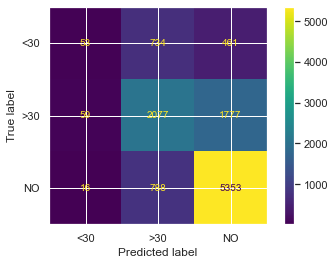

In [308]:
plot_result(rfe_model,'Random_Forest_RFE')

# RFE GRADIENT BOOSTING

In [309]:
df = pd.read_csv('Diabetic_data_for_ml.csv',index_col=0)

df.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Law Enforcement,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Transfer,diag_1_Diabetes,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Diabetes,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Diabetes,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes,readmitted
0,1,1,41,0,1,0,0,0,1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,NO
1,1,3,59,0,18,0,0,0,9,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,>30
2,1,2,11,5,13,2,0,1,6,2,0,0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,NO
3,1,2,44,1,16,0,0,0,7,3,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,NO
4,1,1,51,0,8,0,0,0,5,4,0,0,0.0,0.0,0.0,0.5,0.0,0.0,0.5,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,NO


In [310]:
X = df.drop(columns=['readmitted'])

In [311]:
y = df['readmitted']

In [312]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)

In [313]:
sc =  StandardScaler()

In [314]:
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)

In [315]:
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)

In [316]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((26408, 65), (11318, 65), (26408,), (11318,))

In [317]:
X_train.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Law Enforcement,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Transfer,diag_1_Diabetes,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Diabetes,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Diabetes,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes
0,-0.333703,-1.059905,-1.368868,-0.732433,0.054022,-0.275274,-0.21252,-0.450313,0.271614,0.255022,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-0.240672,-0.078564,0.606577,-0.157598,-0.129868,-0.925375,0.968829,-0.006154,-0.347271,-0.008703,-0.465306,-0.054077,-0.013761,-0.244358,-0.02538,2.387999,-0.08996,-0.012308,-0.26673,-0.697869,-0.247131,-0.544967,-0.294911,5.069686,-0.217707,-0.253875,-0.155567,-0.381229,-0.445363,1.381670,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,-0.250392,-0.577583,-0.968021,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,1.804418,1.004402,-2.021941
1,-0.333703,2.898564,-1.005895,3.064603,0.316530,1.404357,-0.21252,0.281224,1.182906,0.825317,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,0.638518,-0.078564,0.606577,-0.157598,-0.129868,-0.925375,-1.032174,-0.006154,-0.347271,-0.008703,2.149122,-0.054077,-0.013761,-0.244358,-0.02538,2.387999,-0.08996,-0.012308,-0.26673,1.432934,-0.247131,1.834973,-0.294911,-0.197251,-0.217707,-0.253875,-0.155567,-0.381229,-0.445363,-0.723762,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,-0.250392,-0.577583,-0.968021,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,1.804418,1.004402,0.494574
2,-0.333703,0.019677,-0.228095,0.533245,0.316530,-0.275274,-0.21252,-0.450313,-0.184032,0.255022,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-0.240672,-0.078564,0.606577,-0.157598,-0.129868,1.080643,-1.032174,-0.006154,2.879592,-0.008703,-0.465306,-0.054077,-0.013761,-0.244358,-0.02538,-0.418761,-0.08996,-0.012308,-0.26673,-0.697869,-0.247131,-0.544967,-0.294911,-0.197251,4.593337,-0.253875,-0.155567,-0.381229,-0.445363,-0.723762,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,3.993737,-0.577583,1.033036,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,-0.554195,1.004402,-2.021941
3,-0.333703,-1.059905,-2.094814,-0.099594,-0.208487,-0.275274,-0.21252,-0.450313,-1.095324,0.825317,-0.179633,-0.462781,-0.453291,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-0.240672,-0.078564,0.606577,-0.157598,-0.129868,1.080643,-1.032174,-0.006154,-0.347271,-0.008703,-0.465306,-0.054077,-0.013761,-0.244358,-0.02538,-0.418761,-0.08996,-0.012308,-0.26673,1.432934,-0.247131,-0.544967,-0.294911,-0.197251,4.593337,-0.253875,-0.155567,-0.381229,-0.445363,-0.723762,-0.181478,-0.223091,-0.101064,-0.135628,-0.103146,-0.250392,-0.577583,1.033036,-0.163309,-0.178225,-0.080015,-0.132555,-0.056825,-0.163797,-0.554195,1.004402,0.494574
4,-0.333703,0.019677,-0.072535,-0.099594,-0.602249,-0.275274,-0.21252,-0.450313,-0.184032,-1.455863,-0.179633,-0.462781,1.579743,-0.102392,-0.183672,-0.30208,-0.258146,-0.250659,-1.999052,-0.078564,-1.

In [318]:
y_train.head()

91836    <30
68978    >30
4508     >30
20838     NO
74195     NO
Name: readmitted, dtype: object

In [319]:
y_train.unique()

array(['<30', '>30', 'NO'], dtype=object)

In [320]:
rfc_hybrid = GradientBoostingClassifier()

rfe_model = RFE(estimator=rfc_hybrid, n_features_to_select = None,verbose=2)


rfe_model = rfe_model.fit(X_train, y_train)


feat_index = pd.Series(data = rfe_model.ranking_, index = X_train.columns)


signi_feat_rfe = feat_index[feat_index==1].index


print(signi_feat_rfe)

Fitting estimator with 65 features.
Fitting estimator with 64 features.
Fitting estimator with 63 features.
Fitting estimator with 62 features.
Fitting estimator with 61 features.
Fitting estimator with 60 features.
Fitting estimator with 59 features.
Fitting estimator with 58 features.
Fitting estimator with 57 features.
Fitting estimator with 56 features.
Fitting estimator with 55 features.
Fitting estimator with 54 features.
Fitting estimator with 53 features.
Fitting estimator with 52 features.
Fitting estimator with 51 features.
Fitting estimator with 50 features.
Fitting estimator with 49 features.
Fitting estimator with 48 features.
Fitting estimator with 47 features.
Fitting estimator with 46 features.
Fitting estimator with 45 features.
Fitting estimator with 44 features.
Fitting estimator with 43 features.
Fitting estimator with 42 features.
Fitting estimator with 41 features.
Fitting estimator with 40 features.
Fitting estimator with 39 features.
Fitting estimator with 38 fe

In [321]:
df_hybrid = df_diabetic_for_ml[list(signi_feat_rfe)+['readmitted']]

In [322]:
X = df_hybrid.drop(columns=['readmitted'])

In [323]:
y = df_hybrid['readmitted']

In [324]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,stratify=y, random_state=42)

In [325]:
sc =  StandardScaler()

In [326]:
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X_train.columns)

In [327]:
X_test = pd.DataFrame(sc.transform(X_test),columns=X_train.columns)

In [328]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((26408, 32), (11318, 32), (26408,), (11318,))

In [329]:
model = GradientBoostingClassifier()

Average Balanced Accuracy (CV=5), Test Set: 0.4788008181821959
Average Balanced Accuracy (CV=5), Training Set:  0.48529652434732284
Average Micro f1 (CV=5), Test Set: 0.6644282972819782
Average Micro f1 (CV=5), Training Set:  0.666994722423359
              precision    recall  f1-score   support

         <30       0.37      0.04      0.07      1248
         >30       0.60      0.53      0.56      3913
          NO       0.71      0.89      0.79      6157

    accuracy                           0.67     11318
   macro avg       0.56      0.49      0.47     11318
weighted avg       0.63      0.67      0.63     11318



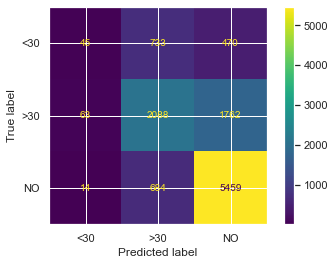

In [330]:
plot_result(model,'Gradient_Boosting_RFE')

In [331]:
# FINAL STACKING MODEL

In [332]:
base_learners = [('rf_model', RandomForestClassifier(criterion = 'entropy', max_features = 'auto',
                                                     n_estimators = 150, random_state = 10)),

                 ('logistic_model',LogisticRegression(penalty='l1',class_weight='balanced',solver='saga',C=0.015,random_state=10)),

                 ('xgb_moel',XGBClassifier(base_score=0.5, booster='gbtree',verbosity=None))
                 ]



stack_model = StackingClassifier(estimators = base_learners, final_estimator = GaussianNB())

In [333]:
# plot_result(stack_model,'Final_Stacking_Classifier')

## SMOTE

In [334]:
df=df_encoding_diabetic
print(df.shape)
df.head()

(37726, 30)


,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,rosiglitazone,insulin,change,diabetesMed,readmitted
0,1,1,41,0,1,0,0,0,1,Caucasian,Female,0,Other,Other,Referral,Diabetes,Diabetes,Diabetes,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,No,No,NO
1,1,3,59,0,18,0,0,0,9,Caucasian,Female,1,Emergency,Discharged Home,Emergency Room,other,Diabetes,other,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Ch,Yes,>30
2,1,2,11,5,13,2,0,1,6,AfricanAmerican,Female,2,Emergency,Discharged Home,Emergency Room,other,Diabetes,other,0,0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,No,Yes,NO
3,1,2,44,1,16,0,0,0,7,Caucasian,Male,3,Emergency,Discharged Home,Emergency Room,other,Diabetes,Circulatory,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Ch,Yes,NO
4,1,1,51,0,8,0,0,0,5,Caucasian,Male,4,Emergency,Discharged Home,Emergency Room,Neoplasms,Neoplasms,Diabetes,0,0,0.0,0.0,0.0,0.5,0.0,0.0,0.5,Ch,Yes,NO


In [335]:
numerical_data=df.select_dtypes(np.number)
categorical_data=df.select_dtypes(np.object)
Y=categorical_data['readmitted']
categorical_data.drop(columns='readmitted',inplace=True)

### Scaling

In [336]:
sc=StandardScaler()
X_scaled=sc.fit_transform(numerical_data)
final_num=pd.DataFrame(data=X_scaled,columns=numerical_data.columns,index=numerical_data.index)

### Encoding

In [337]:
final_cat=pd.get_dummies(categorical_data,drop_first=True)

### Concatenating

In [338]:
final_data=pd.concat([final_num,final_cat],axis=1)
final_data.shape

(37726, 65)

### Train Test Split

In [339]:
X_train, X_test, y_train, y_test = train_test_split(final_data, Y, test_size=0.30,stratify=Y, random_state=42)

In [340]:
X_train.head()

,patient_frequency,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,age,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,rosiglitazone,insulin,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Male,admission_type_id_Emergency,admission_type_id_Newborn,admission_type_id_Other,admission_type_id_Trauma Center,admission_type_id_Urgent,discharge_disposition_id_Hospice,discharge_disposition_id_In/Still/Outpatient,discharge_disposition_id_Other,discharge_disposition_id_Transferred Within,discharge_disposition_id_Transferred/Referred,discharge_disposition_id_left AMA,admission_source_id_Law Enforcement,admission_source_id_Other,admission_source_id_Referral,admission_source_id_Transfer,diag_1_Diabetes,diag_1_Digestive,diag_1_Genitourinary,diag_1_Injury,diag_1_Musculoskeletal,diag_1_Neoplasms,diag_1_Respiratory,diag_1_other,diag_2_Diabetes,diag_2_Digestive,diag_2_Genitourinary,diag_2_Injury,diag_2_Musculoskeletal,diag_2_Neoplasms,diag_2_Respiratory,diag_2_other,diag_3_Diabetes,diag_3_Digestive,diag_3_Genitourinary,diag_3_Injury,diag_3_Musculoskeletal,diag_3_Neoplasms,diag_3_Respiratory,diag_3_other,change_No,diabetesMed_Yes
91836,-0.331511,-1.055227,-1.366173,-0.731772,0.056377,-0.278799,-0.219336,-0.451607,0.266579,0.252195,-0.181226,-0.464649,-0.445837,-0.101564,-0.182495,-0.297837,-0.256724,-0.246978,-0.237378,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
68978,-0.331511,2.904915,-1.004123,3.067157,0.319310,1.435620,-0.219336,0.289372,1.174820,0.822530,-0.181226,-0.464649,-0.445837,-0.101564,-0.182495,-0.297837,-0.256724,-0.246978,0.637423,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
4508,-0.331511,0.024811,-0.228302,0.534538,0.319310,-0.278799,-0.219336,-0.451607,-0.187542,0.252195,-0.181226,-0.464649,-0.445837,-0.101564,-0.182495,-0.297837,-0.256724,-0.246978,-0.237378,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0
20838,-0.331511,-1.055227,-2.090273,-0.098617,-0.206557,-0.278799,-0.219336,-0.451607,-1.095782,0.822530,-0.181226,-0.464649,-0.445837,-0.101564,-0.182495,-0.297837,-0.256724,-0.246978,-0.237378,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1
74195,-0.331511,0.024811,-0.073137,-0.098617,-0.600957,-0.278799,-0.219336,-0.451607,-0.187542,-1.458809,-0.181226,-0.464649,1.593898,-0.101564,-0.182495,-0.297837,-0.256724,-0.246978,-1.986981,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [341]:
number=np.arange(19,65,1)

In [342]:
smote=SMOTENC(categorical_features=number)

In [343]:
x_train_smote,y_train_smote=smote.fit_resample(X_train,y_train)

In [344]:
X_train, y_train=x_train_smote,y_train_smote

### Random Forest With SMOTE

In [345]:
model=RandomForestClassifier()

Average Balanced Accuracy (CV=5), Test Set: 0.4734353260701729
Average Balanced Accuracy (CV=5), Training Set:  0.7205047384833705
Average Micro f1 (CV=5), Test Set: 0.6593037635709813
Average Micro f1 (CV=5), Training Set:  0.7210084397054513
              precision    recall  f1-score   support

         <30       0.32      0.12      0.17      1248
         >30       0.56      0.53      0.54      3913
          NO       0.72      0.83      0.77      6157

    accuracy                           0.65     11318
   macro avg       0.53      0.49      0.50     11318
weighted avg       0.62      0.65      0.63     11318



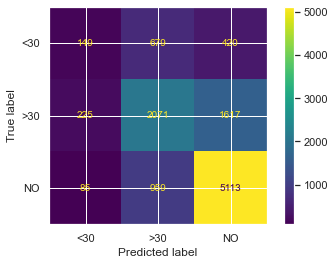

In [346]:
plot_result(model,'RandomForestClassifier_With_SMOTE')

### XGB with SMOTE

In [347]:
model=XGBClassifier()

[13:52:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:53:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:53:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:53:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

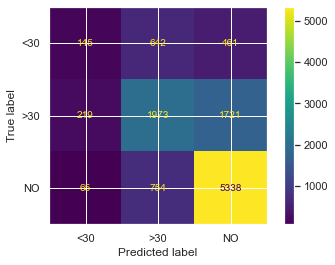

In [348]:
plot_result(model,'XGB_With_SMOTE')

### Stacking Classifier with SMOTE and Hyper Tuning

In [349]:
base_learners = [('rf_model', RandomForestClassifier(criterion = 'entropy', max_depth = 30, max_features = 'auto', 
                                                     max_leaf_nodes = 8, min_samples_leaf = 5, min_samples_split = 6, 
                                                     n_estimators = 30)),
                 
                 ('logistic_model',LogisticRegression(penalty='l1',class_weight='balanced',solver='liblinear',C=0.5)),
                 
                 ('xgb_moel',XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,colsample_bynode=1, 
                                           colsample_bytree=1, gamma=0, gpu_id=-1,importance_type='gain', 
                                           interaction_constraints='',learning_rate=0.300000012, max_delta_step=0, max_depth=6,
                                           min_child_weight=1, missing=np.nan, monotone_constraints='()',n_estimators=100, 
                                           n_jobs=4, num_parallel_tree=1,objective='multi:softprob', random_state=10, 
                                           reg_alpha=0,reg_lambda=1, scale_pos_weight=None, subsample=1,tree_method='exact', 
                                           validate_parameters=1, verbosity=None)),
                 ('decision_model',DecisionTreeClassifier(criterion='gini',max_depth=10,min_samples_split=8,min_samples_leaf=4,class_weight='balanced'))]

model = StackingClassifier(estimators = base_learners, final_estimator = GaussianNB())

[13:56:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:57:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:57:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:58:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

[14:06:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:06:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:06:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:06:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

[14:10:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:10:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:10:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:10:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

[14:16:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:16:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:16:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:17:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

[14:21:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:22:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:22:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:22:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

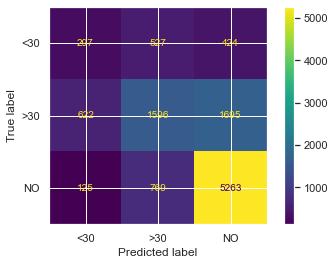

In [350]:
plot_result(model,'Stacking_With_Tuning_and_SMOTE')

### Stacking Classifier with SMOTE and without Hyper Tuning

In [351]:
base_learners = [('rf_model', RandomForestClassifier()),
                 
                 ('logistic_model',LogisticRegression()),
                 
                 ('xgb_moel',XGBClassifier()),
                 ('decision_model',DecisionTreeClassifier())]

model = StackingClassifier(estimators = base_learners, final_estimator = GaussianNB())

[14:23:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:25:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:25:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:26:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

[14:37:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:37:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:37:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:38:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

[14:42:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:43:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:43:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:43:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

[14:51:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:51:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:52:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:52:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

[14:59:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:59:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:59:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:59:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

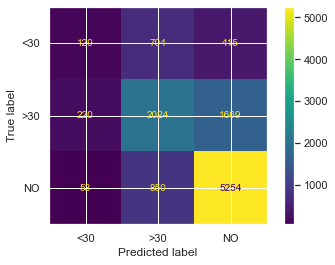

In [352]:
plot_result(model,'Stacking_With_SMOTE')

### DataFrame

In [353]:
d = {}
for key in cv_acc_test:
    l = [cv_acc[key],cv_acc_test[key],cv_acc_train[key],cv_f1_test[key],cv_f1_train[key],cv_FPR[key],cv_TPR[key]]
    d.update({key:l})

In [354]:
model_performance_df = pd.DataFrame(d,index=['Accuracy','Balanced_Test_Accuracy','Balanced_Train_Accuracy','Micro_f1_Test','Micro_f1_Train','False_Positive_Rate','True_Positive_Rate']).T

In [355]:
model_performance_df

,Accuracy,Balanced_Test_Accuracy,Balanced_Train_Accuracy,Micro_f1_Test,Micro_f1_Train,False_Positive_Rate,True_Positive_Rate
LogisticRegression_base,0.641014,45.04,45.38,64.06,64.06,48.397436,42.422694
DecisionTreeClassifier_base,0.537904,43.09,44.17,53.38,53.91,44.711538,45.744953
RandomForestClassifier_base,0.662396,47.31,48.16,65.76,66.23,58.894231,53.820598
AdaBoostClassifier_base,0.647818,46.98,47.30,65.12,64.88,50.400641,46.230514
GradientBoostingClassifier_base,0.670436,48.01,48.47,66.51,66.60,58.653846,53.232814
LassoLogistic,0.641810,44.87,45.44,63.96,64.16,48.637821,42.473805
Random_Forest_RFE,0.661159,47.25,47.90,65.95,65.92,58.814103,53.079479
Gradient_Boosting_RFE,0.670790,47.88,48.53,66.44,66.70,58.733974,53.360593
RandomForestClassifier_With_SMOTE,0.647906,47.34,72.05,65.93,72.10,54.407051,52.926144
XGB_With_SMOTE,0.658774,47.32,67.81,64.08,67.81,51.442308,50.421671
